In [3]:
!pip install gurobipy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.8/14.8 MB 87.9 MB/s eta 0:00:00:00:01:01


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
# from sklearn.preprocessing import

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Layer, Concatenate
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.callbacks import EarlyStopping

import torch
import torch.nn as nn
import torch.nn.functional as F

import gurobipy as gp
from gurobipy import GRB

# Optional: torch_geometric for graph layers
try:
    from torch_geometric.nn import GATConv
    from torch_geometric.data import Data as GeoData
except Exception:
    GATConv = None
    GeoData = None


# Data Prep


In [5]:
data_23_24 = pd.read_csv('https://raw.githubusercontent.com/ilyandho/FPL-Optimal-Transfer/refs/heads/FantasyGo/FPL%20predictors/Fantasy%20Go/fantasyGo_FPL.csv')
fg_managers = pd.read_csv('https://raw.githubusercontent.com/ilyandho/FPL-Optimal-Transfer/refs/heads/FantasyGo/FPL%20predictors/Fantasy%20Go/fgo_managers.csv')
fg_managers['points'] = fg_managers['points'].str.split(' ').str[0]
fg_managers['points'] = pd.to_numeric(fg_managers['points'], errors='coerce')

In [5]:
features = [ 'position', 'whh', 'whd', 'wha', 'was_home', 'ownership_change', 'percenatge_net_transfers',

            'clean_sheets', 'expected_assists', 'expected_goal_involvements', 'expected_goals', 'expected_goals_conceded', 'goals_conceded', 'goals_scored', 'ict_index',
            'influence', 'creativity', 'threat', 'minutes', 'own_goals', 'penalties_missed', 'penalties_saved', 'red_cards', 'yellow_cards', 'saves', 'starts',
            'team_a_score', 'team_h_score', 'score', 'goals', 'shots', 'xG', 'xA', 'assists_x', 'key_passes', 'npg', 'npxG', 'xGChain',  'xGBuildup',  'xP',

            'clean_sheets_1', 'expected_assists_1', 'expected_goal_involvements_1', 'expected_goals_1', 'expected_goals_conceded_1', 'goals_conceded_1', 'goals_scored_1', 'ict_index_1',
            'influence_1', 'creativity_1', 'threat_1', 'minutes_1', 'own_goals_1', 'penalties_missed_1', 'penalties_saved_1', 'red_cards_1', 'yellow_cards_1', 'saves_1', 'starts_1',
            'team_a_score_1', 'team_h_score_1', 'score_bps_1', 'goals_1', 'shots_1', 'xG_1', 'xA_1', 'assists_x_1', 'key_passes_1', 'npg_1', 'npxG_1', 'xGChain_1',
            'xGBuildup_1',  'xP_1',

            'clean_sheets_2', 'expected_assists_2', 'expected_goal_involvements_2', 'expected_goals_2', 'expected_goals_conceded_2', 'goals_conceded_2', 'goals_scored_2', 'ict_index_2',
            'influence_2', 'creativity_2', 'threat_2', 'minutes_2', 'own_goals_2', 'penalties_missed_2', 'penalties_saved_2', 'red_cards_2', 'yellow_cards_2', 'saves_2', 'starts_2',
            'team_a_score_2', 'team_h_score_2', 'score_bps_2', 'goals_2', 'shots_2', 'xG_2', 'xA_2', 'assists_x_2', 'key_passes_2', 'npg_2', 'npxG_2', 'xGChain_2',
            'xGBuildup_2',  'xP_2',

            'clean_sheets_3', 'expected_assists_3', 'expected_goal_involvements_3', 'expected_goals_3', 'expected_goals_conceded_3', 'goals_conceded_3', 'goals_scored_3', 'ict_index_3',
            'influence_3', 'creativity_3', 'threat_3', 'minutes_3', 'own_goals_3', 'penalties_missed_3', 'penalties_saved_3', 'red_cards_3', 'yellow_cards_3', 'saves_3', 'starts_3',
            'team_a_score_3', 'team_h_score_3', 'score_bps_3', 'goals_3', 'shots_3', 'xG_3', 'xA_3', 'assists_x_3', 'key_passes_3', 'npg_3', 'npxG_3', 'xGChain_3',
            'xGBuildup_3',  'xP_3',

            'clean_sheets_4', 'expected_assists_4', 'expected_goal_involvements_4', 'expected_goals_4', 'expected_goals_conceded_4', 'goals_conceded_4', 'goals_scored_4', 'ict_index_4',
            'influence_4', 'creativity_4', 'threat_4', 'minutes_4', 'own_goals_4', 'penalties_missed_4', 'penalties_saved_4', 'red_cards_4', 'yellow_cards_4', 'saves_4', 'starts_4',
            'team_a_score_4', 'team_h_score_4', 'score_bps_4', 'goals_4', 'shots_4', 'xG_4', 'xA_4', 'assists_x_4', 'key_passes_4', 'npg_4', 'npxG_4', 'xGChain_4',
            'xGBuildup_4',  'xP_4',

            'clean_sheets_5', 'expected_assists_5', 'expected_goal_involvements_5', 'expected_goals_5', 'expected_goals_conceded_5', 'goals_conceded_5', 'goals_scored_5', 'ict_index_5',
            'influence_5', 'creativity_5', 'threat_5', 'minutes_5', 'own_goals_5', 'penalties_missed_5', 'penalties_saved_5', 'red_cards_5', 'yellow_cards_5', 'saves_5', 'starts_5',
            'team_a_score_5', 'team_h_score_5', 'score_bps_5', 'goals_5', 'shots_5', 'xG_5', 'xA_5', 'assists_x_5', 'key_passes_5', 'npg_5', 'npxG_5', 'xGChain_5',
            'xGBuildup_5',  'xP_5'
                        ]


cols = [ 'creativity','ict_index', 'influence','selected',  'threat', 'transfers_balance', 'transfers_in', 'transfers_out', 'value', 'was_home',
        'team_h_difficulty', 'team_a_difficulty', 'ownership_change', 'percenatge_net_transfers', 'whh', 'whd', 'wha', 'round', 'fpl_name', 'xP', 'team', 'opponent_team', 'position',


        'opponent_xgc_3', 'opponent_xgc_5', 'opponent_gc_3', 'opponent_gc_5', 'opponent_goals_scored_3', 'opponent_goals_scored_5', 'team_was_home', 'opponent_ict', 'opponent_xG',
        'opponent_xA', 'opponent_goals_scored', 'opponent_shots', 'opponent_npxG', 'opponent_value', 'opponent_whh', 'opponent_whd', 'opponent_wha', 'opponent_difficulty',

        'clean_sheets_1', 'expected_assists_1', 'expected_goal_involvements_1', 'expected_goals_1', 'expected_goals_conceded_1', 'goals_conceded_1', 'goals_scored_1', 'ict_index_1',
        'influence_1', 'creativity_1', 'threat_1', 'minutes_1', 'own_goals_1', 'penalties_missed_1', 'penalties_saved_1', 'red_cards_1', 'yellow_cards_1', 'saves_1', 'starts_1',
        'team_a_score_1', 'team_h_score_1', 'score_bps_1', 'goals_1', 'shots_1', 'xG_1', 'xA_1',  'assists_x_1', 'key_passes_1', 'npg_1', 'npxG_1', 'xGChain_1', 'xGBuildup_1',
        'xP_1',

        'clean_sheets_3', 'expected_assists_3', 'expected_goal_involvements_3', 'expected_goals_3', 'expected_goals_conceded_3', 'goals_conceded_3', 'goals_scored_3', 'ict_index_3',
        'influence_3', 'creativity_3', 'threat_3', 'minutes_3', 'own_goals_3', 'penalties_missed_3', 'penalties_saved_3', 'red_cards_3', 'yellow_cards_3', 'saves_3', 'starts_3',
        'team_a_score_3', 'team_h_score_3', 'score_bps_3', 'goals_3', 'shots_3', 'xG_3', 'xA_3',  'assists_x_3', 'key_passes_3', 'npg_3', 'npxG_3', 'xGChain_3', 'xGBuildup_3',
        'xP_3',

        'clean_sheets_5', 'expected_assists_5', 'expected_goal_involvements_5', 'expected_goals_5', 'expected_goals_conceded_5', 'goals_conceded_5', 'goals_scored_5', 'ict_index_5',
        'influence_5', 'creativity_5', 'threat_5', 'minutes_5', 'own_goals_5', 'penalties_missed_5', 'penalties_saved_5', 'red_cards_5', 'yellow_cards_5', 'saves_5', 'starts_5',
        'team_a_score_5', 'team_h_score_5', 'score_bps_5', 'goals_5', 'shots_5', 'xG_5', 'xA_5',  'assists_x_5', 'key_passes_5', 'npg_5', 'npxG_5', 'xGChain_5', 'xGBuildup_5',
        'xP_5',

        ]


## 23/24 - Data Prep


In [19]:
play_data = data_23_24.copy()


play_data['gw'] = play_data['round']
play_data['team'] = play_data['player_team']
play_data['opponent_team'] = play_data.apply(lambda row: row['a_team'] if row['was_home'] == 1 else row['h_team'], axis=1)
play_data[['h_team', 'a_team', 'was_home', 'team', 'opponent_team', 'player_team', 'gw', 'round']]


sum_features = [
    'creativity', 'influence', 'threat',
    'expected_goals_1', 'expected_assists_1', 'expected_goal_involvements_1',
    'expected_goals_conceded_1', 'goals_conceded_1', 'goals_scored_1',
    'shots_1', 'key_passes_1', 'npg_1', 'npxG_1',
]

mean_features = [
    'value', 'ict_index', 'selected', 'transfers_in', 'transfers_out'
]

# max_features = [
#     'minutes_1', 'influence'
# ]

identity_features = [
    'whh', 'whd', 'wha',    # bookmaker odds
    'was_home',
    'opponent_team'
]

team_df = play_data.groupby(['team', 'gw']).agg({
    **{f: 'sum' for f in sum_features},
    **{f: 'mean' for f in mean_features},
    # **{f: 'max' for f in max_features},
    **{f: 'first' for f in identity_features}
}).reset_index()

for col in ['expected_goals_conceded_1','goals_conceded_1','goals_scored_1']:
    team_df[f'{col}_3'] = team_df.groupby('team')[col].rolling(3, min_periods=1).mean().reset_index(0, drop=True)
    team_df[f'{col}_5'] = team_df.groupby('team')[col].rolling(5, min_periods=1).mean().reset_index(0, drop=True)

team_df = team_df.rename(columns={
    'creativity': 'team_creativity',
    'influence': 'team_influence',
    'threat': 'team_threat',
    'expected_goals_1': 'team_expected_goals',
    'expected_assists_1': 'team_expected_assists',
    'expected_goal_involvements_1': 'team_expected_goal_involvements',
    'expected_goals_conceded_1': 'team_expected_goals_conceded',
    'goals_conceded_1': 'team_goals_conceded',
    'goals_scored_1': 'team_goals_scored',
    'shots_1': 'team_shots',
    'attempted_passes_1': 'team_attempted_passes',
    'key_passes_1': 'team_key_passes',
    'npg_1': 'team_npg',
    'npxG_1': 'team_npxG',
    'value': 'team_value',
    'ict_index': 'team_ict_index',
    'selected': 'team_selected',
    'transfers_in': 'team_transfers_in',
    'transfers_out': 'team_transfers_out',
    'whh': 'team_whh',
    'whd': 'team_whd',
    'wha': 'team_wha',
    'was_home': 'team_was_home',
    'expected_goals_conceded_1_3': 'team_expected_goals_conceded_3',
    'expected_goals_conceded_1_5': 'team_expected_goals_conceded_5',
    'goals_conceded_1_3': 'team_goals_conceded_3',
    'goals_conceded_1_5': 'team_goals_conceded_5',
    'goals_scored_1_3': 'team_goals_scored_3',
    'goals_scored_1_5': 'team_goals_scored_5',

    })

opponent_stats = team_df[['team', 'gw','team_ict_index', 'team_expected_goals', 'team_expected_assists', 'team_goals_scored', 'team_shots', 'team_npxG', 'team_value',
                          'team_whh', 'team_whd', 'team_wha', 'team_expected_goals_conceded_3', 'team_expected_goals_conceded_5', 'team_goals_conceded_3', 'team_goals_conceded_5',
                          'team_goals_scored_3', 'team_goals_scored_5']].rename(

                columns={'team': 'opponent_team', 'team_ict_index':'opponent_ict','team_expected_goals': 'opponent_xG', 'team_expected_assists': 'opponent_xA',
                        'team_goals_scored': 'opponent_goals_scored', 'team_shots': 'opponent_shots', 'team_npxG': 'opponent_npxG', 'team_value': 'opponent_value',
                        'team_whh': 'opponent_whh', 'team_whd': 'opponent_whd', 'team_wha': 'opponent_wha', 'team_expected_goals_conceded_3': 'opponent_xgc_3',
                        'team_expected_goals_conceded_5': 'opponent_xgc_5', 'team_goals_conceded_3': 'opponent_gc_3', 'team_goals_conceded_5': 'opponent_gc_5',
                        'team_goals_scored_3': 'opponent_goals_scored_3', 'team_goals_scored_5': 'opponent_goals_scored_5'
                        })

# 2. Merge this back into the original dataframe matching on 'opponent_team' and 'gw'
team_df = team_df.merge(opponent_stats, on=['opponent_team', 'gw'], how='left')

final_df = play_data.merge(team_df, on=['opponent_team', 'team','gw'], how='left')

# ODI = Probability of Draw + Probability of Away Win (assuming player's team is Home odds)
# A high ODI means a tough fixture (Player's team is less likely to win).
# ODI = Probability of Draw + Probability of Home Win (assuming player's team is Away odds)
# A high ODI means a tough fixture (Player's team is more likely to win).
final_df['opponent_difficulty'] = final_df.apply(
    lambda row: (row['whd'] + row['wha'])
    if row['player_team'] == row['h_team']
    else (row['whd'] + row['whh']),
    axis=1
)

final_df['team_difficulty'] = final_df.apply(
    lambda row: (row['whd'] + row['wha'])
    if row['player_team'] == row['a_team']
    else (row['whd'] + row['whh']),
    axis=1
)


CATEGORICAL_COLS = ['position', 'team', 'opponent_team']

# Initialize encoder
# handle_unknown='ignore' ensures new teams result in all-zero rows for those features
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Fit and transform the categorical columns
encoded_array = encoder.fit(final_df[CATEGORICAL_COLS])

# Create a DataFrame with the encoded features
encoded_cols = encoder.get_feature_names_out(CATEGORICAL_COLS)
encoded_df = pd.DataFrame(
    encoder.transform(final_df[CATEGORICAL_COLS]),
    columns=encoded_cols,
    index=final_df.index
)


cols = [*cols, *encoded_cols]
# Combine with numerical data
final_df = pd.concat([final_df, encoded_df], axis=1) #.drop(columns=CATEGORICAL_COLS)
final_df

NameError: name 'data_23_24' is not defined

### Predictors


In [ ]:
# --- Step 1: Data Preparation Function ---
def prepare_fpl_data(data, cols):
    """
    Prepares features (X), conditional parameters (M), targets (Y),
    and gameweeks (GW) for the AffinePNN model.
    """
    cols_ = list(cols)
    if 'team_difficulty' not in cols_:
        cols_.append('team_difficulty')

    data_ = data[cols_].copy()

    # Target and metadata columns
    target_col = ['xP', 'fpl_name']
    gameweek_col = 'round'
    POSITION_COL = 'position'
    M_COLS = ['opponent_difficulty' , 'team_difficulty' , 'was_home'] #, 'whh', 'whd', 'wha'

    # Handle Categorical Features
    CATEGORICAL_COLS = [POSITION_COL, 'team', 'opponent_team']

    data_ = data_.drop(columns=CATEGORICAL_COLS)
    # df = pd.get_dummies(data_, columns=CATEGORICAL_COLS, prefix=CATEGORICAL_COLS, dummy_na=False)
    # print('----->', data_.shape)
    # print('<-----', df.shape,CATEGORICAL_COLS )
    # 2. Target Variable (Y)
    Y = data_[target_col].fillna(0)

    # 3. Input Features (X)
    EXCLUDE_COLS = [*target_col, gameweek_col, *M_COLS]

    # Find position-related columns for explicit inclusion if needed
    new_position_cols = [col for col in data_.columns if col.startswith(f'{POSITION_COL}_')]

    # Filter feature columns
    X_cols = [c for c in data_.columns if c not in EXCLUDE_COLS and c != POSITION_COL]

    # Final check of column existence
    X_cols = [col for col in X_cols if col in data_.columns]

    # Convert to numpy
    X = data_[X_cols].fillna(0).values.astype(np.float32)
    M = data_[M_COLS].fillna(0).values.astype(np.float32)
    GW = data_[gameweek_col].values

    print(f"Data prepared. X shape: {X.shape}, M shape: {M.shape}, Y shape: {Y.shape}")
    return X, M, Y, GW, X_cols

def transform_data(final_df, cols, gw):
    # Prepare data
    X_full, M_full, Y_full, GW_full, X_cols = prepare_fpl_data(final_df, cols)
    # print(X_full.shape)
    # Split
    GW_TRAIN_END = gw - 1
    train_mask = GW_full <= GW_TRAIN_END
    test_mask = GW_full == (GW_TRAIN_END + 1)

    X_train, M_train, Y_train_raw = X_full[train_mask], M_full[train_mask], Y_full[train_mask]
    X_test, M_test, Y_test_raw = X_full[test_mask], M_full[test_mask], Y_full[test_mask]

    Y_train = Y_train_raw['xP'].values
    Y_train_names = Y_train_raw['fpl_name'].values

    Y_test = Y_test_raw['xP'].values
    Y_test_names = Y_test_raw['fpl_name'].values

    # Scaling
    scaler_x = StandardScaler()
    X_train_scaled = scaler_x.fit_transform(X_train)

    if X_test.size > 0:
        X_test_scaled = scaler_x.transform(X_test)
    else:
        X_test_scaled = scaler_x

    scaler_m = StandardScaler()
    M_train_scaled = scaler_m.fit_transform(M_train)

    if M_test.size > 0:
        M_test_scaled = scaler_m.transform(M_test)
    else:
        M_test_scaled = scaler_m

    # print('----', Y_train)

    return (X_train_scaled, M_train_scaled, train_mask, Y_train, Y_train_names), (X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names), GW_full, X_cols#, scaler_x, scaler_m

# --- Step 2: Custom Affine Conditioning Layer ---
class AffineConditioning(Layer):
    """
    Custom Keras Layer implementing the core Affine Parametric Neural Network (AffinePNN) logic.
    z = (phi * m + s0) * x + (psi * m + b0)
    """
    def __init__(self, units, activation=None, **kwargs):
        super(AffineConditioning, self).__init__(**kwargs)
        self.units = units
        self.activation = tf.keras.activations.get(activation)

    def build(self, input_shape):
        # input_shape: [feature_input_shape, parameter_input_shape]
        feature_dim = input_shape[0][-1]
        param_dim = input_shape[1][-1]

        # Weights to transform the parameter 'm' into scale and bias adjustments
        # Shape is (param_dim, feature_dim) to map conditions to feature space
        self.phi = self.add_weight(shape=(param_dim, feature_dim),
                                   initializer='glorot_uniform', trainable=True, name='phi')
        self.psi = self.add_weight(shape=(param_dim, feature_dim),
                                   initializer='glorot_uniform', trainable=True, name='psi')

        # Base scaling and bias
        self.s0 = self.add_weight(shape=(feature_dim,), initializer='ones', trainable=True, name='s0')
        self.b0 = self.add_weight(shape=(feature_dim,), initializer='zeros', trainable=True, name='b0')

        self.built = True

    def call(self, inputs):
        x_in, m = inputs # x_in: (batch, feat), m: (batch, cond)

        # Calculate scale and bias based on conditional input m
        # (batch, cond) @ (cond, feat) -> (batch, feat)
        s_m = tf.matmul(m, self.phi)
        b_m = tf.matmul(m, self.psi)

        s = s_m + self.s0
        b = b_m + self.b0

        # Apply affine transformation
        x_out = s * x_in + b

        if self.activation is not None:
            return self.activation(x_out)
        return x_out

    def get_config(self):
        config = super(AffineConditioning, self).get_config()
        config.update({
            'units': self.units,
            'activation': tf.keras.activations.serialize(self.activation),
        })
        return config

# --- Step 3: Model Architecture ---
def build_affine_pnn(input_dim_x, input_dim_m, output_dim_y, hidden_units=128):
    """
    Builds the Affine Parametric Neural Network (AffinePNN) Model.
    """
    L2_REG = 0.001

    X_input = Input(shape=(input_dim_x,), name='X_input')
    M_input = Input(shape=(input_dim_m,), name='M_input')

    # Initial Dense Layer
    x = Dense(hidden_units, activation='relu',
              kernel_regularizer=tf.keras.regularizers.l2(L2_REG), name='Dense_1')(X_input)

    # Affine Conditioning Block 1
    x = AffineConditioning(units=hidden_units, activation='relu', name='Affine_Cond_1')([x, M_input])

    # Standard Dense Layer
    x = Dense(hidden_units // 2, activation='relu',
              kernel_regularizer=tf.keras.regularizers.l2(L2_REG), name='Dense_2')(x)

    # Affine Conditioning Block 2
    x = AffineConditioning(units=hidden_units // 2, activation='relu', name='Affine_Cond_2')([x, M_input])

    # Final Prediction Layer
    output = Dense(output_dim_y, activation='linear', name='Output')(x)

    model = Model(inputs=[X_input, M_input], outputs=output, name='AffinePNN_FPL')
    return model

def plot_training_history(history):
    """
    Plots the training and validation loss/metrics including MSE.
    """
    metrics = ['loss', 'mae', 'mse']
    plt.figure(figsize=(18, 5))

    for i, metric in enumerate(metrics):
        plt.subplot(1, 3, i + 1)
        plt.plot(history.history[metric], label='Train')
        plt.plot(history.history[f'val_{metric}'], label='Validation')
        plt.title(f'Model {metric.upper()}')
        plt.xlabel('Epoch')
        plt.ylabel(metric.upper())
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

def evaluator(model, X_test_scaled, M_test_scaled, Y_test):
    # 1. EVALUATE TEST SET PERFORMANCE using model.evaluate
    print("\nEvaluating test set performance...")
    test_results = model.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

    # Generate predictions to calculate R2 score manually
    Y_pred = model.predict([X_test_scaled, M_test_scaled]).flatten()
    r2 = r2_score(Y_test, Y_pred)

    evaluation_metrics = {
        'test_loss': test_results['loss'],
        'test_mae': test_results['mae'],
        'test_mse': test_results['mse'],
        'test_R2': r2
    }


    return evaluation_metrics



In [21]:
def plot_preds(preds_df, position, gw):
    Y_test_names = preds_df[preds_df['position'] == position]['fpl_name'].values
    Y_test = preds_df[preds_df['position'] == position]['Actual_xP'].values
    Y_pred = preds_df[preds_df['position'] == position]['Pred_xP'].values

    # Convert names to positions on x-axis
    x = np.arange(len(Y_test_names))

    plt.figure(figsize=(14, 6))

    # Plot actual points
    plt.plot(x, Y_test, marker='o', linewidth=2, label='Actual Points')

    # Plot predicted points
    plt.plot(x, Y_pred, marker='x', linewidth=2, label='Predicted Points')

    # Improve readability
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.xlabel("Players")
    plt.ylabel("Points")
    plt.title(f" {position} : Actual vs Predicted Points per Player for position(GW {gw})")
    plt.legend()
    plt.tight_layout()

    plt.show()

    # Index positions for players
    x = np.arange(len(Y_test_names))

    # Width of each bar
    width = 0.31

    plt.figure(figsize=(14, 6))

    # Bars
    plt.bar(x - width/2, Y_test, width, label='Actual Points')
    plt.bar(x + width/2, Y_pred, width, label='Predicted Points')

    # Labels & formatting
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.xlabel("Players")
    plt.ylabel("Points")
    plt.title(f" {position} : Actual vs Predicted Points per Player for position(GW {gw})")
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Calculate absolute errors
    errors = np.abs(Y_test - Y_pred)

    # Index for players
    x = np.arange(len(Y_test_names))
    width = 0.31  # width of the bars

    plt.figure(figsize=(16, 6))

    # Plot Actual and Predicted points side-by-side
    plt.bar(x - width/2, Y_test, width, label='Actual Points', color='skyblue')
    plt.bar(x + width/2, Y_pred, width, label='Predicted Points', color='salmon')

    # Annotate absolute errors on top of predicted bars
    for i in range(len(Y_test_names)):
        plt.text(x[i] + width/2, Y_pred[i] + 0.1, f"{errors[i]:.2f}", ha='center', va='bottom', fontsize=8, rotation=90)

    # Labels and formatting
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.ylabel("Points")
    plt.title(f"{position}: Actual vs Predicted Points per Player (with Absolute Error) (GW {gw})")
    plt.legend()
    plt.tight_layout()

    plt.show()


### Optimizers


#### IRL for HEPs


In [ ]:
def greedy_expert_strategy(players, hist_xp=None, K=15, max_team_ratio=3, corr_threshold=0.8):
    """
    Greedy selection that picks top xP_pred players while respecting
    team (club) caps and avoiding players highly correlated in historical xP.
    Returns a binary selection vector for the N players.
    (Paper: Heuristic-Guided Inverse RL -> Expert Trajectory Generation)
    """
    N = len(players)
    # Prioritize higher predicted points
    order = players.sort_values('xP_pred', ascending=False).index.tolist()
    selected = []
    team_counts = {}

    # Compute correlation matrix if hist_xp provided
    corr = None
    if hist_xp is not None:
        try:
            # Use Pearson correlation (linear relationship)
            corr = np.corrcoef(hist_xp, rowvar=False)
            corr = np.nan_to_num(corr)
        except Exception:
            corr = None

    for idx in order:
        if len(selected) >= K:
            break

        # Check FPL Club Constraint (Heuristic Rule 1)
        team = players.loc[idx, 'team']
        if team_counts.get(team, 0) >= max_team_ratio:
            continue

        # Check Correlation Constraint (Heuristic Rule 2: Correlation Control)
        if corr is not None and len(selected) > 0:
            # Calculate average positive correlation with already selected players
            selected_indices = [players.index.get_loc(s) for s in selected]
            player_idx = players.index.get_loc(idx)

            # Avg positive correlation with selected players
            correlations = [corr[player_idx, s_idx] for s_idx in selected_indices if corr[player_idx, s_idx] > 0]
            if correlations and np.mean(correlations) >= corr_threshold:
                continue

        selected.append(players.loc[idx, 'player_id'])
        team_counts[team] = team_counts.get(team, 0) + 1

    # Return selection vector based on original index (player_id)
    sel_vec = np.zeros(N, dtype=int)
    for p_id in selected:
        sel_vec[p_id] = 1
    return sel_vec

class RewardNetwork(nn.Module):
    """
    Simple reward network that combines features to produce scalar reward.
    (Paper: Multi-Objective Reward Learning)
    """
    def __init__(self, in_dim):
        super().__init__()
        # Simulates the combination of base features (return) and induced features (correlation/diversity)
        self.base = nn.Sequential(nn.Linear(in_dim, 64), nn.ReLU(), nn.Linear(64,32), nn.ReLU())
        self.ind_layer = nn.Sequential(nn.Linear(in_dim,32), nn.ReLU())
        self.out = nn.Linear(32+32, 1)

    def forward(self, x):
        b = self.base(x)
        i = self.ind_layer(x)
        concat = torch.cat([b,i], dim=-1)
        r = self.out(concat).squeeze(-1)
        return r

# -------------------------------------------------------------------------
# 3. REWARD LEARNING (MAXENT IRL)
# -------------------------------------------------------------------------

class RewardNetwork(nn.Module):
    """
    Simple reward network that combines features to produce scalar reward.
    (Paper: Multi-Objective Reward Learning)
    """
    def __init__(self, in_dim):
        super().__init__()
        # Simulates the combination of base features (return) and induced features (correlation/diversity)
        self.base = nn.Sequential(nn.Linear(in_dim, 64), nn.ReLU(), nn.Linear(64,32), nn.ReLU())
        self.ind_layer = nn.Sequential(nn.Linear(in_dim,32), nn.ReLU())
        self.out = nn.Linear(32+32, 1)

    def forward(self, x):
        b = self.base(x)
        i = self.ind_layer(x)
        concat = torch.cat([b,i], dim=-1)
        r = self.out(concat).squeeze(-1)
        return r

def maxent_irl_train(players, expert_sel_vec, epochs=200, lr=5e-3, device='cpu'):
    """
        Fits RewardNetwork to assign higher reward to expert-selected players.
        (Paper: Maximum Entropy Inverse Reinforcement Learning)
    """
    # Features: price, xP_pred, one-hot position (Simulating state representation)
    pos_map = {'GK':0,'DEF':1,'MID':2,'FWD':3}
    pos_onehot = np.zeros((len(players),4))
    for i,p in players.iterrows():
        pos_onehot[i, pos_map[p['position']]] = 1

    X = np.concatenate([players[['price','xP_pred']].values, pos_onehot], axis=1)
    X = torch.tensor(X, dtype=torch.float32, device=device)

    net = RewardNetwork(in_dim=X.shape[1]).to(device)
    opt = torch.optim.Adam(net.parameters(), lr=lr)

    expert_mask = torch.tensor(expert_sel_vec, dtype=torch.float32, device=device)

    for ep in range(epochs):
        opt.zero_grad()
        r = net(X)  # Learned reward per player

        # MaxEntIRL loss (simplified): Encourages high reward for expert moves
        # while keeping the reward landscape smooth (entropy maximization).
        # Maximizing E_expert[R] equivalent to Minimizing -E_expert[R]

        # Safe division
        expert_sum = expert_mask.sum()
        if expert_sum == 0:
            expert_term = 0
        else:
            expert_term = (r * expert_mask).sum() / expert_sum

        loss = - expert_term
        loss += torch.logsumexp(r, dim=0) * 0.01             # Regularization (E_agent[e^R])

        loss.backward()
        opt.step()

        if (ep+1) % 50 == 0:
            print(f"IRL epoch {ep+1}/{epochs} loss={loss.item():.4f}")

    with torch.no_grad():
        learned_r = net(X).cpu().numpy()
        # Normalize learned reward to be positive and add to player table
        ptp = np.ptp(learned_r)
        if ptp == 0: ptp = 1e-8
        learned_r = (learned_r - learned_r.min()) / ptp
        players['learned_r'] = learned_r

    return net, players

# ---------------------- Simplified MaxEnt IRL training -------------------

def maxent_irl_train(players, expert_sel_vec, epochs=200, lr=5e-3, device='cpu'):
    """
    Fits RewardNetwork to assign higher reward to expert-selected players.
    (Paper: Maximum Entropy Inverse Reinforcement Learning)
    """
    # Features: price, xP_pred, one-hot position (Simulating state representation)
    pos_map = {'GK':0,'DEF':1,'MID':2,'FWD':3}
    pos_onehot = np.zeros((len(players),4))
    for i,p in players.iterrows():
        pos_onehot[i, pos_map[p['position']]] = 1

    X = np.concatenate([players[['price','xP_pred']].values, pos_onehot], axis=1)
    X = torch.tensor(X, dtype=torch.float32, device=device)

    net = RewardNetwork(in_dim=X.shape[1]).to(device)
    opt = torch.optim.Adam(net.parameters(), lr=lr)

    expert_mask = torch.tensor(expert_sel_vec, dtype=torch.float32, device=device)

    for ep in range(epochs):
        opt.zero_grad()
        r = net(X)  # Learned reward per player

        # MaxEntIRL loss (simplified): Encourages high reward for expert moves
        # while keeping the reward landscape smooth (entropy maximization).
        loss = - (r * expert_mask).sum() / expert_mask.sum()  # Maximize E_expert[R]
        loss += torch.logsumexp(r, dim=0) * 0.01             # Regularization (E_agent[e^R])

        loss.backward()
        opt.step()
        if (ep+1) % 50 == 0:
            print(f"IRL epoch {ep+1}/{epochs} loss={loss.item():.4f}")

    with torch.no_grad():
        learned_r = net(X).cpu().numpy()
        # Normalize learned reward to be positive and add to player table
        # learned_r.ptp()
        learned_r = (learned_r - learned_r.min()) / (np.ptp(learned_r) + 1e-8)
        players['learned_r'] = learned_r

    return net, players

# ---------------------- Heterogeneous Graph Attention -------------------

class HGATPolicy(nn.Module):
    """
    A small HGAT that uses GATConv (if available) to produce player embeddings.
    (Paper: Heterogeneous Graph Policy Learning)
    """
    def __init__(self, in_dim, out_dim=32, heads=4):
        super().__init__()
        if GATConv is None:
            # fallback: MLP
            self.fallback = True
            self.mlp = nn.Sequential(nn.Linear(in_dim, 64), nn.ReLU(), nn.Linear(64, out_dim))
        else:
            self.fallback = False
            self.conv1 = GATConv(in_dim, 32, heads=heads, concat=True)
            self.conv2 = GATConv(32*heads, out_dim, heads=1, concat=False)

    def forward(self, x, edge_index=None):
        if self.fallback:
            return self.mlp(x)
        else:
            # Here, the HGAT would combine information from correlation graphs and team graphs.
            h = F.elu(self.conv1(x, edge_index))
            h = self.conv2(h, edge_index)
            return h

def ilp_select_squad(players, combined_score, budget=100.0, max_budget_per_pos=None):
    """
    Use Gurobi to select the optimal 11-man starting team and the captain.

    (Paper: Final Portfolio Optimization via Policy Output)
    """
    N = len(players)
    m = gp.Model("FPL_11_Man_Squad")
    m.Params.OutputFlag = 0 # Suppress Gurobi output

    # Decision Variables
    # x represents the 11 selected players (now the only selection variable)
    x = m.addVars(N, vtype=GRB.BINARY, name="x_selected")
    # z represents the Captain selection (1 player)
    z = m.addVars(N, vtype=GRB.BINARY, name="z_captain")

    # ------------------ OBJECTIVE FUNCTION ------------------
    # Maximize total score: Sum of (Selected Player Score) + (Captain Score Bonus)
    total_score = gp.quicksum(combined_score[i] * x[i] for i in range(N))
    captain_bonus = gp.quicksum(combined_score[i] * z[i] for i in range(N))
    m.setObjective(total_score + captain_bonus, GRB.MAXIMIZE)

    # ------------------ CONSTRAINTS ------------------

    # C1: Total size must be exactly 11 players
    m.addConstr(gp.quicksum(x[i] for i in range(N)) == 11, "Squad_Size_11")

    # C2: Budget constraint for the 11-man squad
    # Note: The budget is now used entirely for the 11 players.
    m.addConstr(gp.quicksum(players.loc[i,'price'] * x[i] for i in range(N)) <= budget, "Budget_Constraint")

    # C3: Club max 3 players in the 11-man squad
    clubs = players['team'].unique()
    for team in clubs:
        m.addConstr(gp.quicksum(x[i] for i in range(N) if players.loc[i,'team']==team) <= 3, f"Club_Limit_{team}")

    # C4: Captain selection (exactly 1 player)
    m.addConstr(gp.quicksum(z[i] for i in range(N)) == 1, "Captain_Select_1")

    # C5: Link between Captain and Selection: The captain must be one of the 11 selected players
    m.addConstrs((z[i] <= x[i] for i in range(N)), name="Captain_is_Selected")

    # C6: Formation constraint (Position limits for the 11 players)
    # Min/Max rules for the starting 11: 1 GK, 3-5 DEF, 2-5 MID, 1-3 FWD
    formation_limits = {
        "GK": (1, 1), # Exactly 1 GK must start
        "DEF": (3, 5),
        "MID": (2, 5),
        "FWD": (1, 3)
    }
    for pos, (min_req, max_req) in formation_limits.items():
        pos_selected = gp.quicksum(x[i] for i in range(N) if players.loc[i,'position']==pos)
        m.addConstr(pos_selected >= min_req, f"Selection_Min_{pos}")
        m.addConstr(pos_selected <= max_req, f"Selection_Max_{pos}")


    m.optimize()

    # Extract Results
    selected_ids = []
    captain_id = -1

    if m.status == GRB.OPTIMAL:
        for i in range(N):
            if x[i].X > 0.5:
                selected_ids.append(players.loc[i, 'player_id'])
            if z[i].X > 0.5:
                captain_id = players.loc[i, 'player_id']

    # Since we only selected 11, the "starter" list is the same as the "squad" list
    return selected_ids, selected_ids, captain_id

# ----------------------------- Putting it together -----------------------

def run_pipeline(players):
    """Main function to run the IRL-HGAT-ILP FPL optimization pipeline."""
    # Step 1: Data Generation
    # players, hist = make_dummy_players(n_players=90, seed=42)

    # players
    hist = None

    # Step 2: Generate Expert Strategy (Heuristic-Guided Trajectory)
    # Note: K=11 for the expert selection now, to match the final goal.
    expert_sel = greedy_expert_strategy(
        players,
        hist_xp=hist,
        K=11, # Changed to 11
        max_team_ratio=3,
        corr_threshold=0.85 # Tighter correlation constraint for the expert
    )
    print(f"Expert selected count (11-man heuristic): {expert_sel.sum()}")

    # Step 3: Train Simplified MaxEnt IRL (Multi-Objective Reward Learning)
    net, players = maxent_irl_train(players.copy(), expert_sel, epochs=200, lr=5e-3)

    # Step 4: HGAT Policy (Feature Embedding, simulates cross-player understanding)
    N = len(players)
    # Build graph edges based on club affiliation (Industry/Sector Graph in the paper)

    edge_idx = []
    for i in range(N):
        for j in range(i + 1, N):
            # print(i, j)
            if players.loc[i,'team'] == players.loc[j,'team']:
                # Bidirectional edge
                edge_idx.append([i, j])
                edge_idx.append([j, i])
    edge_index = torch.tensor(edge_idx, dtype=torch.long).t().contiguous() if edge_idx else None

    # Node features: price, xP_pred, learned_r, one-hot pos
    pos_map = {'GK': 0, 'DEF': 1, 'MID': 2, 'FWD': 3}
    pos_onehot = np.zeros((N, 4))
    for i, p in players.iterrows():
        pos_onehot[i, pos_map[p['position']]] = 1

    X = np.concatenate([
        players[['price', 'xP_pred', 'learned_r']].values,
        pos_onehot
    ], axis=1)
    X_t = torch.tensor(X, dtype=torch.float32)

    policy = HGATPolicy(in_dim=X.shape[1])
    with torch.no_grad():
        emb = policy(X_t, edge_index)
    print(f"HGAT Policy Embeddings Shape: {emb.shape}")

    # Step 5: Final ILP Optimization using Combined Score
    # We combine the "raw return" (xP_pred) with the "learned reward" (risk/diversity value)
    combined_score = (
        0.6 * players['xP_pred'].values +
        0.4 * players['learned_r'].values
    )

    # Note: The 'squad_sel_ids' and 'starter_sel_ids' are now identical (the 11 players)
    selected_ids, _, captain_id = ilp_select_squad(
        players,
        combined_score,
        budget=100.0 # Adjusted budget for a likely 11-man team
    )

    print("\n--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---")
    if selected_ids and len(selected_ids) == 11:
        squad_df = players[players['player_id'].isin(selected_ids)].copy()
        squad_df['Is_Captain'] = squad_df['player_id'] == captain_id

        # Calculate total score from the optimal selection
        total_xp_maximized = squad_df['xP_pred'].sum()
        captain_xp = squad_df[squad_df['Is_Captain']]['xP_pred'].iloc[0]
        total_xp_maximized += captain_xp # Add bonus points

        print(squad_df[['name','team','position','price','xP_pred', 'Is_Captain']].sort_values(by=['position', 'price'], ascending=[False, False]))
        print("\n--- SUMMARY ---")
        print(f"Total Team Cost: £{squad_df['price'].sum():.1f}m")
        print(f"Maximized Raw xP (11 Players + Captain Bonus): {total_xp_maximized:.2f} points")

        # Display Formation:
        formation = squad_df.groupby('position').size().to_dict()
        print(f"Formation Selected: {formation.get('DEF', 0)}-{formation.get('MID', 0)}-{formation.get('FWD', 0)}")
    else:
        print("No feasible solution found (or incorrect number of players selected).")

    return squad_df


# Models


## Predictors - 23/24


### GW 31


#### Predict


Data prepared. X shape: (4926, 177), M shape: (4926, 3), Y shape: (4926, 2)

Starting Training...
Epoch 1/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 9.9149 - mae: 2.4696 - mse: 9.6801 - val_loss: 6.7030 - val_mae: 1.8597 - val_mse: 6.4673
Epoch 2/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 3.0884 - mae: 1.2841 - mse: 2.8528 - val_loss: 6.0030 - val_mae: 1.7255 - val_mse: 5.7677
Epoch 3/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.4070 - mae: 1.1224 - mse: 2.1718 - val_loss: 5.7874 - val_mae: 1.6680 - val_mse: 5.5524
Epoch 4/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.0060 - mae: 1.0090 - mse: 1.7711 - val_loss: 5.6552 - val_mae: 1.6426 - val_mse: 5.4204
Epoch 5/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.7173 - mae: 0.9283 - mse: 1.4826 - val_loss: 5.4970 - val_mae: 1.6077 - val_mse: 5.2625
Epoch 6/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.5288 - mae: 0.8700 - mse: 1.2944 - val_loss: 5.4942 - val_mae: 1.6005 - val_mse: 5.2600
Epoch 7/10
97/

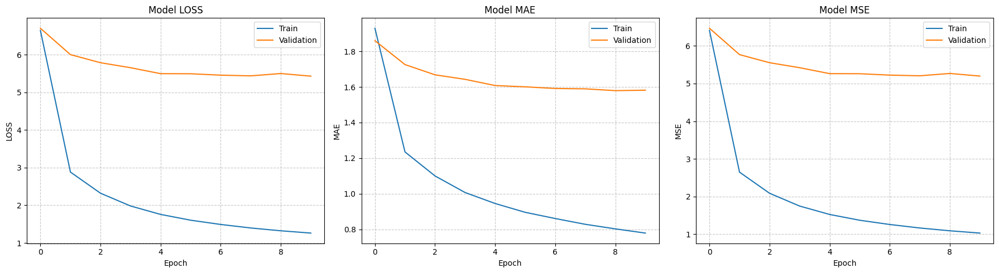


--- Final Test Set Evaluation (GW 31) ---

Evaluating test set performance...
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Evaluating test set performance...{'loss': 1.840430736541748, 'mae': 0.9728984832763672, 'mse': 1.6076351404190063}
R²: 0.6914011963663720
MAE: 0.9728984832763672
MSE: 1.6076351404190063
Loss: 1.8404307365417480

Generating Predictions...
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
mse:  1.6076351916066833 mae:  0.9728984726052131

--- Results for Gameweek 31 ---
 Gameweek              Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       31         Cole Palmer       16.0         12.92       0.18      0.88
       31      Alexander Isak        9.7          9.08       0.24     -0.12
       31          Phil Foden        8.8          8.78       1.11     -1.39
       31 Alexis Mac Allister        9.0          8.16       1.52     -2.16
       31  Morgan Gibbs-White        7.2          7.12      -0.28      0.51
       31   Rodrigo Hernandez        5.8          6.67       1.11  

In [ ]:
train_data, test_data , GW_full, X_cols = transform_data(final_df, cols, 31)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_31 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_31.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_31 = model_31.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_31)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 31) ---")
test_result_31 = model_31.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_31, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_31}")
print(f"R²: {evaluation_metrics['test_R2']:.16f}")
print(f"MAE: {evaluation_metrics['test_mae']:.16f}")
print(f"MSE: {evaluation_metrics['test_mse']:.16f}")
print(f"Loss: {evaluation_metrics['test_loss']:.16f}")


# Prediction
print("\nGenerating Predictions...")
Y_pred_31 = model_31.predict([X_test_scaled, M_test_scaled]).flatten()


position_31 = final_df['position'][test_mask]
teams_31 = final_df['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_31, 'team': teams_31, 'position': position_31}
preds_df_31 = pd.DataFrame(players_preds)

# Results
results_df_31 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_31,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 31 ---")
print(results_df_31.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



##### Plots


###### GK


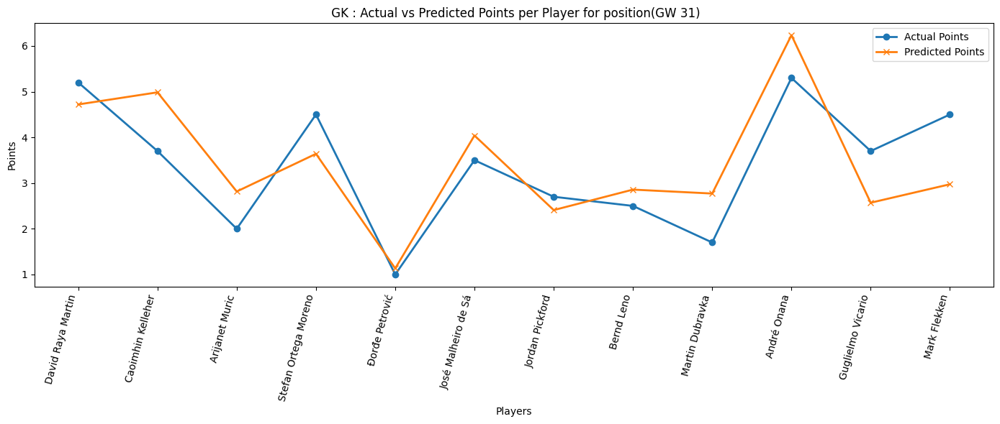

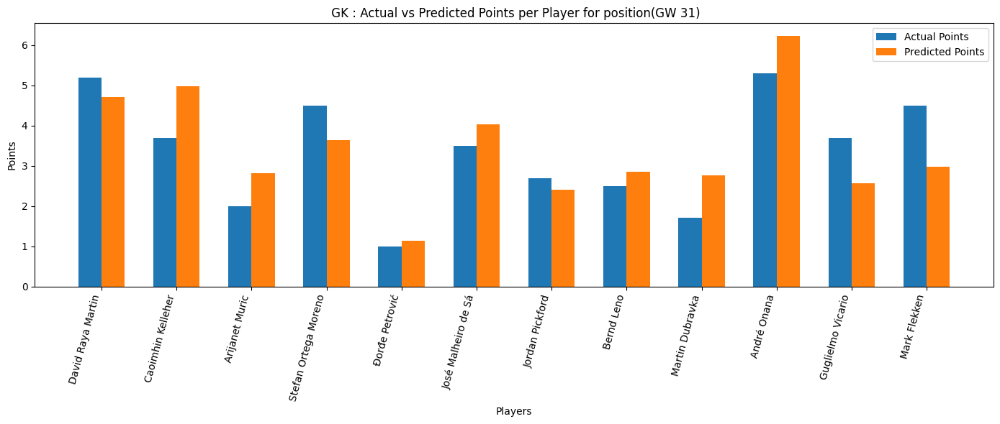

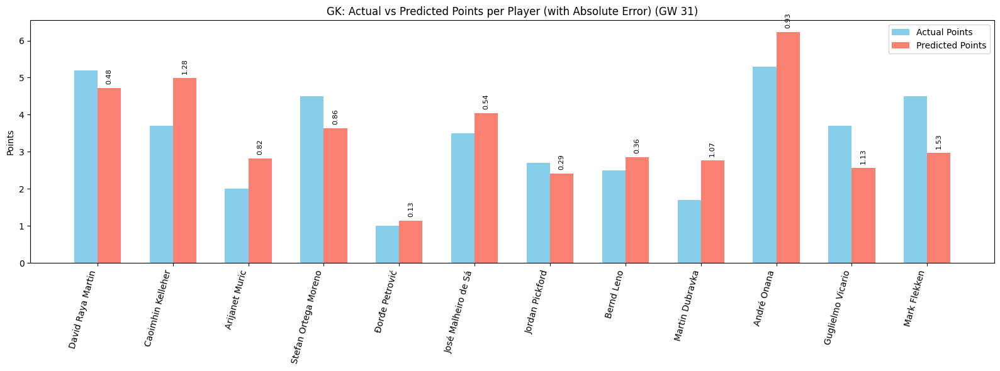

In [15]:
plot_preds(preds_df_31, 'GK', 31)


###### DEF


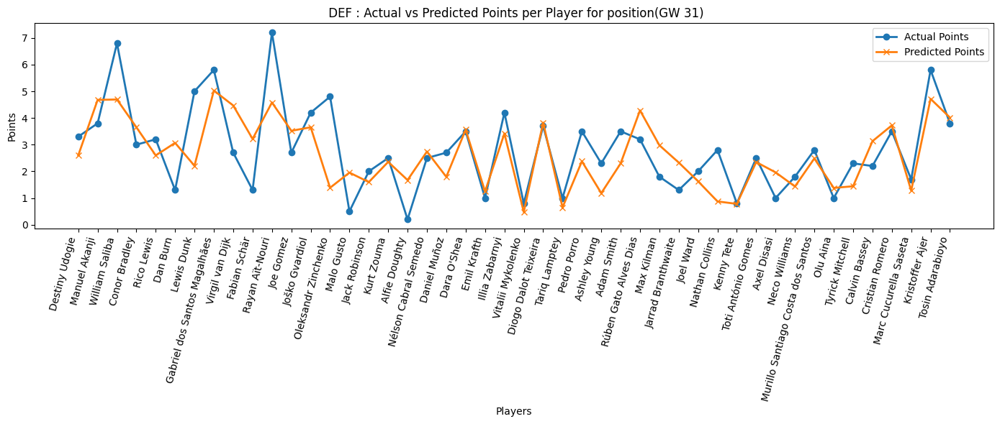

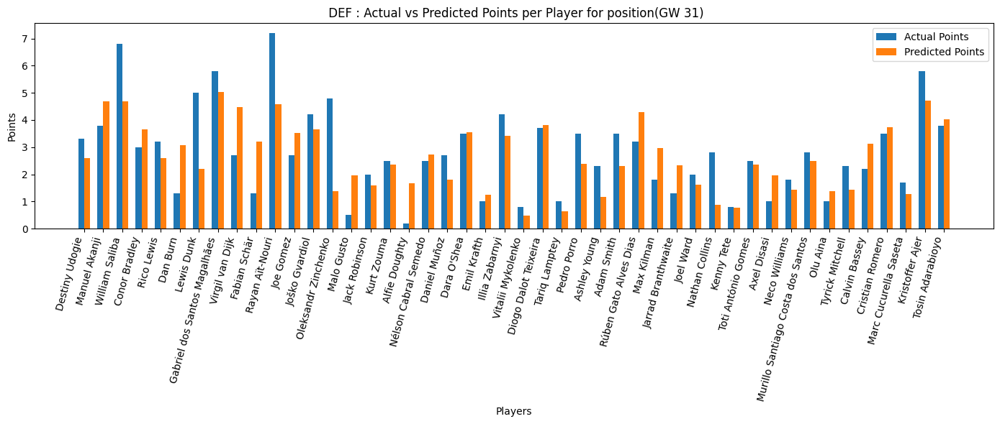

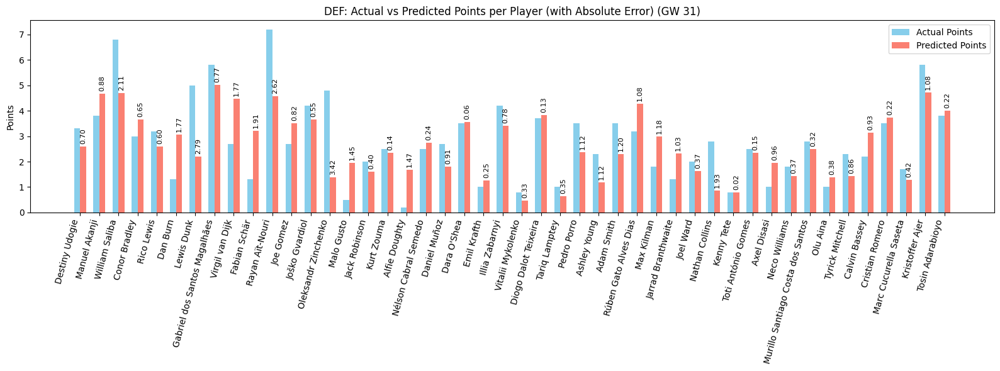

In [16]:
plot_preds(preds_df_31, 'DEF', 31)

###### MID


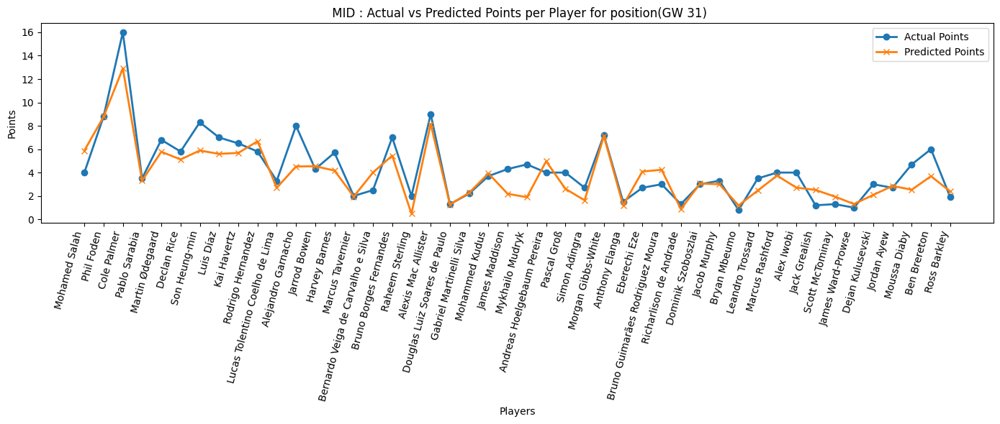

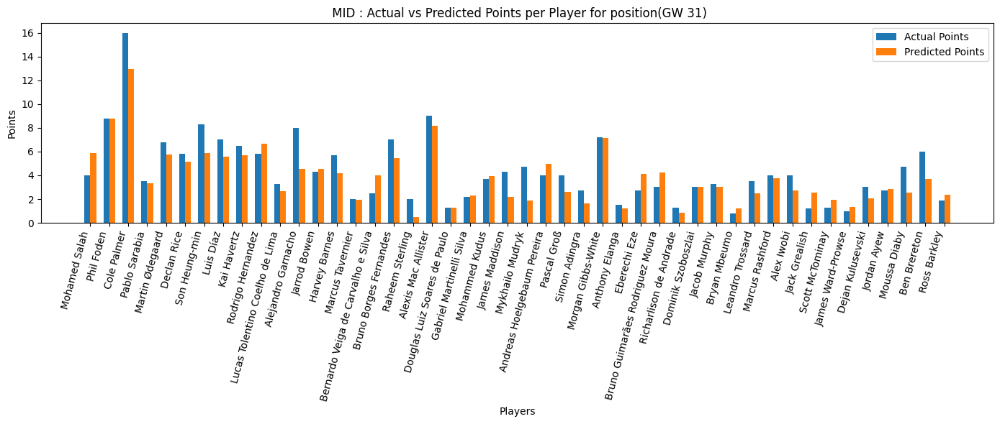

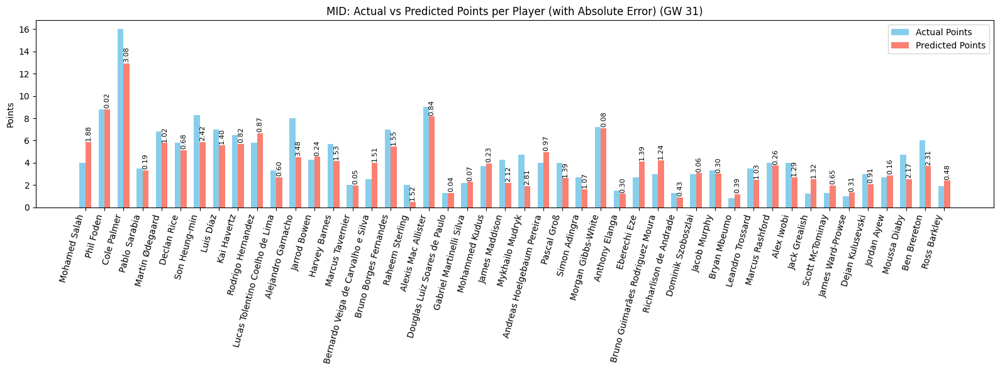

In [17]:
plot_preds(preds_df_31, 'MID', 31)

###### FWD


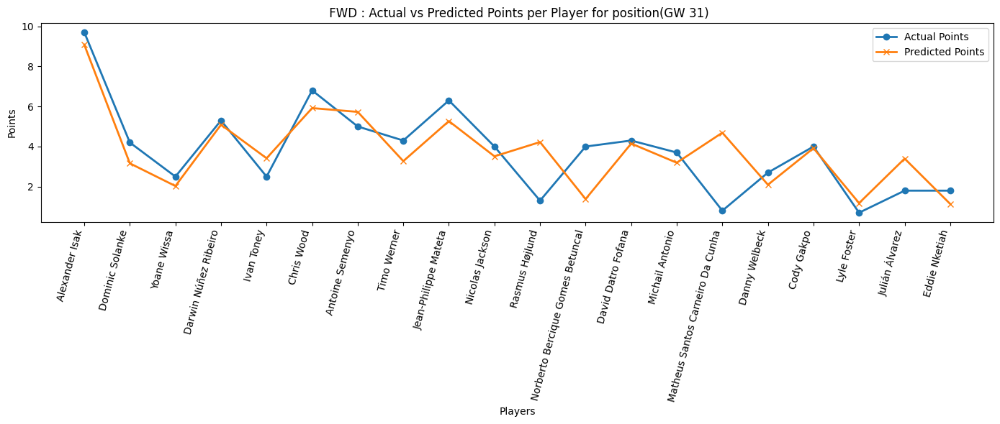

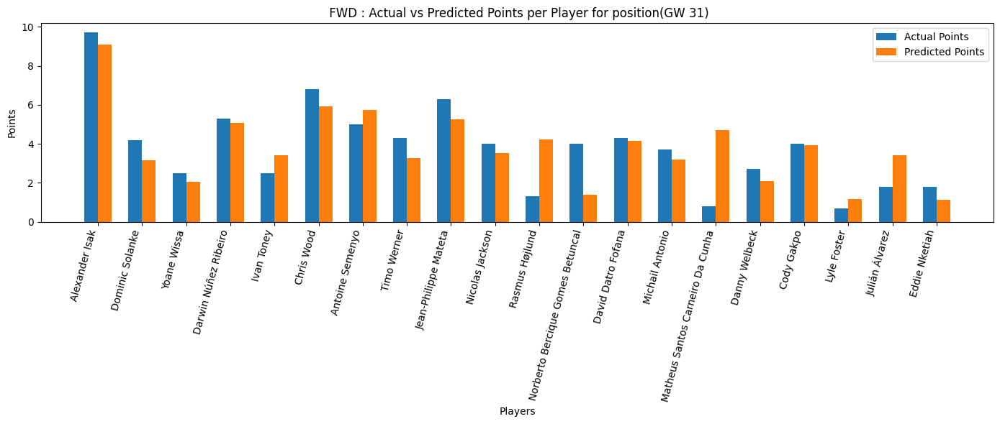

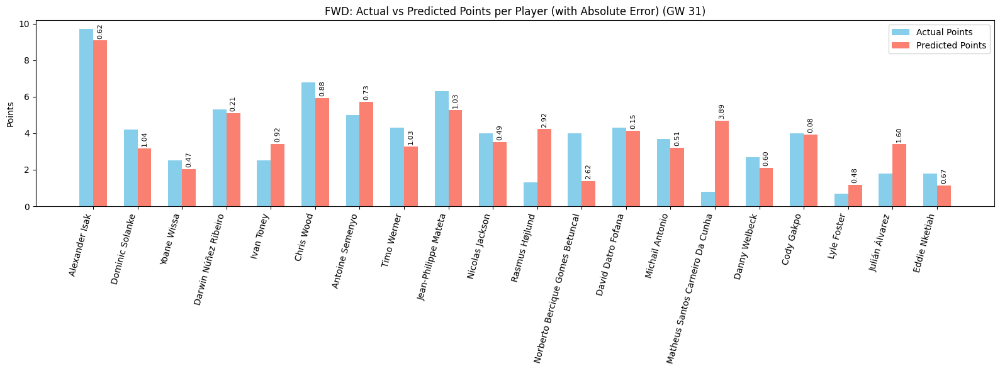

In [18]:
plot_preds(preds_df_31, 'FWD', 31)

#### Optimize


In [ ]:
curr_data = final_df[final_df['round'] == 31].copy()
curr_data['xP_pred'] = Y_pred_31

players = curr_data[['fpl_id', 'fpl_name', 'team', 'value', 'position', 'xP_pred']].copy()
players['player_id'] = list(range(len(players)))

players.rename(columns={'fpl_name': 'name', 'value': 'price'}, inplace=True)
players = players.reset_index(drop=True)

selected_31 = run_pipeline(players)

# Get total points
players_selected_31 = curr_data[curr_data['fpl_id'].isin(selected_31['fpl_id'])].copy()
# players_selected_31 = players_selected_31.copy()
# 1. Create the rank column based on 'xp_preds'
# method='dense' ensures ties get the same rank, and the next rank is sequential
players_selected_31['xp_rank'] = players_selected_31['xP_pred'].rank(method='dense', ascending=False).astype(int)

# 2. Define the conditions and their corresponding multipliers
conditions = [
    players_selected_31['xp_rank'] == 1,  # Highest xp_preds
    players_selected_31['xp_rank'] == 2   # Second highest xp_preds
]
multipliers = [2.0, 1.5] # [multiplier for rank 1, multiplier for rank 2]

# 3. Use np.select() to apply the multiplier
# The 'default=1.0' means any rank other than 1 or 2 gets a 1.0 multiplier
players_selected_31['score'] = players_selected_31['score'] * np.select(conditions, multipliers, default=1.0)
total_points_31 = sum(players_selected_31['score'].values)
print(total_points_31, players_selected_31['score'].values, '--------->', players_selected_31['xP_pred'].values)

players_selected_31[['fpl_name', 'team', 'position', 'xP_pred', 'score']]

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-259.4373
IRL epoch 100/200 loss=-2986.8406
IRL epoch 150/200 loss=-13189.4424
IRL epoch 200/200 loss=-36764.3477
HGAT Policy Embeddings Shape: torch.Size([124, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
                             name               team position  price  \
4                      Phil Foden    Manchester City      MID    8.1   
34                   Jarrod Bowen    West Ham United      MID    7.9   
24                    Kai Havertz            Arsenal      MID    7.2   
5                     Cole Palmer            Chelsea      MID    5.9   
64     Andreas Hoelgebaum Pereira             Fulham      MID    5.3   
68                    André Onana  Manchester United       GK    4.9   
7                  Alexander Isak   Newcastle United      FWD    7.7   
90             David Datro Fofana            Chelsea      FWD    5.0   
9                  William Saliba            Arsenal      DEF    5.8   

,fpl_name,team,position,xP_pred,score
3848,Phil Foden,Manchester City,MID,8.968609,30.0
3849,Cole Palmer,Chelsea,MID,12.796144,40.0
3851,Alexander Isak,Newcastle United,FWD,8.932149,8.0
3853,William Saliba,Arsenal,DEF,5.031188,7.0
3863,Gabriel dos Santos Magalhães,Arsenal,DEF,5.034636,6.0
3868,Kai Havertz,Arsenal,MID,8.001080,5.0
3878,Jarrod Bowen,West Ham United,MID,6.038358,5.0
3908,Andreas Hoelgebaum Pereira,Fulham,MID,6.971623,6.0
3912,André Onana,Manchester United,GK,5.066052,2.0
3934,David Datro Fofana,Chelsea,FWD,8.051590,2.0


##### Rank


In [ ]:
fg_managers_31 = fg_managers[fg_managers['gameweek'] == 31]
fg_managers_31[['points']]

position_31 = (fg_managers_31['points'] > total_points_31).sum() + 1
# 4. Display result
total_managers_31 = len(fg_managers_31)
percentile_31 = 100 * (1-(position_31 / total_managers_31))

print(total_points_31, total_managers_31)

print(f"Your predicted player’s total of {total_points_31} points would rank:")
print(f"→ Position: {position_31} out of {total_managers_31} managers")
print(f"→ Percentile: Top {percentile_31:.2f}%")


# Optional: show nearby ranks for context
nearby_31 = fg_managers_31.iloc[max(position_31-15,0):position_31+2][['points','prize']].reset_index(drop=True)
print("\nClosest scores around you:")
print(nearby_31)

118.0 217
Your predicted player’s total of 118.0 points would rank:
→ Position: 1 out of 217 managers
→ Percentile: Top 99.54%

Closest scores around you:
   points       prize
0    93.0  R 3,890.25
1    92.5  R 1,695.75
2    89.0  R 1,097.25


### GW 32


#### Predict


Data prepared. X shape: (4926, 177), M shape: (4926, 3), Y shape: (4926, 2)

Starting Training...
Epoch 1/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 9.5860 - mae: 2.4638 - mse: 9.3502 - val_loss: 5.7012 - val_mae: 1.6921 - val_mse: 5.4644
Epoch 2/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.1877 - mae: 1.3009 - mse: 2.9509 - val_loss: 5.3097 - val_mae: 1.5957 - val_mse: 5.0730
Epoch 3/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.4488 - mae: 1.1368 - mse: 2.2122 - val_loss: 5.0296 - val_mae: 1.5173 - val_mse: 4.7931
Epoch 4/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.9707 - mae: 1.0009 - mse: 1.7343 - val_loss: 4.8683 - val_mae: 1.4781 - val_mse: 4.6320
Epoch 5/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.7444 - mae: 0.9293 - mse: 1.5081 - val_loss: 4.8272 - val_mae: 1.4647 - val_mse: 4.5910
Epoch 6/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.7122 - mae: 0.9356 - mse: 1.4761 - val_loss: 4.8168 - val_mae: 1.4526 - val_mse: 4.5809
Ep

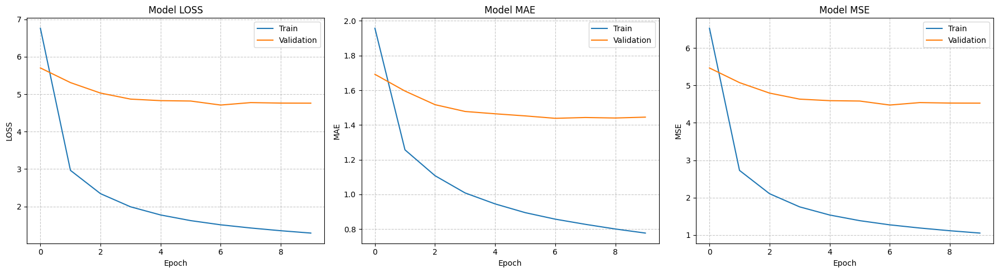


--- Final Test Set Evaluation (GW 32) ---

Evaluating test set performance...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Evaluating test set performance...{'loss': 1.1746430397033691, 'mae': 0.7833518981933594, 'mse': 0.9390706419944763}
R²: 0.7455165483826989
MAE: 0.7833518981933594
MSE: 0.9390706419944763
Loss: 1.1746430397033691

Generating Predictions...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

--- Results for Gameweek 32 ---
 Gameweek              Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       32         Cole Palmer       13.7         10.74      -2.09     -1.16
       32         Kai Havertz        8.2          8.97       0.70     -0.69
       32     Kevin De Bruyne        7.8          8.59       1.22     -1.35
       32   Rodrigo Hernandez        6.2          6.93       1.22     -1.35
       32           Luis Díaz        6.7          6.80       0.65     -0.70
       32  Morgan Gibbs-White        5.5          6.69      -2.08      1.56
       32         Bukayo Saka        3.6

In [264]:
train_data, test_data , GW_full, X_cols = transform_data(final_df, cols, 32)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_32 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_32.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_32 = model_32.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_32)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 32) ---")
test_result_32 = model_32.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_32, X_test_scaled, M_test_scaled, Y_test)
print(f"Evaluating test set performance...{test_result_32}")
print(f"R²: {evaluation_metrics['test_R2']:.16f}")
print(f"MAE: {evaluation_metrics['test_mae']:.16f}")
print(f"MSE: {evaluation_metrics['test_mse']:.16f}")
print(f"Loss: {evaluation_metrics['test_loss']:.16f}")


# Prediction
print("\nGenerating Predictions...")
Y_pred_32 = model_32.predict([X_test_scaled, M_test_scaled]).flatten()
position_32 = final_df['position'][test_mask]
teams_32 = final_df['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_32, 'team': teams_32, 'position': position_32}
preds_df_32 = pd.DataFrame(players_preds)


# Results
results_df_32 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_32,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 32 ---")
print(results_df_32.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))


##### Plots


###### GK


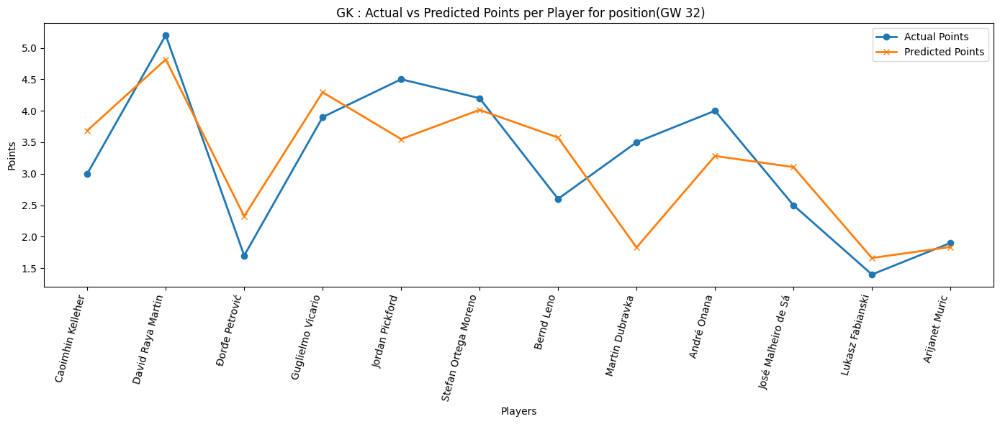

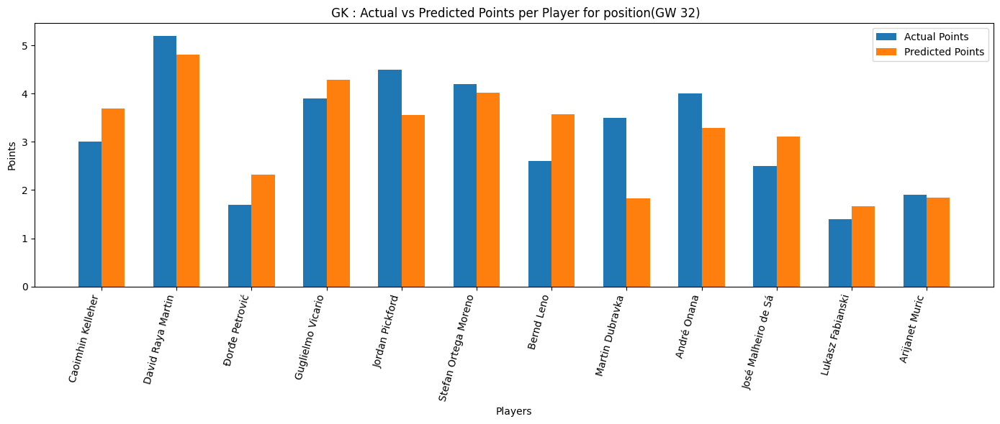

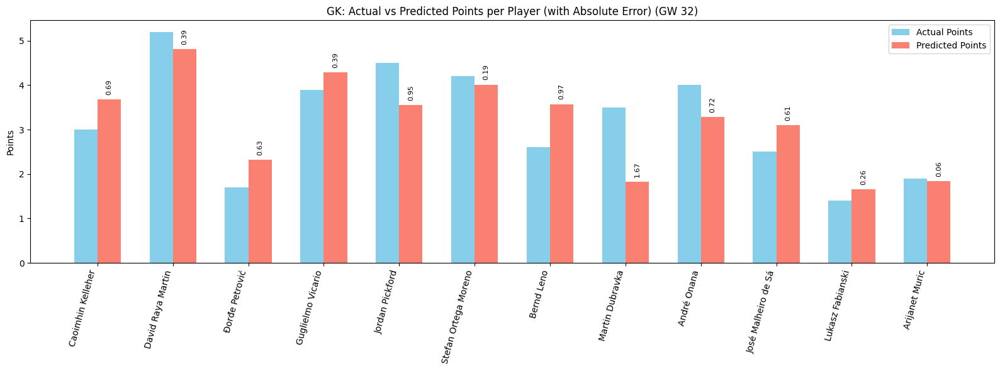

In [265]:
plot_preds(preds_df_32, 'GK', 32)


###### DEF


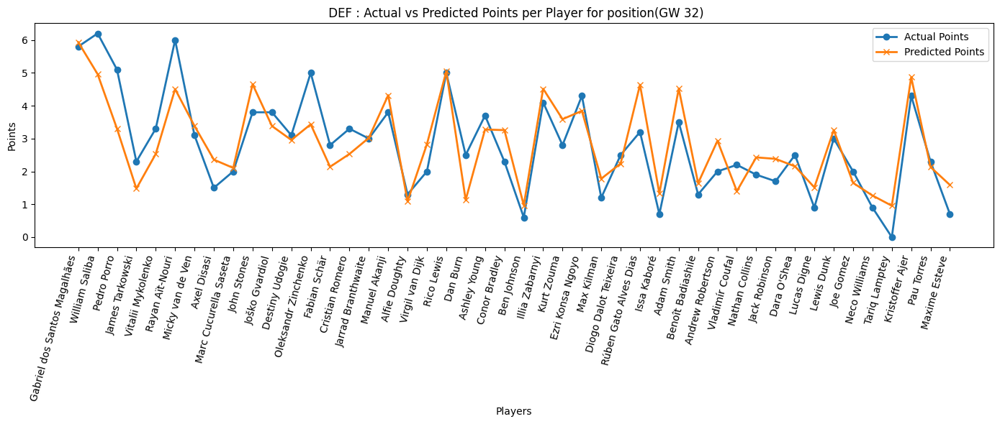

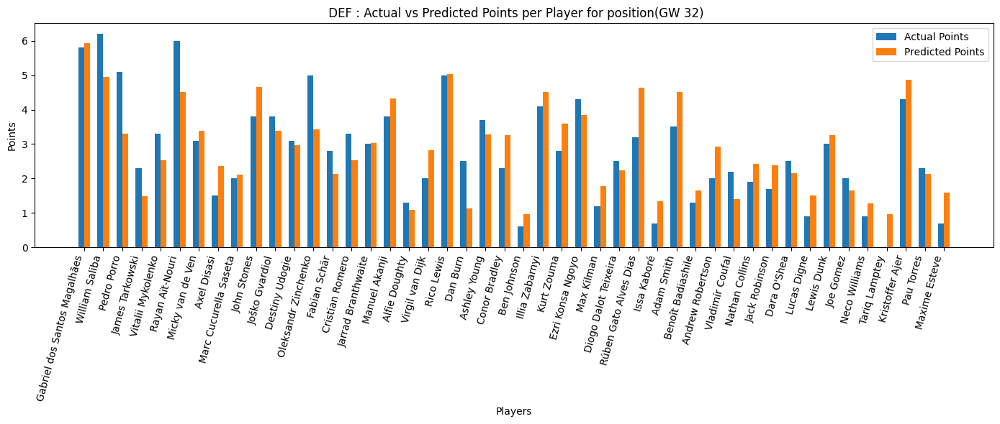

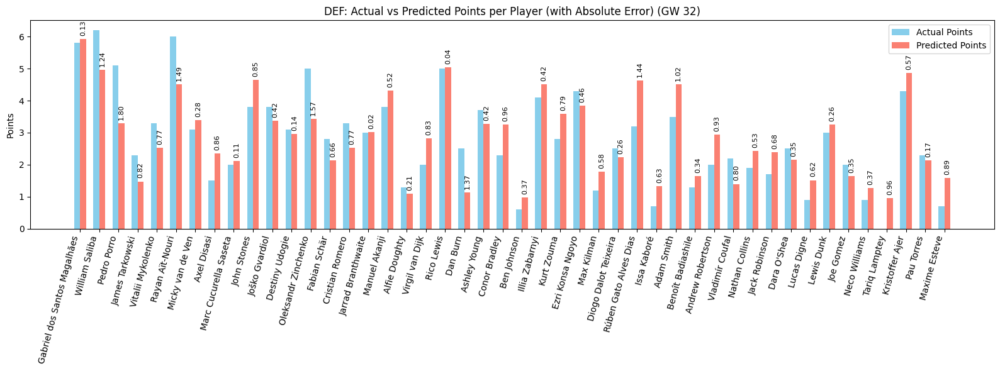

In [266]:
plot_preds(preds_df_32, 'DEF', 32)

###### MID


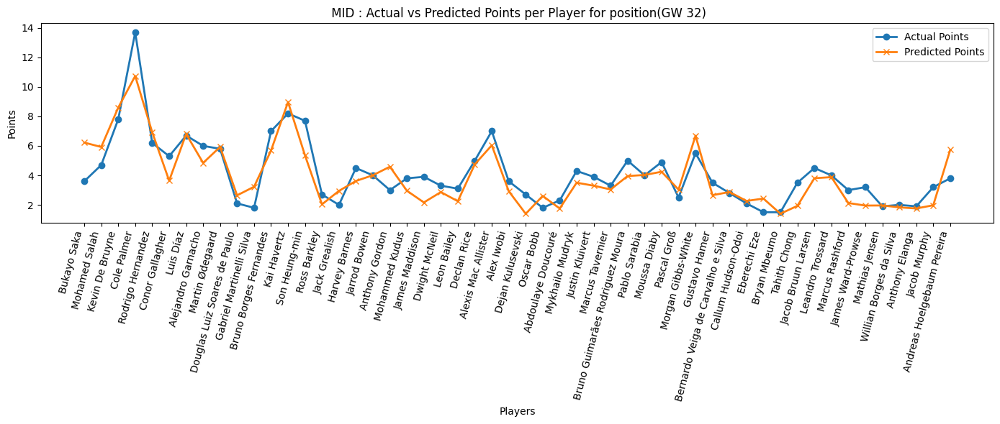

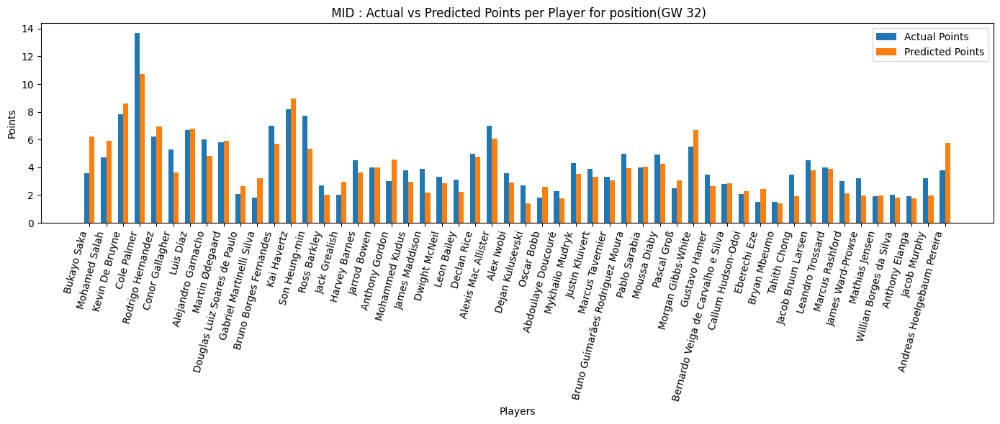

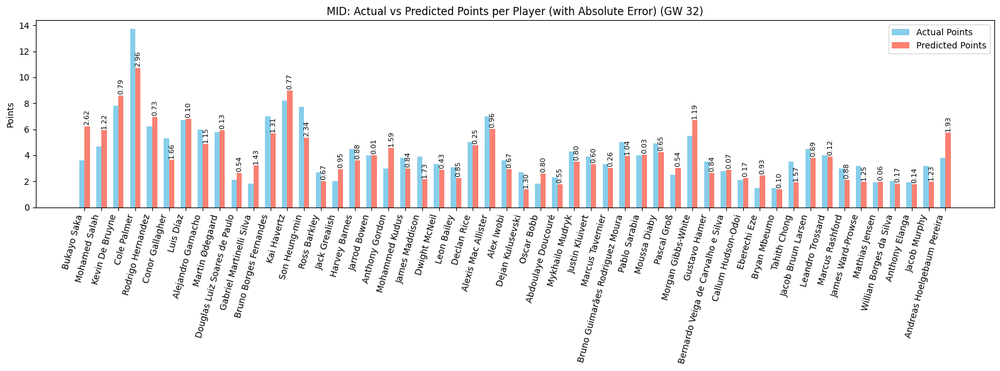

In [267]:
plot_preds(preds_df_32, 'MID', 32)

###### FWD


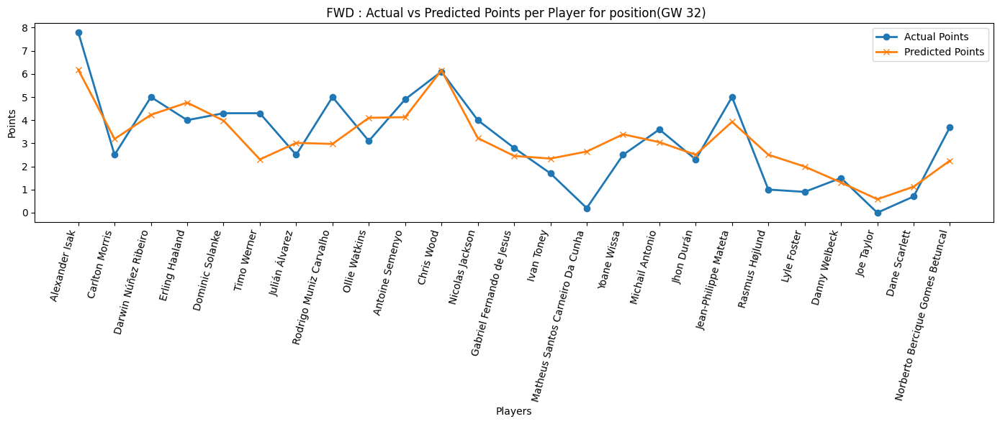

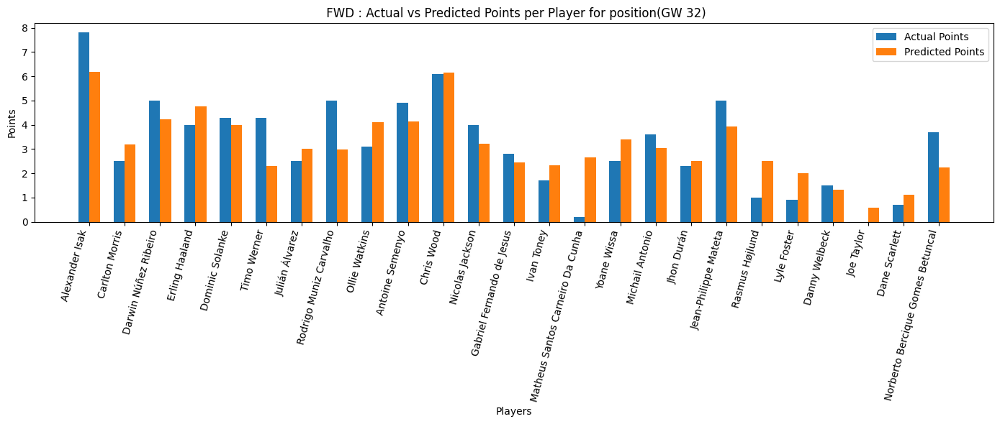

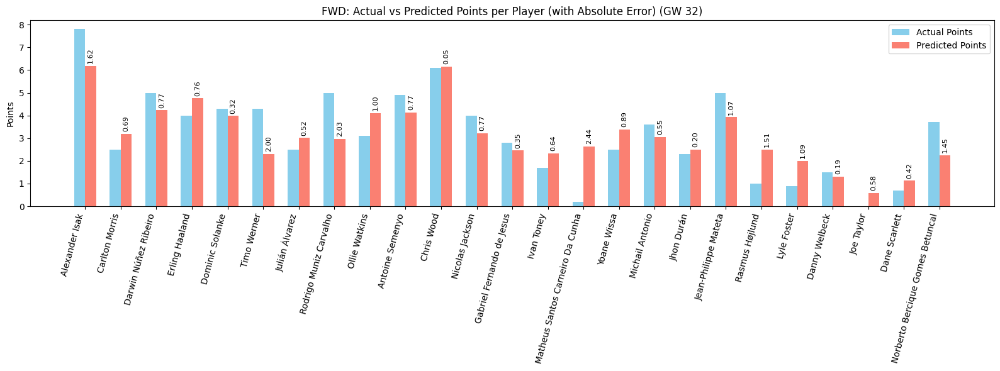

In [268]:
plot_preds(preds_df_32, 'FWD', 32)

#### Optimize


In [269]:
curr_data = final_df[final_df['round'] == 32].copy()
curr_data['xP_pred'] = Y_pred_32

players = curr_data[['fpl_id', 'fpl_name', 'team', 'value', 'position', 'xP_pred']].copy()
players['player_id'] = list(range(len(players)))

players.rename(columns={'fpl_name': 'name', 'value': 'price'}, inplace=True)
players = players.reset_index(drop=True)

selected_32 = run_pipeline(players)

# Get total points
players_selected_32 = curr_data[curr_data['fpl_id'].isin(selected_32['fpl_id'])].copy()
# players_selected_32 = players_selected_32.copy()
# 1. Create the rank column based on 'xp_preds'
# method='dense' ensures ties get the same rank, and the next rank is sequential
players_selected_32['xp_rank'] = players_selected_32['xP_pred'].rank(method='dense', ascending=False).astype(int)

# 2. Define the conditions and their corresponding multipliers
conditions = [
    players_selected_32['xp_rank'] == 1,  # Highest xp_preds
    players_selected_32['xp_rank'] == 2   # Second highest xp_preds
]
multipliers = [2.0, 1.5] # [multiplier for rank 1, multiplier for rank 2]

# 3. Use np.select() to apply the multiplier
# The 'default=1.0' means any rank other than 1 or 2 gets a 1.0 multiplier
players_selected_32['score'] = players_selected_32['score'] * np.select(conditions, multipliers, default=1.0)
total_points_32 = sum(players_selected_32['score'].values)
print(total_points_32, players_selected_32['score'].values, '--------->', players_selected_32['xP_pred'].values)

players_selected_32[['fpl_name', 'team', 'position', 'xP_pred', 'score']]

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-168.0680
IRL epoch 100/200 loss=-1858.1523
IRL epoch 150/200 loss=-7951.8130
IRL epoch 200/200 loss=-21815.1543
HGAT Policy Embeddings Shape: torch.Size([135, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
                             name               team position  price  \
6                 Kevin De Bruyne    Manchester City      MID   10.3   
21                      Luis Díaz          Liverpool      MID    7.6   
40                    Kai Havertz            Arsenal      MID    7.3   
7                     Cole Palmer            Chelsea      MID    6.0   
14              Rodrigo Hernandez    Manchester City      MID    5.6   
11              David Raya Martin            Arsenal       GK    5.1   
8                  Alexander Isak   Newcastle United      FWD    7.9   
62                     Chris Wood  Nottingham Forest      FWD    4.8   
1    Gabriel dos Santos Magalhães            Arsenal      DEF    5.3   


,fpl_name,team,position,xP_pred,score
3969,Gabriel dos Santos Magalhães,Arsenal,DEF,5.933486,6.0
3974,Kevin De Bruyne,Manchester City,MID,8.592094,18.0
3975,Cole Palmer,Chelsea,MID,10.737122,10.0
3976,Alexander Isak,Newcastle United,FWD,6.183623,2.0
3979,David Raya Martin,Arsenal,GK,4.814893,6.0
3982,Rodrigo Hernandez,Manchester City,MID,6.931348,5.0
3989,Luis Díaz,Liverpool,MID,6.804712,7.0
4008,Kai Havertz,Arsenal,MID,8.968688,21.0
4016,Rico Lewis,Manchester City,DEF,5.042505,8.0
4030,Chris Wood,Nottingham Forest,FWD,6.154172,6.0


##### Rank


In [270]:
fg_managers_32 = fg_managers[fg_managers['gameweek'] == 32]
fg_managers_32[['points']]

position_32 = (fg_managers_32['points'] > total_points_32).sum() + 1
# 4. Display result
total_managers_32 = len(fg_managers_32)
percentile_32 = 100 * (1-(position_32 / total_managers_32))

print(total_points_32, total_managers_32)

print(f"Your predicted player’s total of {total_points_32} points would rank:")
print(f"→ Position: {position_32} out of {total_managers_32} managers")
print(f"→ Percentile: Top {percentile_32:.2f}%")


# Optional: show nearby ranks for context
nearby_32 = fg_managers_32.iloc[max(position_32-15,0):position_32+2][['points','prize']].reset_index(drop=True)
print("\nClosest scores around you:")
print(nearby_32)

90.0 234
Your predicted player’s total of 90.0 points would rank:
→ Position: 3 out of 234 managers
→ Percentile: Top 98.72%

Closest scores around you:
   points       prize
0   100.5  R 3,890.25
1    93.5  R 1,695.75
2    90.0  R 1,097.25
3    88.0    R 522.50
4    87.5    R 299.25


### GW 33


#### Predict


Data prepared. X shape: (4926, 177), M shape: (4926, 3), Y shape: (4926, 2)

Starting Training...
Epoch 1/10
103/103 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 13.3614 - mae: 2.9225 - mse: 13.1269 - val_loss: 5.1036 - val_mae: 1.7016 - val_mse: 4.8682
Epoch 2/10
103/103 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 3.6123 - mae: 1.3846 - mse: 3.3768 - val_loss: 4.4156 - val_mae: 1.4991 - val_mse: 4.1803
Epoch 3/10
103/103 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 2.7105 - mae: 1.1747 - mse: 2.4752 - val_loss: 4.1431 - val_mae: 1.4259 - val_mse: 3.9079
Epoch 4/10
103/103 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 2.4208 - mae: 1.0908 - mse: 2.1856 - val_loss: 4.0713 - val_mae: 1.3914 - val_mse: 3.8362
Epoch 5/10
103/103 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.9810 - mae: 0.9857 - mse: 1.7459 - val_loss: 3.9744 - val_mae: 1.3660 - val_mse: 3.7395
Epoch 6/10
103/103 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.7402 - mae: 0.9224 - mse: 1.5054 - val_loss: 3.9393 - val_mae: 1.3495 - val_mse: 3.7046


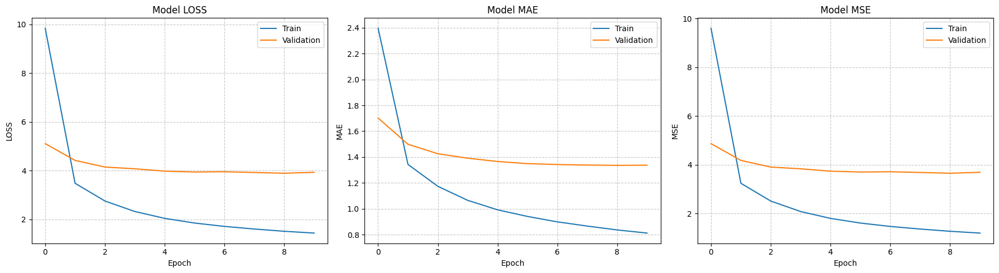


--- Final Test Set Evaluation (GW 33) ---

Evaluating test set performance...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Evaluating test set performance...{'loss': 1.635951042175293, 'mae': 0.9316688179969788, 'mse': 1.4021341800689697}
R²: 0.6665845653025324
MAE: 0.9316688179969788
MSE: 1.4021341800689697
Loss: 1.6359510421752930

Generating Predictions...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

--- Results for Gameweek 33 ---
 Gameweek                     Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       33                Cole Palmer       16.5         15.25       0.58      1.23
       33            Kevin De Bruyne        7.3         10.10       1.50     -2.09
       33     Bruno Borges Fernandes        8.5          8.78      -0.45      0.46
       33             Alexander Isak        8.7          7.66      -0.55      0.53
       33              Mohamed Salah        5.0          6.93       1.33     -1.68
       33 Andreas Hoelgebaum Pereira        7.2          6.72      -0.48   

In [271]:
train_data, test_data , GW_full, X_cols = transform_data(final_df, cols, 33)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_33 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_33.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_33 = model_33.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_33)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 33) ---")
test_result_33 = model_33.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_33, X_test_scaled, M_test_scaled, Y_test)
print(f"Evaluating test set performance...{test_result_33}")
print(f"R²: {evaluation_metrics['test_R2']:.16f}")
print(f"MAE: {evaluation_metrics['test_mae']:.16f}")
print(f"MSE: {evaluation_metrics['test_mse']:.16f}")
print(f"Loss: {evaluation_metrics['test_loss']:.16f}")


# Prediction
print("\nGenerating Predictions...")
Y_pred_33 = model_33.predict([X_test_scaled, M_test_scaled]).flatten()
position_33 = final_df['position'][test_mask]
teams_33 = final_df['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_33, 'team': teams_33, 'position': position_33}
preds_df_33 = pd.DataFrame(players_preds)



# Results
results_df_33 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_33,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 33 ---")
print(results_df_33.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))

##### Plots


###### GK


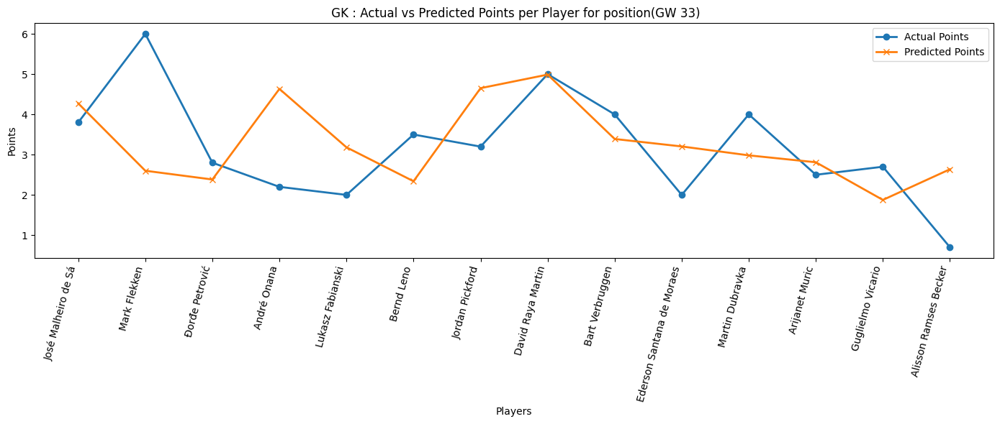

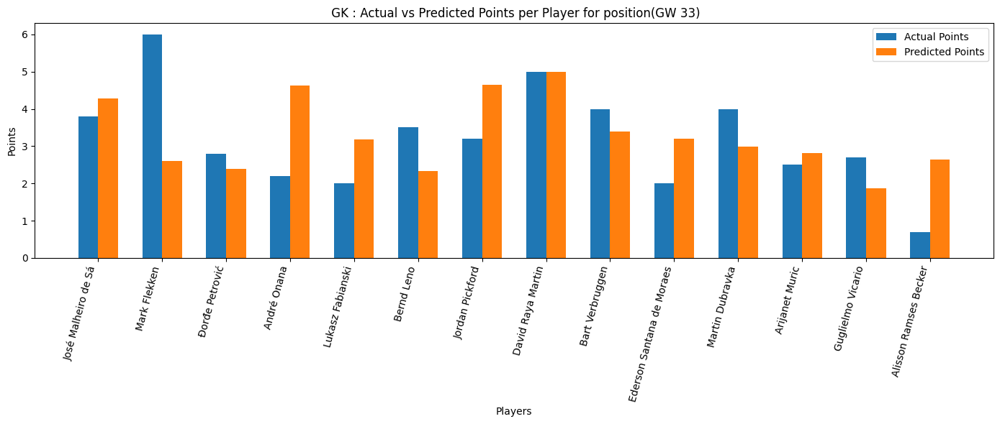

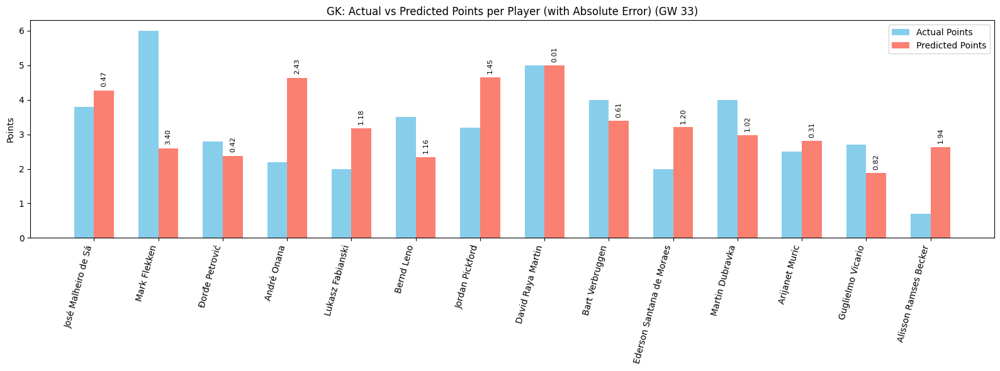

In [272]:
plot_preds(preds_df_33, 'GK', 33)

<!-- ###### DEF -->


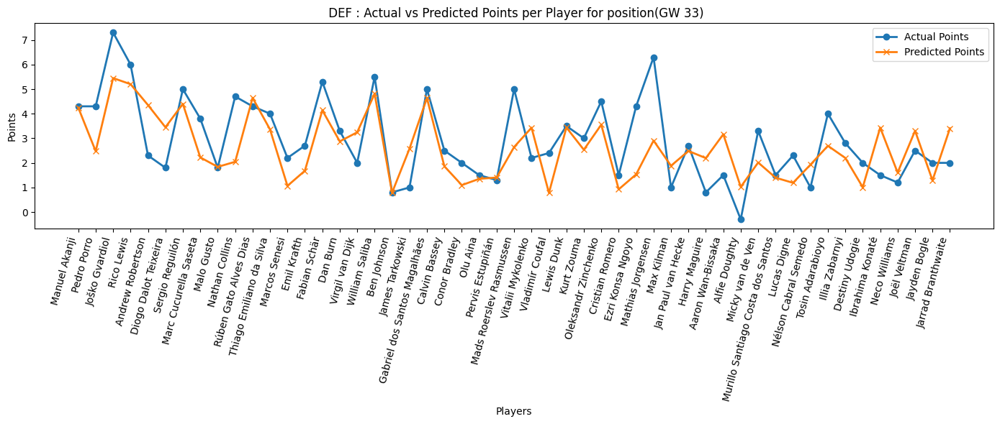

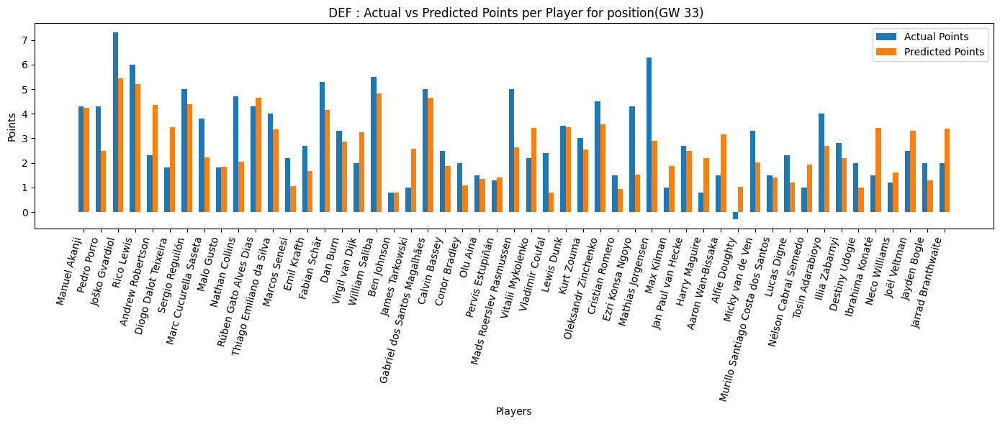

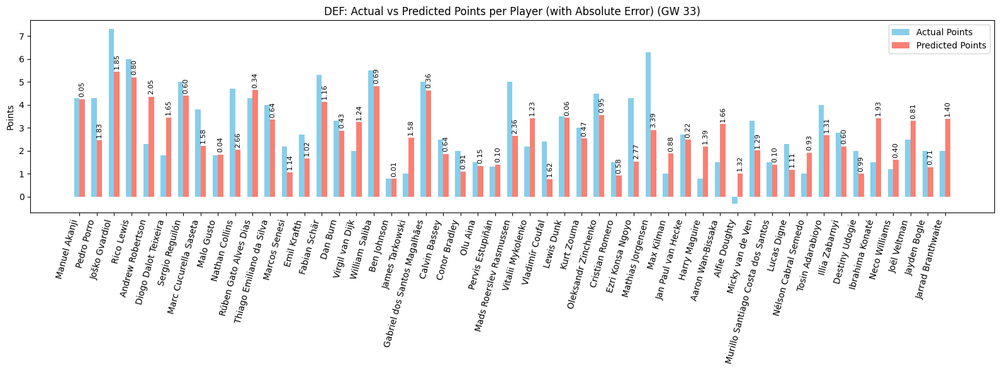

In [273]:
plot_preds(preds_df_33, 'DEF', 33)

###### MID


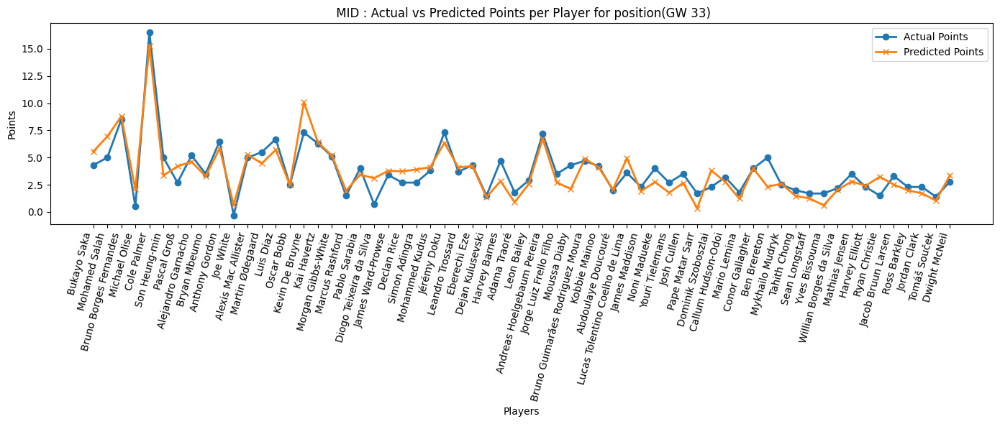

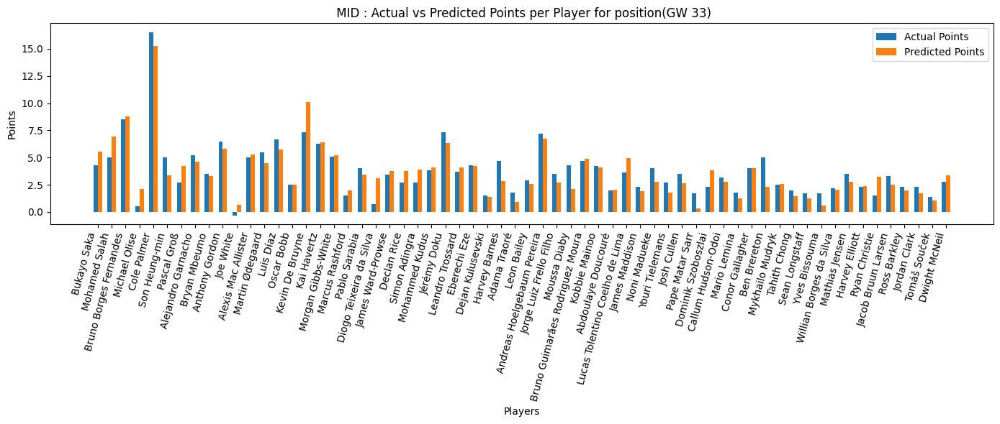

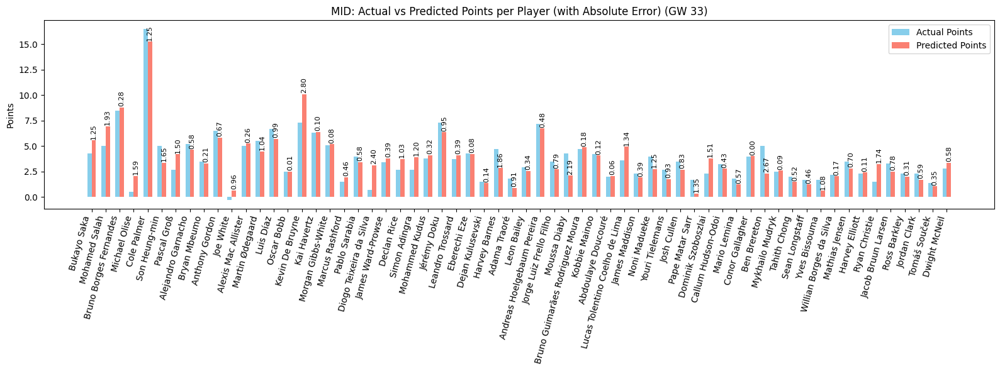

In [274]:
plot_preds(preds_df_33, 'MID', 33)

###### FWD


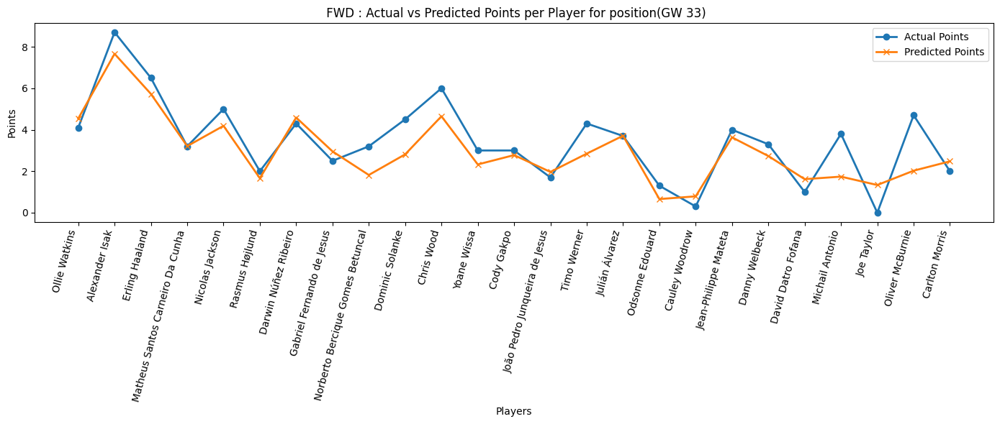

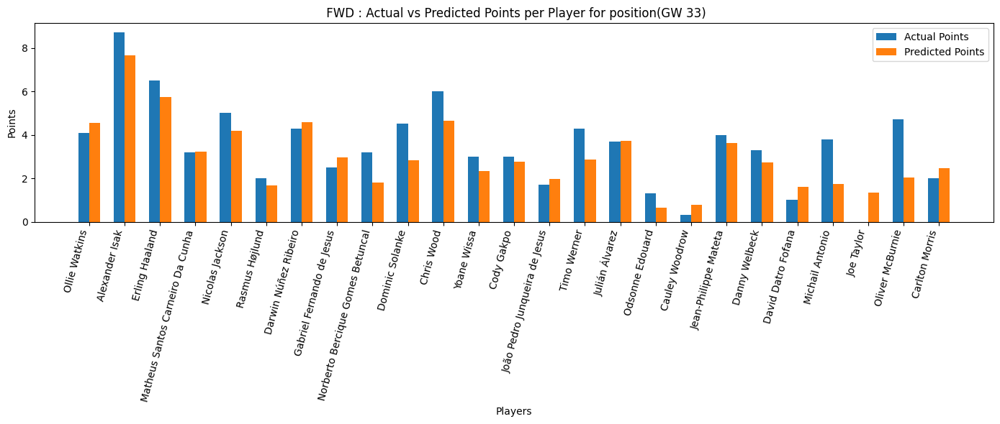

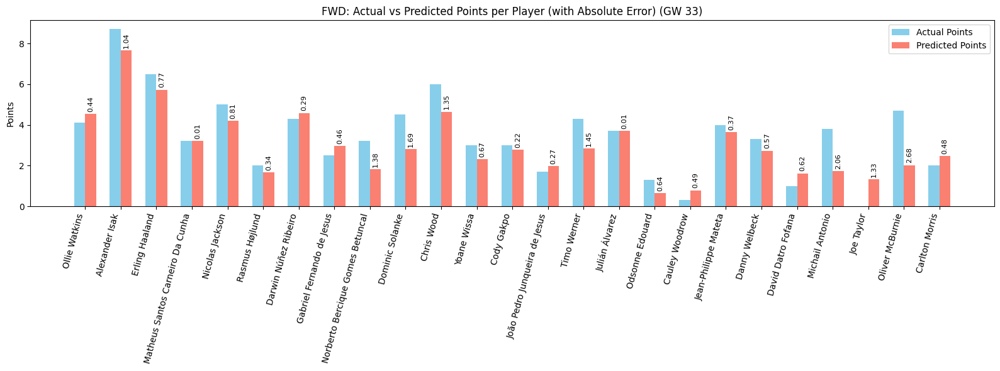

In [275]:
plot_preds(preds_df_33, 'FWD', 33)

#### Optimize


In [276]:
curr_data = final_df[final_df['round'] == 33].copy()
curr_data['xP_pred'] = Y_pred_33

players = curr_data[['fpl_id', 'fpl_name', 'team', 'value', 'position', 'xP_pred']].copy()
players['player_id'] = list(range(len(players)))

players.rename(columns={'fpl_name': 'name', 'value': 'price'}, inplace=True)
players = players.reset_index(drop=True)

selected_33 = run_pipeline(players)

# Get total points
players_selected_33 = curr_data[curr_data['fpl_id'].isin(selected_33['fpl_id'])].copy()
# players_selected_33 = players_selected_33.copy()
# 1. Create the rank column based on 'xp_preds'
# method='dense' ensures ties get the same rank, and the next rank is sequential
players_selected_33['xp_rank'] = players_selected_33['xP_pred'].rank(method='dense', ascending=False).astype(int)

# 2. Define the conditions and their corresponding multipliers
conditions = [
    players_selected_33['xp_rank'] == 1,  # Highest xp_preds
    players_selected_33['xp_rank'] == 2   # Second highest xp_preds
]
multipliers = [2.0, 1.5] # [multiplier for rank 1, multiplier for rank 2]

# 3. Use np.select() to apply the multiplier
# The 'default=1.0' means any rank other than 1 or 2 gets a 1.0 multiplier
players_selected_33['score'] = players_selected_33['score'] * np.select(conditions, multipliers, default=1.0)
total_points_33 = sum(players_selected_33['score'].values)
print(total_points_33, players_selected_33['score'].values, '--------->', players_selected_33['xP_pred'].values)

players_selected_33[['fpl_name', 'team', 'position', 'xP_pred', 'score']]

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-306.6152
IRL epoch 100/200 loss=-3741.3625
IRL epoch 150/200 loss=-16656.9922
IRL epoch 200/200 loss=-47367.8008
HGAT Policy Embeddings Shape: torch.Size([152, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
                            name               team position  price  \
4                  Mohamed Salah          Liverpool      MID   13.5   
43               Kevin De Bruyne    Manchester City      MID   10.4   
5         Bruno Borges Fernandes  Manchester United      MID    8.2   
7                    Cole Palmer            Chelsea      MID    6.1   
90    Andreas Hoelgebaum Pereira             Fulham      MID    5.3   
63             David Raya Martin            Arsenal       GK    5.1   
14                Erling Haaland    Manchester City      FWD   14.3   
9                 Alexander Isak   Newcastle United      FWD    7.9   
53                William Saliba            Arsenal      DEF    5.9   
57  Gabri

,fpl_name,team,position,xP_pred,score
4105,Joško Gvardiol,Manchester City,DEF,5.448572,12.0
4107,Mohamed Salah,Liverpool,MID,6.932226,2.0
4108,Bruno Borges Fernandes,Manchester United,MID,8.781974,15.0
4110,Cole Palmer,Chelsea,MID,15.246056,52.0
4112,Alexander Isak,Newcastle United,FWD,7.660685,12.0
4117,Erling Haaland,Manchester City,FWD,5.727650,10.0
4146,Kevin De Bruyne,Manchester City,MID,10.099459,3.0
4156,William Saliba,Arsenal,DEF,4.811996,1.0
4160,Gabriel dos Santos Magalhães,Arsenal,DEF,4.636069,0.0
4166,David Raya Martin,Arsenal,GK,4.988814,1.0


##### Rank


In [277]:
fg_managers_33 = fg_managers[fg_managers['gameweek'] == 33]
fg_managers_33[['points']]

position_33 = (fg_managers_33['points'] > total_points_33).sum() + 1
# 4. Display result
total_managers_33 = len(fg_managers_33)
percentile_33 = 100 * (1-(position_33 / total_managers_33))

print(total_points_33, total_managers_33)

print(f"Your predicted player’s total of {total_points_33} points would rank:")
print(f"→ Position: {position_33} out of {total_managers_33} managers")
print(f"→ Percentile: Top {percentile_33:.2f}%")


# Optional: show nearby ranks for context
nearby_33 = fg_managers_33.iloc[max(position_33-15,0):position_33+2][['points','prize']].reset_index(drop=True)
print("\nClosest scores around you:")
print(nearby_33)

123.0 246
Your predicted player’s total of 123.0 points would rank:
→ Position: 1 out of 246 managers
→ Percentile: Top 99.59%

Closest scores around you:
   points       prize
0   114.5  R 3,890.25
1   109.5  R 1,695.75
2   107.0  R 1,097.25


### GW 34


#### Predict


Data prepared. X shape: (4926, 177), M shape: (4926, 3), Y shape: (4926, 2)

Starting Training...
Epoch 1/10
107/107 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 13.3134 - mae: 2.8853 - mse: 13.0801 - val_loss: 3.4555 - val_mae: 1.3580 - val_mse: 3.2215
Epoch 2/10
107/107 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9869 - mae: 1.4568 - mse: 3.7530 - val_loss: 2.7401 - val_mae: 1.1902 - val_mse: 2.5066
Epoch 3/10
107/107 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.0865 - mae: 1.2685 - mse: 2.8531 - val_loss: 2.3490 - val_mae: 1.0908 - val_mse: 2.1157
Epoch 4/10
107/107 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.7198 - mae: 1.1567 - mse: 2.4867 - val_loss: 2.1536 - val_mae: 1.0382 - val_mse: 1.9208
Epoch 5/10
107/107 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.1948 - mae: 1.0229 - mse: 1.9620 - val_loss: 2.0681 - val_mae: 1.0182 - val_mse: 1.8356
Epoch 6/10
107/107 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.1837 - mae: 1.0152 - mse: 1.9513 - val_loss: 1.9975 - val_mae: 0.9988 - val_mse: 1.7653


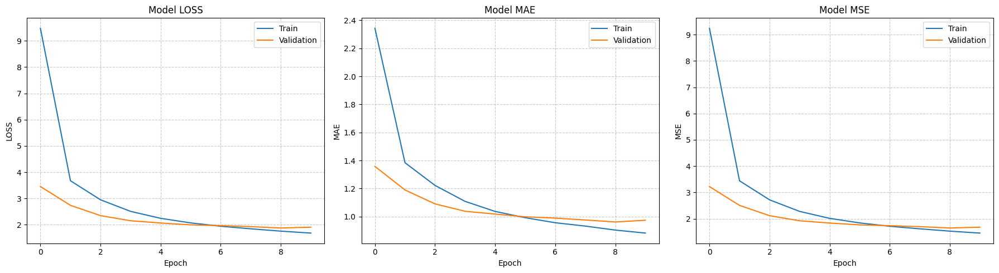


--- Final Test Set Evaluation (GW 34) ---

Evaluating test set performance...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Evaluating test set performance...{'loss': 7.748186111450195, 'mae': 1.8442384004592896, 'mse': 7.516907215118408}
R²: 0.2957515347331693
MAE: 1.8442384004592896
MSE: 7.5169072151184082
Loss: 7.7481861114501953

Generating Predictions...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 

--- Results for Gameweek 34 ---
 Gameweek                 Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       34 Bruno Borges Fernandes       10.9         13.31       1.06     -1.39
       34             Phil Foden        8.8         10.69       0.96     -1.09
       34        Kevin De Bruyne        7.4          9.58       0.96     -1.09
       34            Kai Havertz       15.4          8.56       0.88     -1.02
       34        Martin Ødegaard       15.4          8.31       0.88     -1.02
       34           Eberechi Eze       11.0          7.13       0.19     -0.00
       34   Jean-Phil

In [278]:
train_data, test_data , GW_full, X_cols = transform_data(final_df, cols, 34)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_34 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_34.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_34 = model_34.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_34)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 34) ---")
test_result_34 = model_34.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_34, X_test_scaled, M_test_scaled, Y_test)
print(f"Evaluating test set performance...{test_result_34}")
print(f"R²: {evaluation_metrics['test_R2']:.16f}")
print(f"MAE: {evaluation_metrics['test_mae']:.16f}")
print(f"MSE: {evaluation_metrics['test_mse']:.16f}")
print(f"Loss: {evaluation_metrics['test_loss']:.16f}")


# Prediction
print("\nGenerating Predictions...")
Y_pred_34 = model_34.predict([X_test_scaled, M_test_scaled]).flatten()

position_34 = final_df['position'][test_mask]
teams_34 = final_df['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_34, 'team': teams_34, 'position': position_34}
preds_df_34 = pd.DataFrame(players_preds)



# Results
results_df_34 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_34,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 34 ---")
print(results_df_34.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))

##### Plots


###### GK


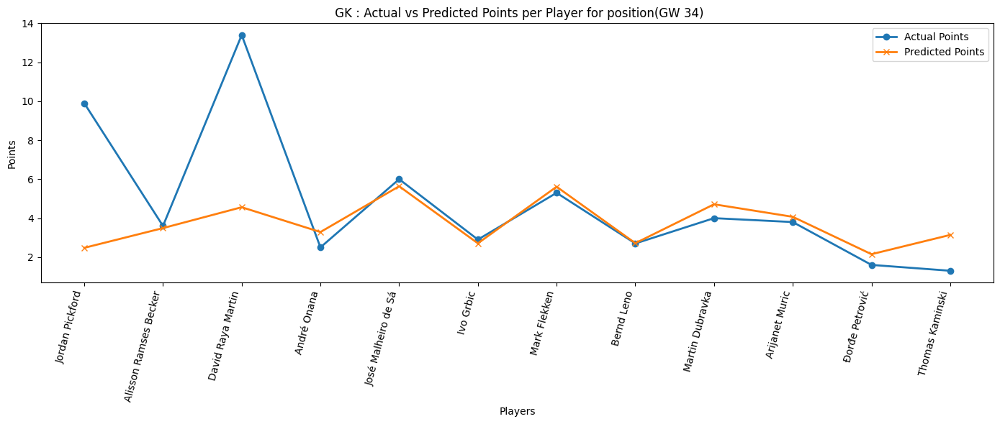

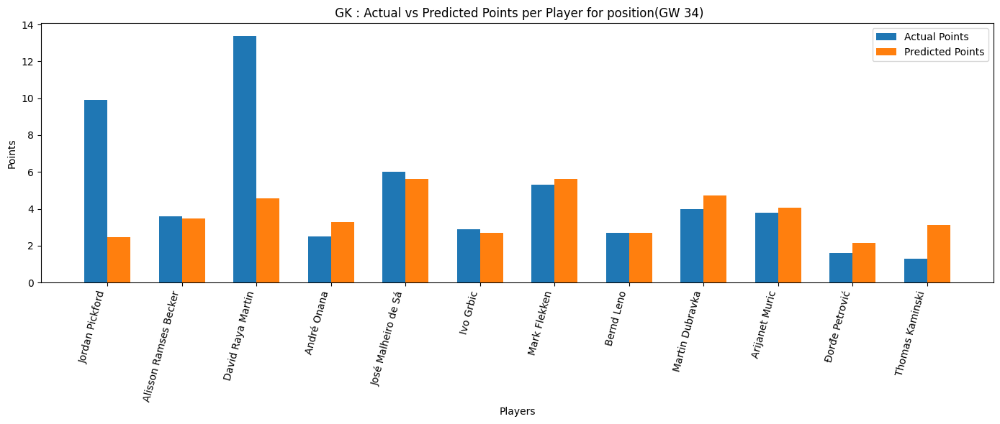

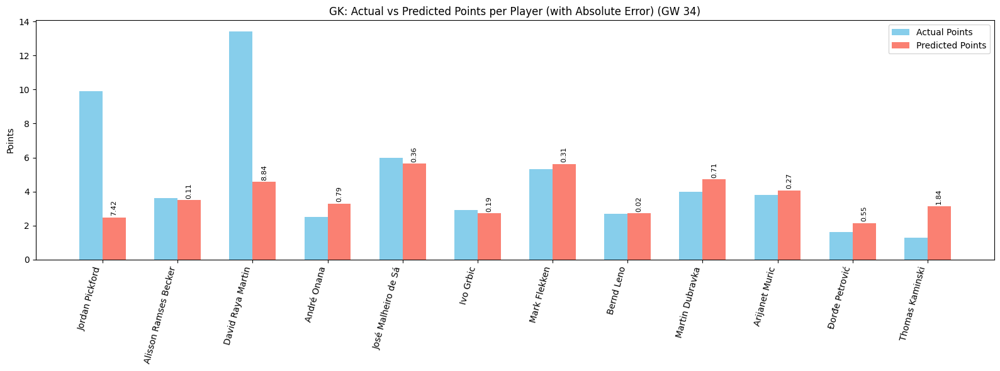

In [279]:
plot_preds(preds_df_34, 'GK', 34)


###### DEF


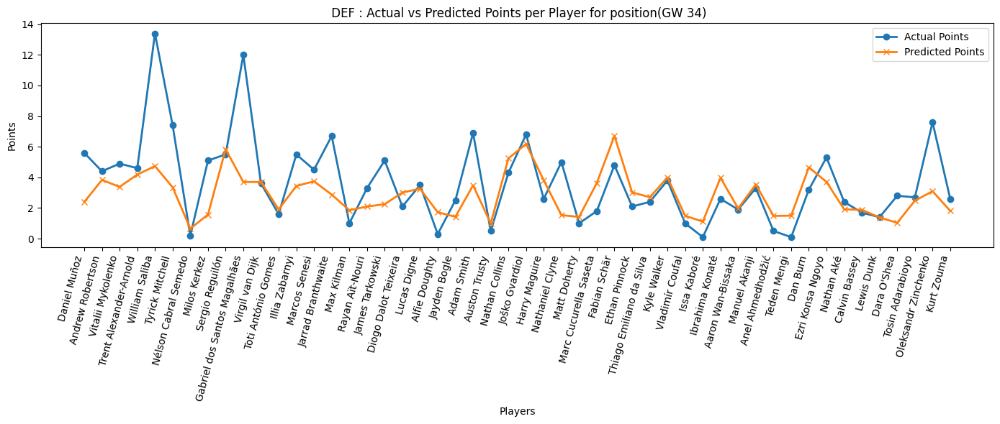

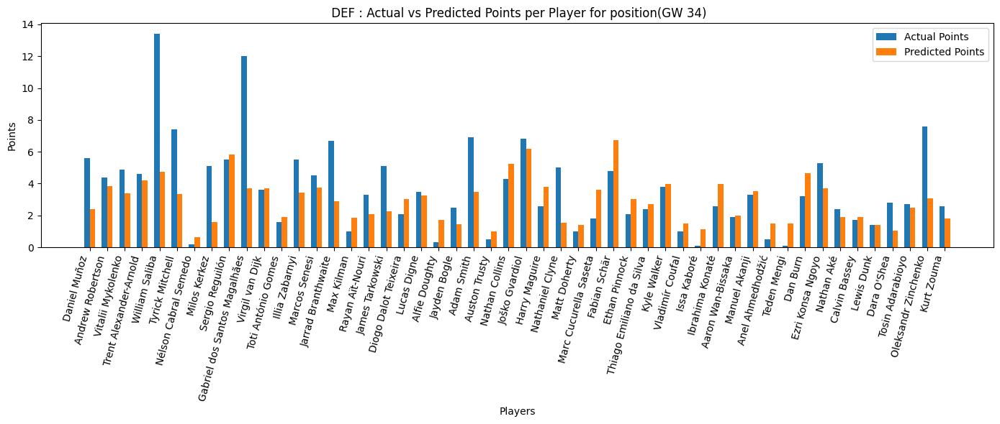

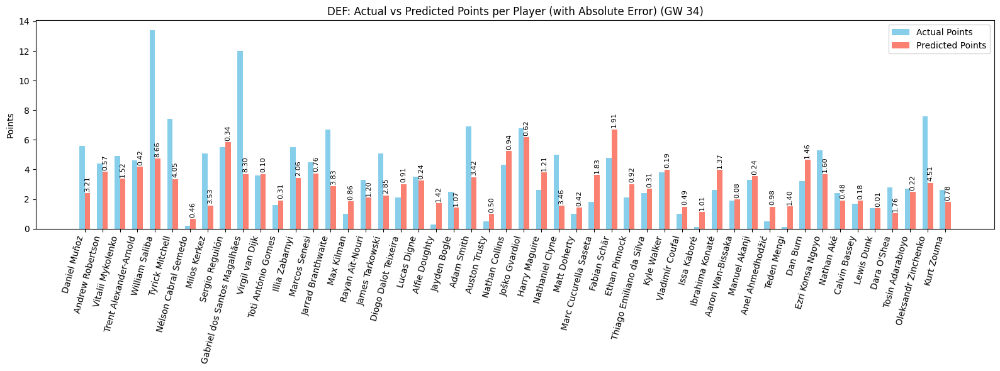

In [280]:
plot_preds(preds_df_34, 'DEF', 34)

###### MID


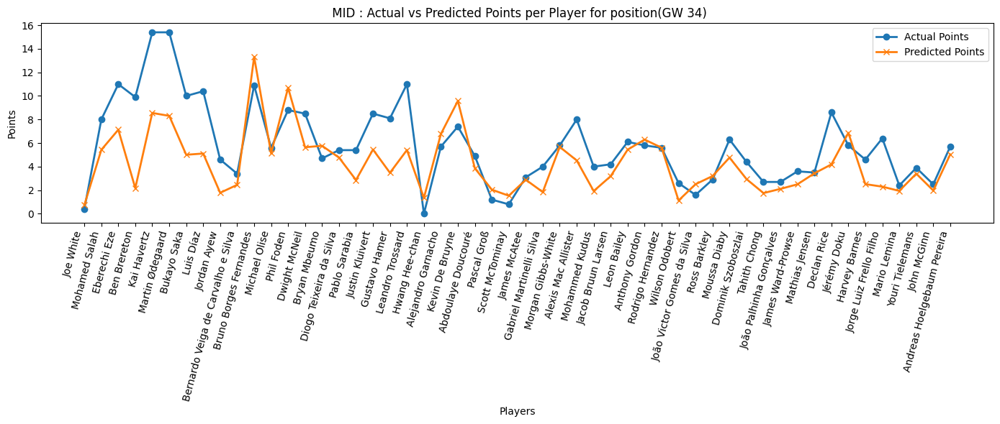

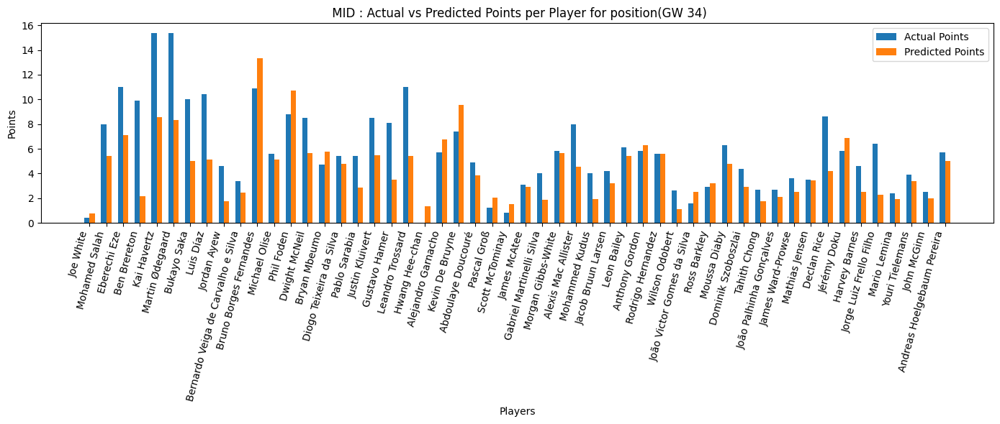

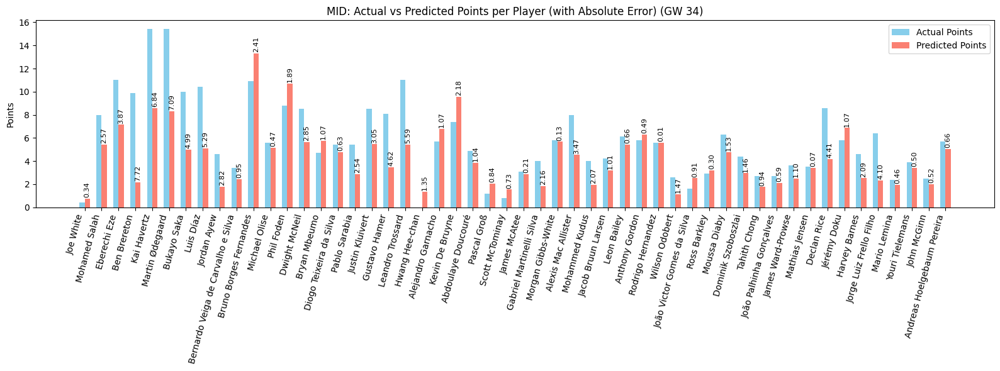

In [281]:
plot_preds(preds_df_34, 'MID', 34)

###### FWD


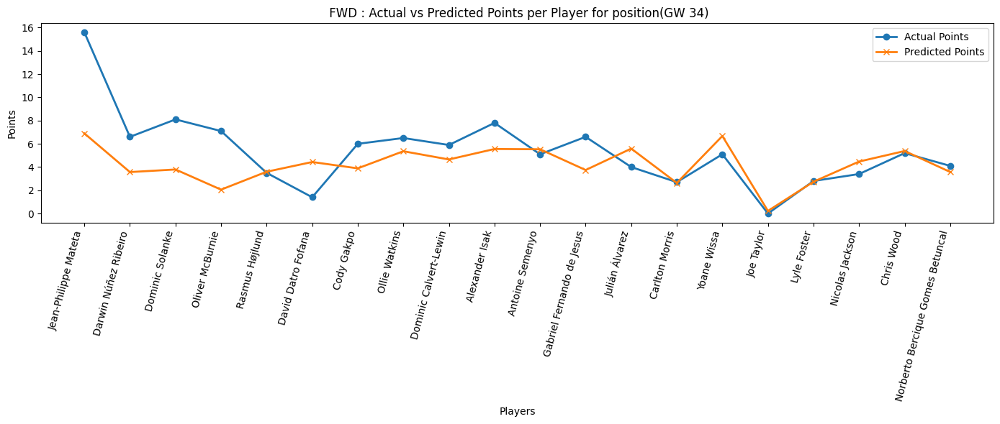

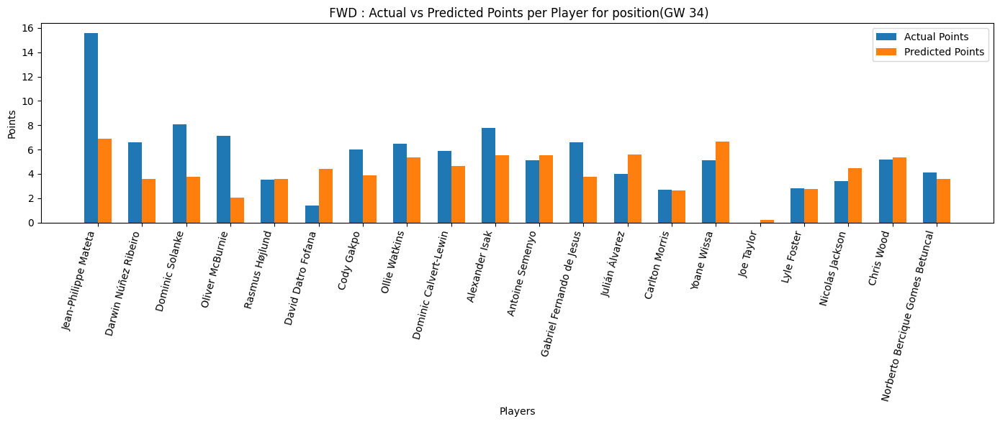

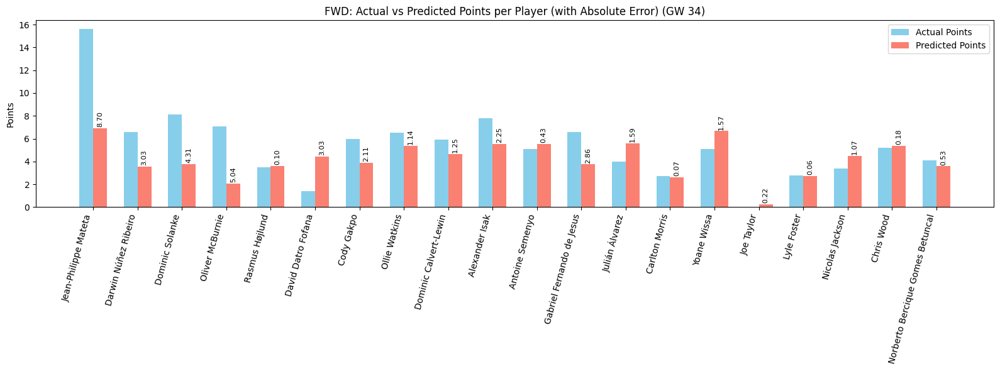

In [282]:
plot_preds(preds_df_34, 'FWD', 34)

#### Optimize


In [283]:
curr_data = final_df[final_df['round'] == 34].copy()
curr_data['xP_pred'] = Y_pred_34

players = curr_data[['fpl_id', 'fpl_name', 'team', 'value', 'position', 'xP_pred']].copy()
players['player_id'] = list(range(len(players)))

players.rename(columns={'fpl_name': 'name', 'value': 'price'}, inplace=True)
players = players.reset_index(drop=True)

selected_34 = run_pipeline(players)

# Get total points
players_selected_34 = curr_data[curr_data['fpl_id'].isin(selected_34['fpl_id'])].copy()
# players_selected_34 = players_selected_34.copy()
# 1. Create the rank column based on 'xp_preds'
# method='dense' ensures ties get the same rank, and the next rank is sequential
players_selected_34['xp_rank'] = players_selected_34['xP_pred'].rank(method='dense', ascending=False).astype(int)

# 2. Define the conditions and their corresponding multipliers
conditions = [
    players_selected_34['xp_rank'] == 1,  # Highest xp_preds
    players_selected_34['xp_rank'] == 2   # Second highest xp_preds
]
multipliers = [2.0, 1.5] # [multiplier for rank 1, multiplier for rank 2]

# 3. Use np.select() to apply the multiplier
# The 'default=1.0' means any rank other than 1 or 2 gets a 1.0 multiplier
players_selected_34['score'] = players_selected_34['score'] * np.select(conditions, multipliers, default=1.0)
total_points_34 = sum(players_selected_34['score'].values)
print(total_points_34, players_selected_34['score'].values, '--------->', players_selected_34['xP_pred'].values)

players_selected_34[['fpl_name', 'team', 'position', 'xP_pred', 'score']]

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-156.8514
IRL epoch 100/200 loss=-1595.7726
IRL epoch 150/200 loss=-6646.2134
IRL epoch 200/200 loss=-18034.9883
HGAT Policy Embeddings Shape: torch.Size([134, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
                      name                     team position  price  \
58         Kevin De Bruyne          Manchester City      MID   10.4   
8          Martin Ødegaard                  Arsenal      MID    8.6   
18  Bruno Borges Fernandes        Manchester United      MID    8.3   
24              Phil Foden          Manchester City      MID    8.2   
7              Kai Havertz                  Arsenal      MID    7.4   
48     José Malheiro de Sá  Wolverhampton Wanderers       GK    5.0   
76             Yoane Wissa                Brentford      FWD    5.7   
9     Jean-Philippe Mateta           Crystal Palace      FWD    5.0   
92            Fabian Schär         Newcastle United      DEF    5.6   
80        

,fpl_name,team,position,xP_pred,score
4262,Kai Havertz,Arsenal,MID,8.555739,17.0
4263,Martin Ødegaard,Arsenal,MID,8.309722,20.0
4264,Jean-Philippe Mateta,Crystal Palace,FWD,6.898966,29.0
4273,Bruno Borges Fernandes,Manchester United,MID,13.311977,36.0
4279,Phil Foden,Manchester City,MID,10.691510,24.0
4283,Sergio Reguilón,Manchester United,DEF,5.840720,7.0
4303,José Malheiro de Sá,Wolverhampton Wanderers,GK,5.637218,6.0
4313,Kevin De Bruyne,Manchester City,MID,9.579556,9.0
4331,Yoane Wissa,Brentford,FWD,6.670219,13.0
4335,Joško Gvardiol,Manchester City,DEF,6.182962,6.0


##### Rank


In [284]:
fg_managers_34 = fg_managers[fg_managers['gameweek'] == 34]
fg_managers_34[['points']]

position_34 = (fg_managers_34['points'] > total_points_34).sum() + 1
# 4. Display result
total_managers_34 = len(fg_managers_34)
percentile_34 = 100 * (1-(position_34 / total_managers_34))

print(total_points_34, total_managers_34)

print(f"Your predicted player’s total of {total_points_34} points would rank:")
print(f"→ Position: {position_34} out of {total_managers_34} managers")
print(f"→ Percentile: Top {percentile_34:.2f}%")


# Optional: show nearby ranks for context
nearby_34 = fg_managers_34.iloc[max(position_34-15,0):position_34+2][['points','prize']].reset_index(drop=True)
print("\nClosest scores around you:")
print(nearby_34)

168.0 203
Your predicted player’s total of 168.0 points would rank:
→ Position: 1 out of 203 managers
→ Percentile: Top 99.51%

Closest scores around you:
   points       prize
0   163.5  R 3,890.25
1   161.0  R 1,396.50
2   161.0  R 1,396.50


### GW 35


#### Predict


Data prepared. X shape: (4926, 177), M shape: (4926, 3), Y shape: (4926, 2)

Starting Training...
Epoch 1/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 9.6339 - mae: 2.3647 - mse: 9.3991 - val_loss: 4.4845 - val_mae: 1.4466 - val_mse: 4.2486
Epoch 2/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.6127 - mae: 1.3735 - mse: 3.3769 - val_loss: 3.6372 - val_mae: 1.2652 - val_mse: 3.4014
Epoch 3/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.9227 - mae: 1.2117 - mse: 2.6869 - val_loss: 3.3367 - val_mae: 1.2060 - val_mse: 3.1010
Epoch 4/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.5012 - mae: 1.1178 - mse: 2.2655 - val_loss: 3.0388 - val_mae: 1.1430 - val_mse: 2.8032
Epoch 5/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.2803 - mae: 1.0645 - mse: 2.0447 - val_loss: 2.8821 - val_mae: 1.1074 - val_mse: 2.6467
Epoch 6/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.2133 - mae: 1.0225 - mse: 1.9779 - val_loss: 2.8026 - val_mae: 1.0951 - val_mse: 2.5673
E

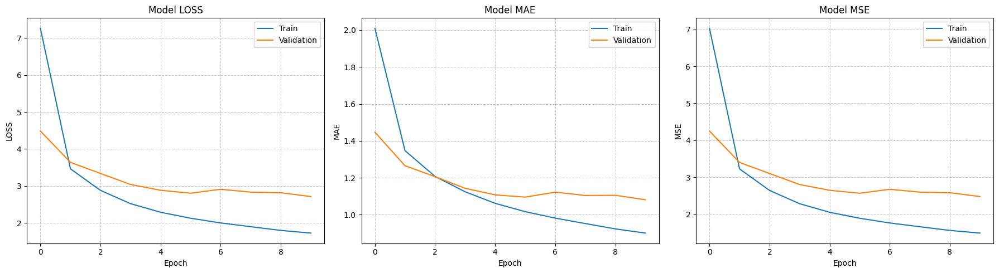


--- Final Test Set Evaluation (GW 35) ---

Evaluating test set performance...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Evaluating test set performance...{'loss': 2.5645508766174316, 'mae': 1.0795239210128784, 'mse': 2.3301494121551514}
R²: 0.6336683358799189
MAE: 1.0795239210128784
MSE: 2.3301494121551514
Loss: 2.5645508766174316

Generating Predictions...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

--- Results for Gameweek 35 ---
 Gameweek                 Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       35 Bruno Borges Fernandes       11.3         13.03       0.81     -0.89
       35            Cole Palmer       18.6         12.13       0.01      0.71
       35        Kevin De Bruyne        9.0          9.69       1.11     -1.38
       35            Kai Havertz        8.8          9.35       0.50     -0.47
       35         Alexander Isak        7.7          8.84       1.29     -1.65
       35        Jordan Pickford        7.2          8.35       0.00      0.20
       35     Jarra

In [285]:
train_data, test_data , GW_full, X_cols = transform_data(final_df, cols, 35)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_35 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_35.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_35 = model_35.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_35)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 35) ---")
test_result_35 = model_35.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_35, X_test_scaled, M_test_scaled, Y_test)
print(f"Evaluating test set performance...{test_result_35}")
print(f"R²: {evaluation_metrics['test_R2']:.16f}")
print(f"MAE: {evaluation_metrics['test_mae']:.16f}")
print(f"MSE: {evaluation_metrics['test_mse']:.16f}")
print(f"Loss: {evaluation_metrics['test_loss']:.16f}")


# Prediction
print("\nGenerating Predictions...")
Y_pred_35 = model_35.predict([X_test_scaled, M_test_scaled]).flatten()

position_35 = final_df['position'][test_mask]
teams_35 = final_df['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_35, 'team': teams_35, 'position': position_35}
preds_df_35 = pd.DataFrame(players_preds)



# Results
results_df_35 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_35,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 35 ---")
print(results_df_35.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))

##### Plots


###### GK


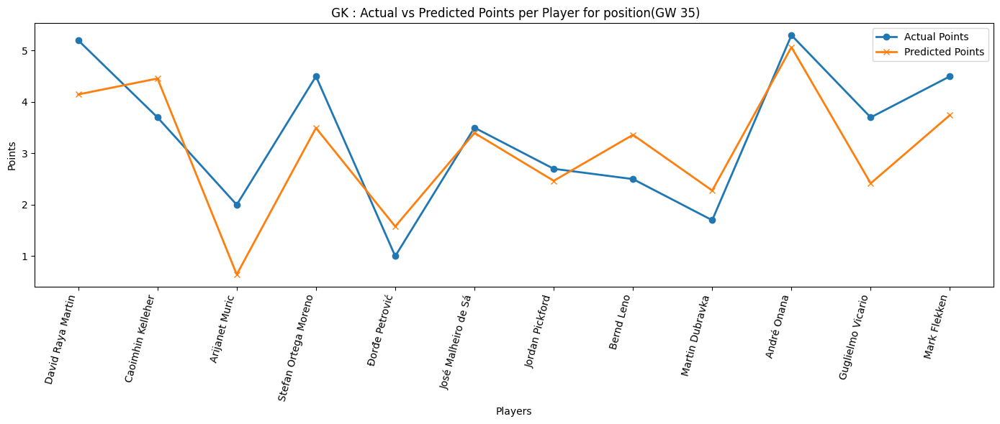

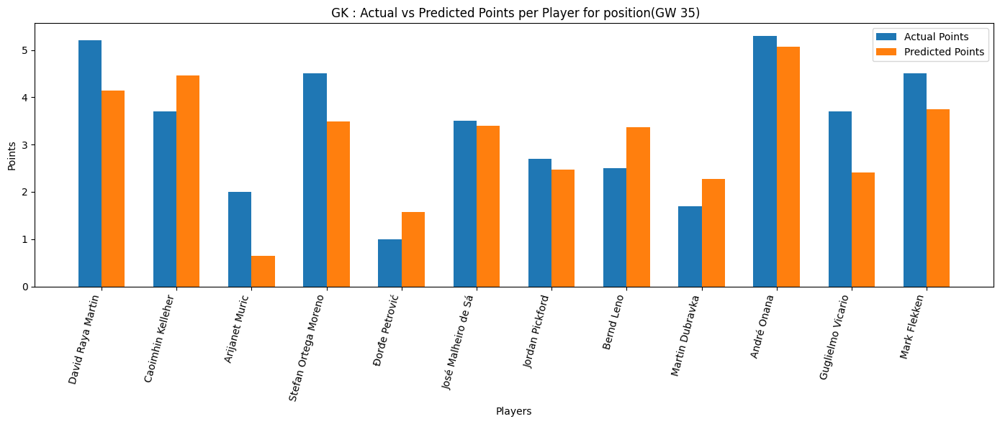

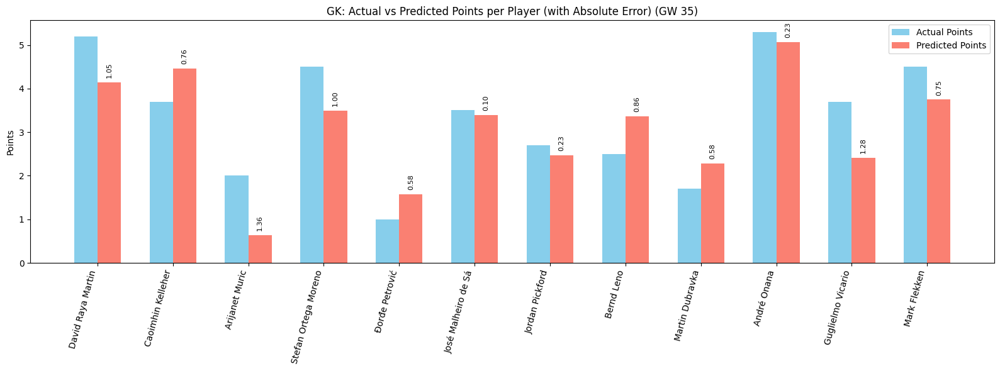

In [286]:
plot_preds(preds_df_31, 'GK', 35)

###### DEF


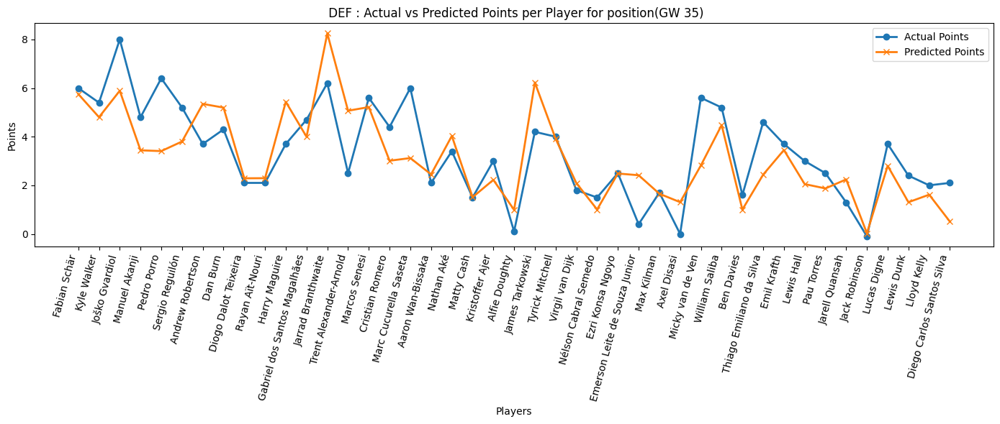

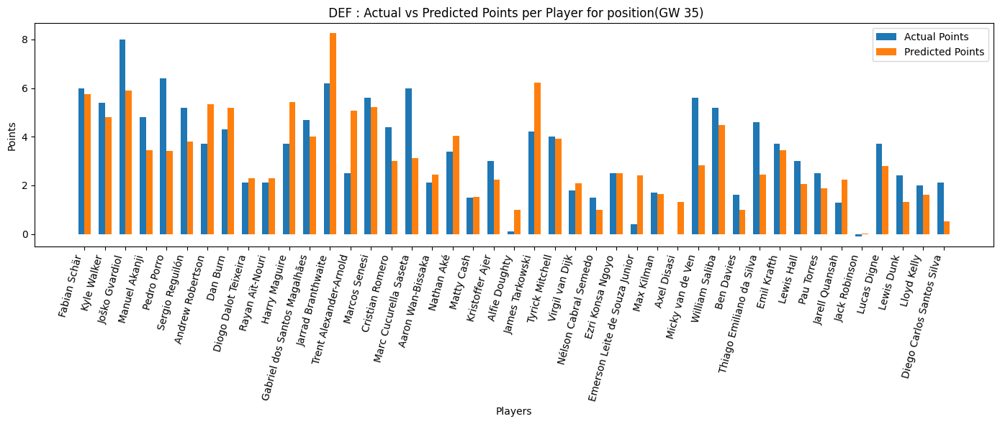

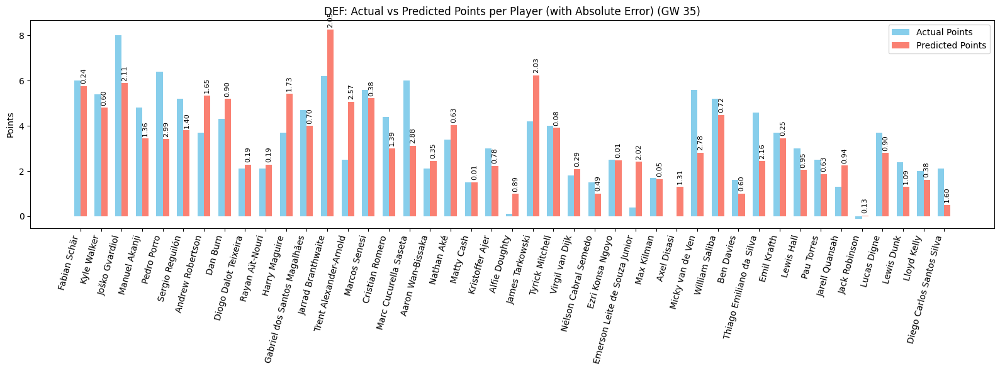

In [287]:
plot_preds(preds_df_35, 'DEF', 35)

###### MID


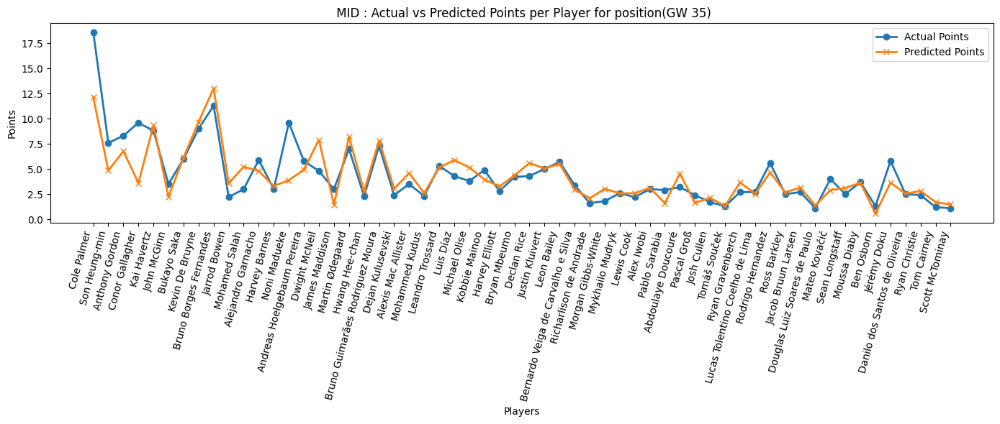

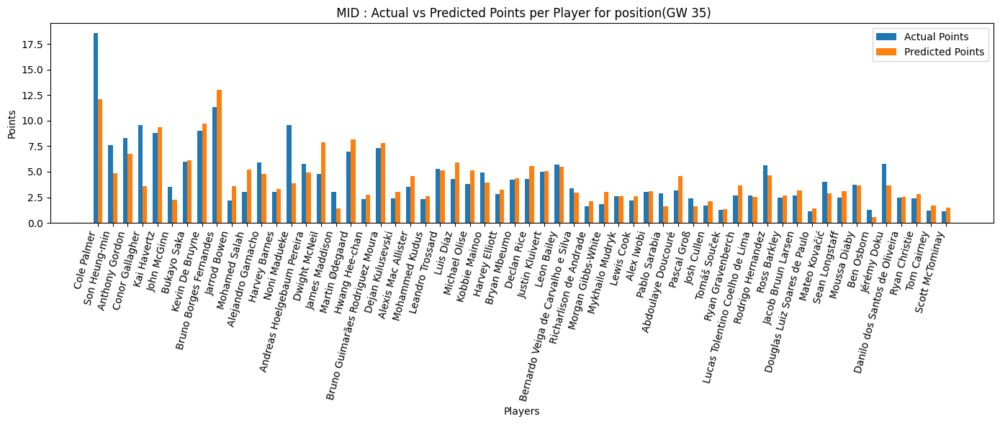

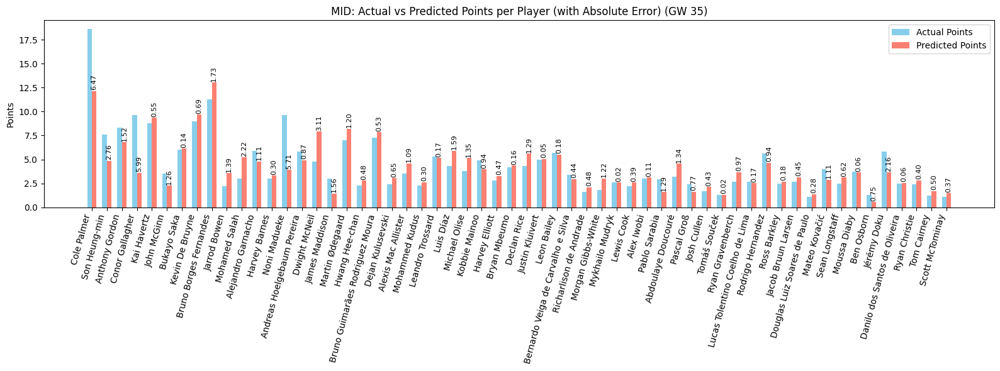

In [288]:
plot_preds(preds_df_35, 'MID', 35)

###### FWD


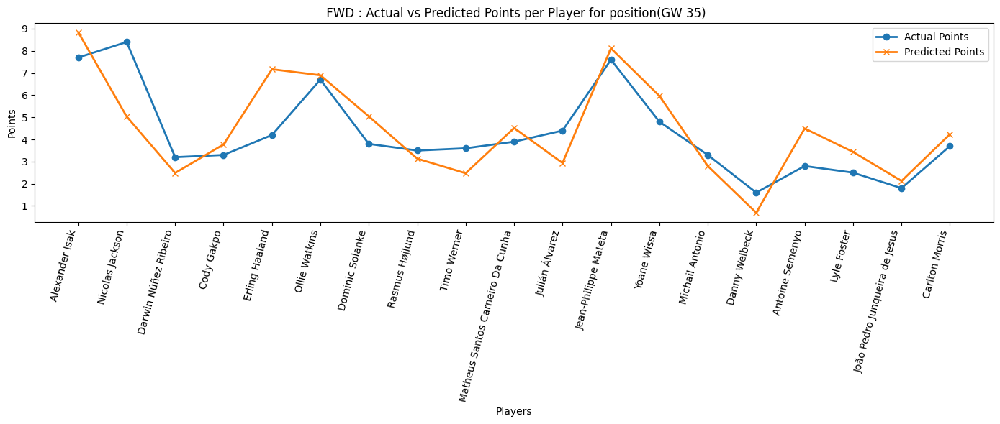

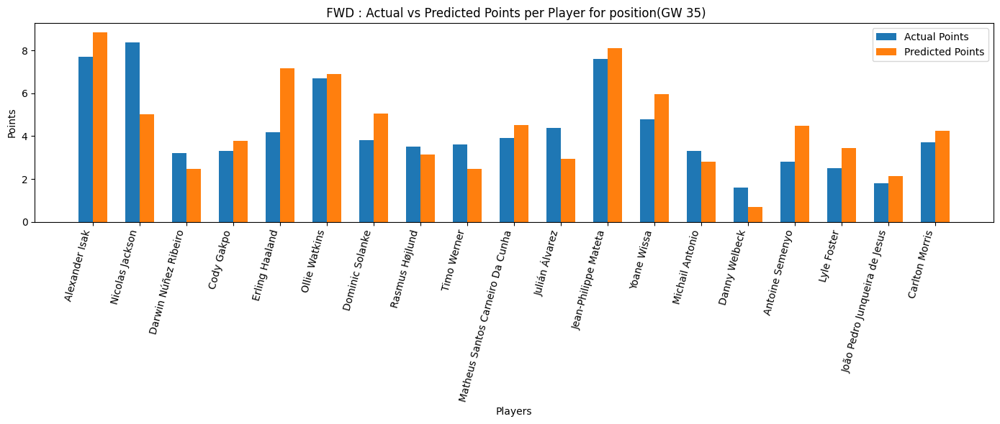

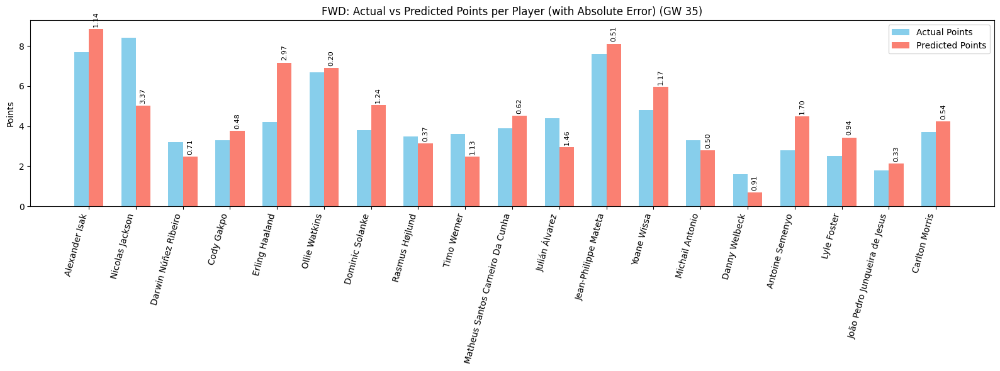

In [289]:
plot_preds(preds_df_35, 'FWD', 35)

#### Optimize


In [290]:
curr_data = final_df[final_df['round'] == 35].copy()
curr_data['xP_pred'] = Y_pred_35

players = curr_data[['fpl_id', 'fpl_name', 'team', 'value', 'position', 'xP_pred']].copy()
players['player_id'] = list(range(len(players)))

players.rename(columns={'fpl_name': 'name', 'value': 'price'}, inplace=True)
players = players.reset_index(drop=True)

selected_35 = run_pipeline(players)

# Get total points
players_selected_35 = curr_data[curr_data['fpl_id'].isin(selected_35['fpl_id'])].copy()
# players_selected_35 = players_selected_35.copy()
# 1. Create the rank column based on 'xp_preds'
# method='dense' ensures ties get the same rank, and the next rank is sequential
players_selected_35['xp_rank'] = players_selected_35['xP_pred'].rank(method='dense', ascending=False).astype(int)

# 2. Define the conditions and their corresponding multipliers
conditions = [
    players_selected_35['xp_rank'] == 1,  # Highest xp_preds
    players_selected_35['xp_rank'] == 2   # Second highest xp_preds
]
multipliers = [2.0, 1.5] # [multiplier for rank 1, multiplier for rank 2]

# 3. Use np.select() to apply the multiplier
# The 'default=1.0' means any rank other than 1 or 2 gets a 1.0 multiplier
players_selected_35['score'] = players_selected_35['score'] * np.select(conditions, multipliers, default=1.0)
total_points_35 = sum(players_selected_35['score'].values)
print(total_points_35, players_selected_35['score'].values, '--------->', players_selected_35['xP_pred'].values)

players_selected_35[['fpl_name', 'team', 'position', 'xP_pred', 'score']]

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-97.9432
IRL epoch 100/200 loss=-1130.5951
IRL epoch 150/200 loss=-4912.2363
IRL epoch 200/200 loss=-13551.9229
HGAT Policy Embeddings Shape: torch.Size([132, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
                      name               team position  price    xP_pred  \
19         Kevin De Bruyne    Manchester City      MID   10.4   9.692191   
54         Martin Ødegaard            Arsenal      MID    8.6   8.197224   
20  Bruno Borges Fernandes  Manchester United      MID    8.4  13.027077   
11             Kai Havertz            Arsenal      MID    7.4   9.347401   
4              Cole Palmer            Chelsea      MID    6.2  12.127748   
0          Jordan Pickford            Everton       GK    4.7   8.347594   
8           Alexander Isak   Newcastle United      FWD    8.2   8.840195   
67    Jean-Philippe Mateta     Crystal Palace      FWD    5.1   8.111305   
3           Joško Gvardiol    Manches

,fpl_name,team,position,xP_pred,score
4389,Jordan Pickford,Everton,GK,8.347594,10.0
4392,Joško Gvardiol,Manchester City,DEF,5.890379,15.0
4393,Cole Palmer,Chelsea,MID,12.127748,12.0
4397,Alexander Isak,Newcastle United,FWD,8.840195,13.0
4400,Kai Havertz,Arsenal,MID,9.347401,13.0
4408,Kevin De Bruyne,Manchester City,MID,9.692191,11.0
4409,Bruno Borges Fernandes,Manchester United,MID,13.027077,8.0
4420,Jarrad Branthwaite,Everton,DEF,8.249373,6.0
4443,Martin Ødegaard,Arsenal,MID,8.197224,2.0
4453,James Tarkowski,Everton,DEF,6.228734,5.0


##### Rank


In [291]:
fg_managers_35 = fg_managers[fg_managers['gameweek'] == 35]
fg_managers_35[['points']]

position_35 = (fg_managers_35['points'] > total_points_35).sum() + 1
# 4. Display result
total_managers_35 = len(fg_managers_35)
percentile_35 = 100 * (1-(position_35 / total_managers_35))

print(total_points_35, total_managers_35)

print(f"Your predicted player’s total of {total_points_35} points would rank:")
print(f"→ Position: {position_35} out of {total_managers_35} managers")
print(f"→ Percentile: Top {percentile_35:.2f}%")


# Optional: show nearby ranks for context
nearby_35 = fg_managers_35.iloc[max(position_35-15,0):position_35+2][['points','prize']].reset_index(drop=True)
print("\nClosest scores around you:")
print(nearby_35)

97.0 207
Your predicted player’s total of 97.0 points would rank:
→ Position: 4 out of 207 managers
→ Percentile: Top 98.07%

Closest scores around you:
   points       prize
0   111.5  R 3,890.25
1   100.0  R 1,695.75
2    97.5  R 1,097.25
3    94.5    R 522.50
4    93.0    R 399.00
5    92.5    R 299.25


### GW 36


#### Predict


Data prepared. X shape: (4926, 177), M shape: (4926, 3), Y shape: (4926, 2)

Starting Training...
Epoch 1/10
113/113 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 9.3394 - mae: 2.3254 - mse: 9.1055 - val_loss: 4.0524 - val_mae: 1.3993 - val_mse: 3.8178
Epoch 2/10
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5089 - mae: 1.3431 - mse: 3.2744 - val_loss: 3.3695 - val_mae: 1.2444 - val_mse: 3.1353
Epoch 3/10
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.9194 - mae: 1.1920 - mse: 2.6853 - val_loss: 3.0598 - val_mae: 1.1729 - val_mse: 2.8259
Epoch 4/10
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.4264 - mae: 1.0729 - mse: 2.1925 - val_loss: 2.9206 - val_mae: 1.1378 - val_mse: 2.6869
Epoch 5/10
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3026 - mae: 1.0426 - mse: 2.0689 - val_loss: 2.8644 - val_mae: 1.1170 - val_mse: 2.6308
Epoch 6/10
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.0863 - mae: 1.0082 - mse: 1.8529 - val_loss: 2.8401 - val_mae: 1.1032 - val_mse: 2.6069
Ep

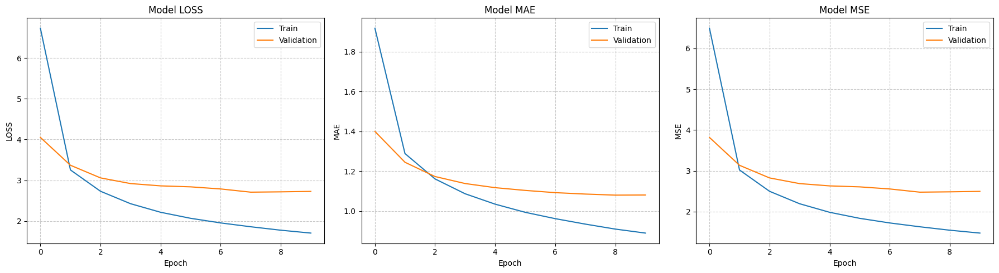


--- Final Test Set Evaluation (GW 36) ---

Evaluating test set performance...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Evaluating test set performance...{'loss': 2.0946645736694336, 'mae': 1.0484755039215088, 'mse': 1.8617888689041138}
R²: 0.6454278374127005
MAE: 1.0484755039215088
MSE: 1.8617888689041138
Loss: 2.0946645736694336

Generating Predictions...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 

--- Results for Gameweek 36 ---
 Gameweek                          Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       36                  Erling Haaland       10.0         12.74       1.52     -2.14
       36                     Cole Palmer        8.4         12.25       0.59      1.23
       36                 Nicolas Jackson        8.0         11.55       0.59     -0.62
       36                      Phil Foden        6.2         11.39       1.52     -2.14
       36                    Noni Madueke        6.6          9.69       0.59     -0.62
       36                     Kai Havertz   

In [292]:
train_data, test_data , GW_full, X_cols = transform_data(final_df, cols, 36)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_36 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_36.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_36 = model_36.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_36)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 36) ---")
test_result_36 = model_36.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_36, X_test_scaled, M_test_scaled, Y_test)
print(f"Evaluating test set performance...{test_result_36}")
print(f"R²: {evaluation_metrics['test_R2']:.16f}")
print(f"MAE: {evaluation_metrics['test_mae']:.16f}")
print(f"MSE: {evaluation_metrics['test_mse']:.16f}")
print(f"Loss: {evaluation_metrics['test_loss']:.16f}")


# Prediction
print("\nGenerating Predictions...")
Y_pred_36 = model_36.predict([X_test_scaled, M_test_scaled]).flatten()

position_36 = final_df['position'][test_mask]
teams_36 = final_df['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_36, 'team': teams_36, 'position': position_36}
preds_df_36 = pd.DataFrame(players_preds)



# Results
results_df_36 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_36,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 36 ---")
print(results_df_36.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))

##### Plots


###### GK


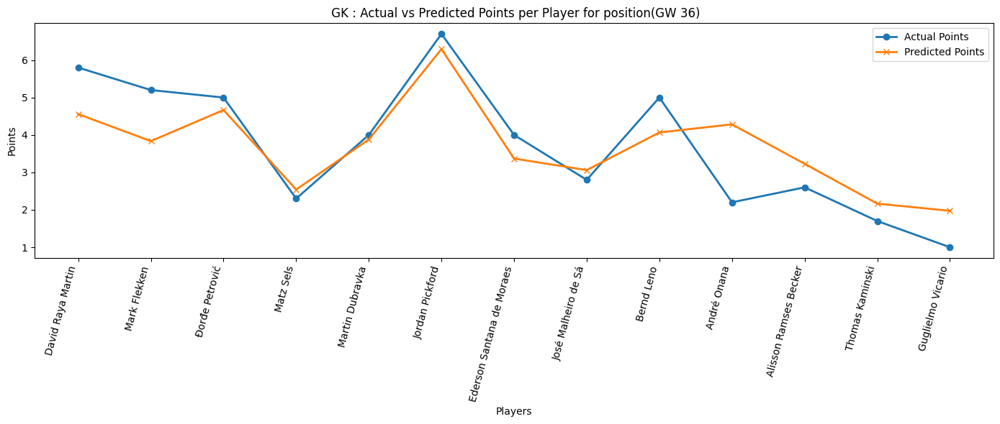

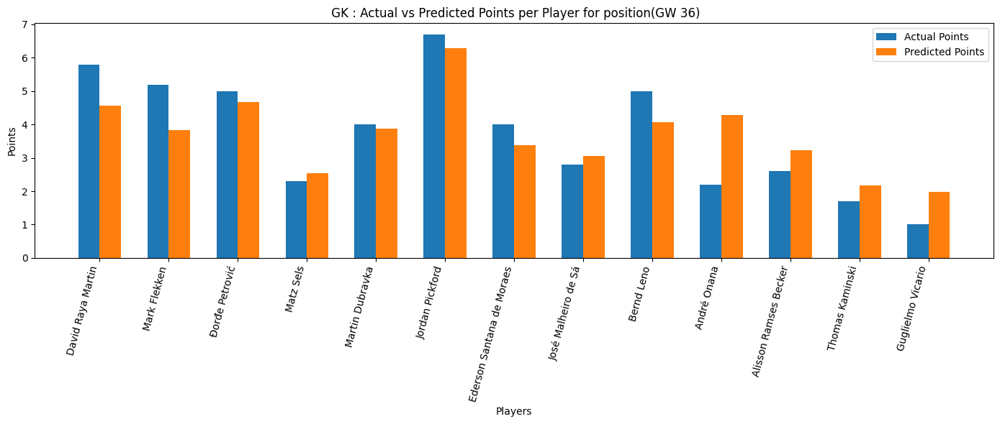

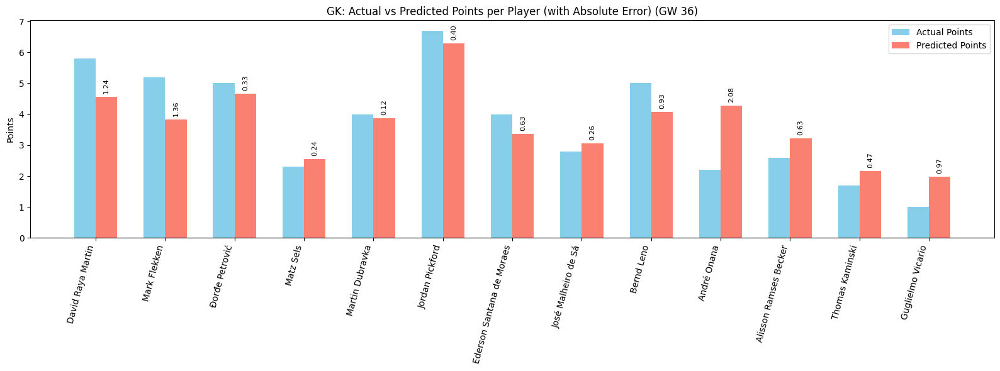

In [293]:
plot_preds(preds_df_36, 'GK', 36)


###### DEF


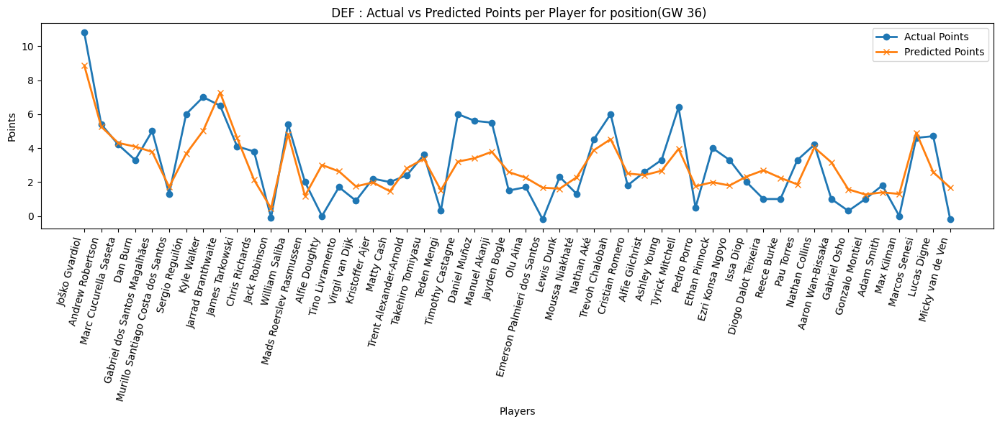

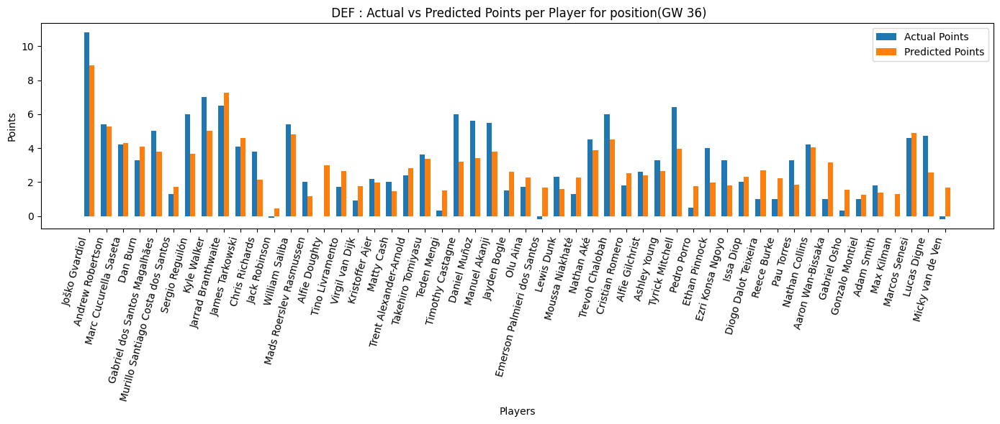

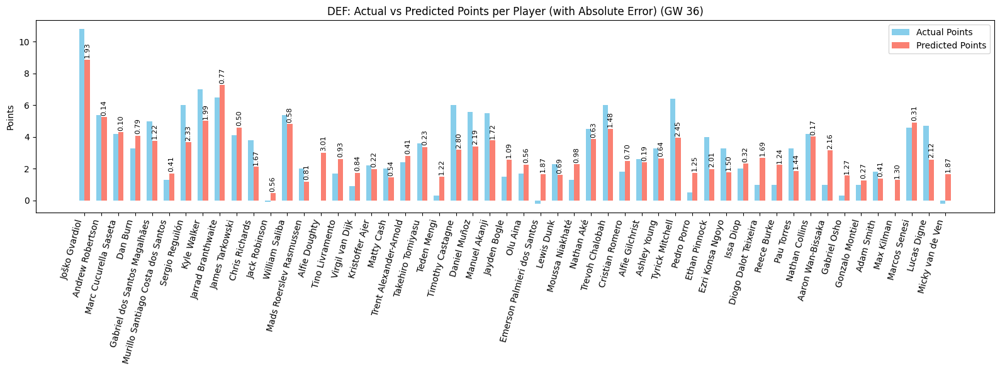

In [294]:
plot_preds(preds_df_36, 'DEF', 36)

###### MID


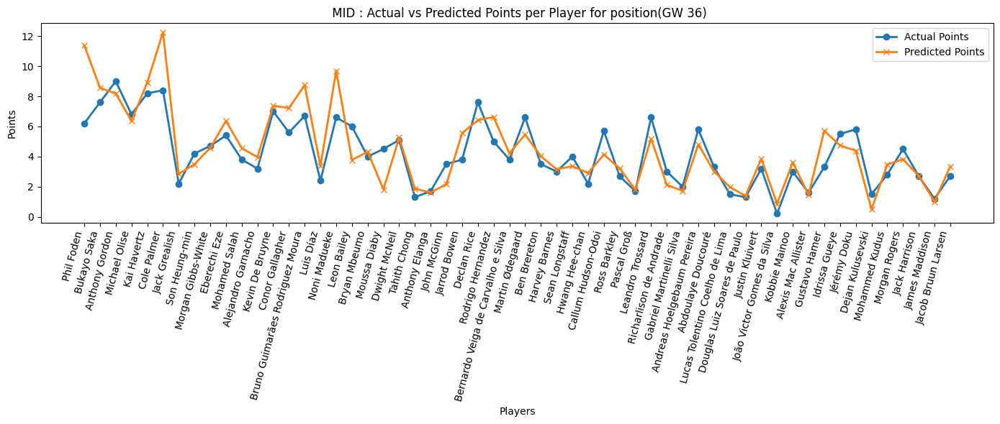

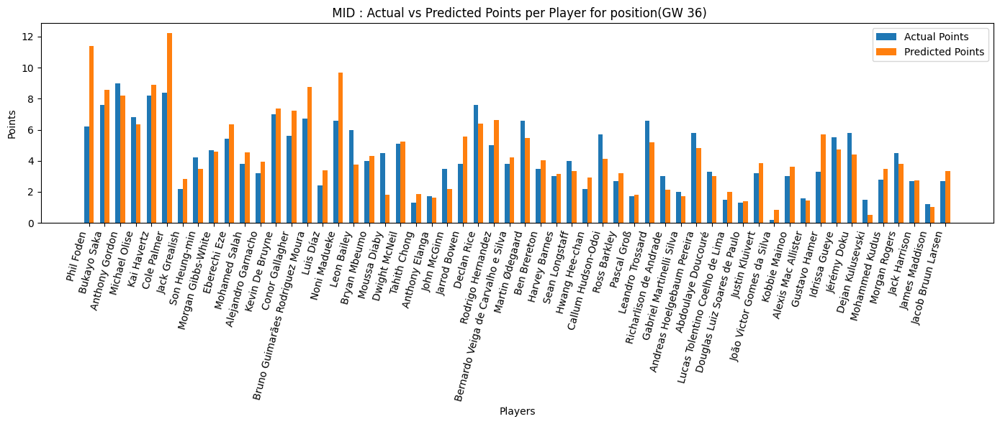

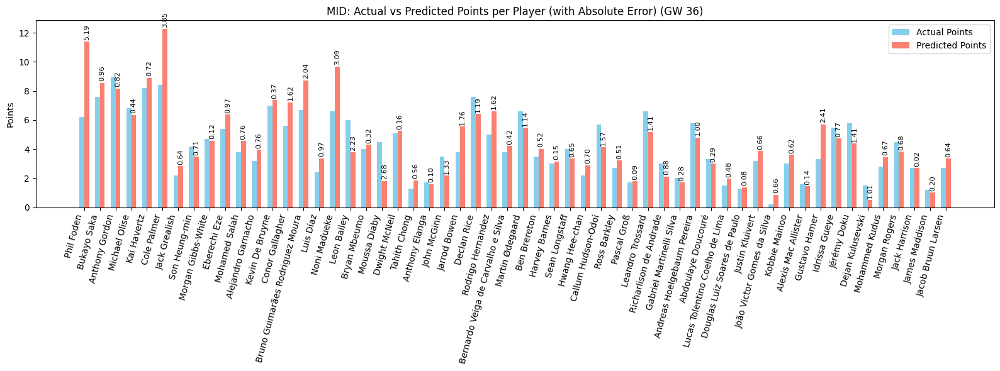

In [295]:
plot_preds(preds_df_36, 'MID', 36)

###### FWD


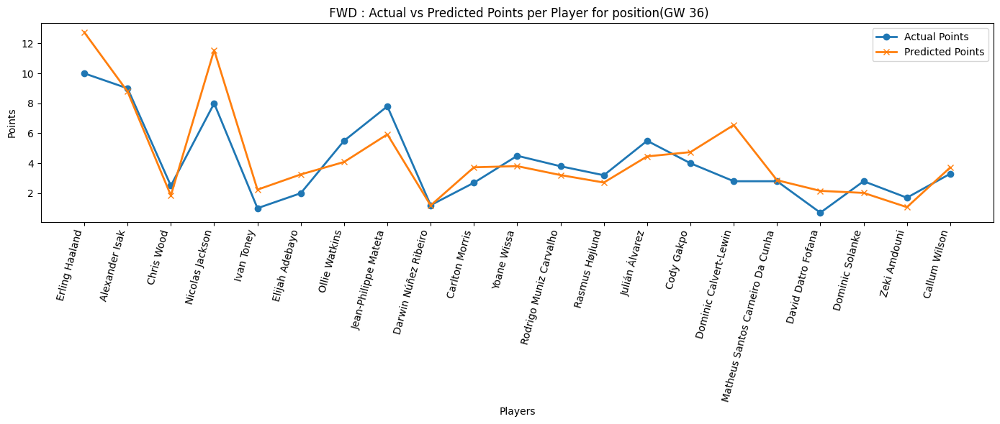

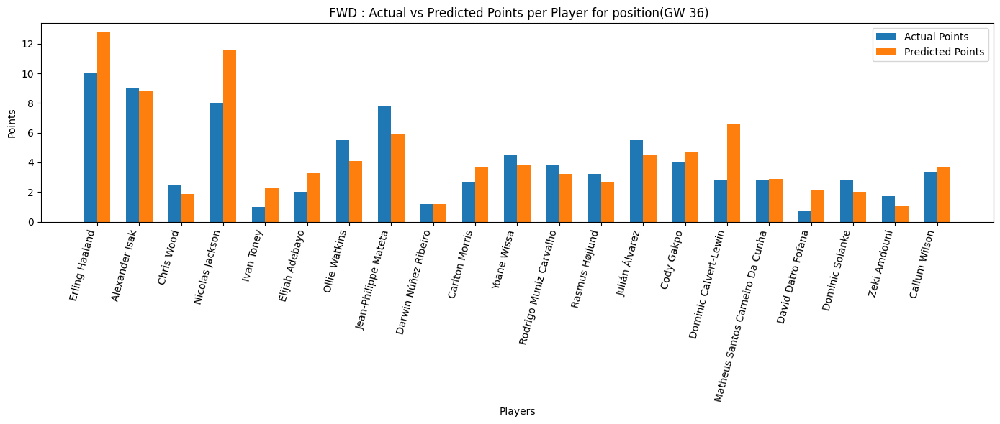

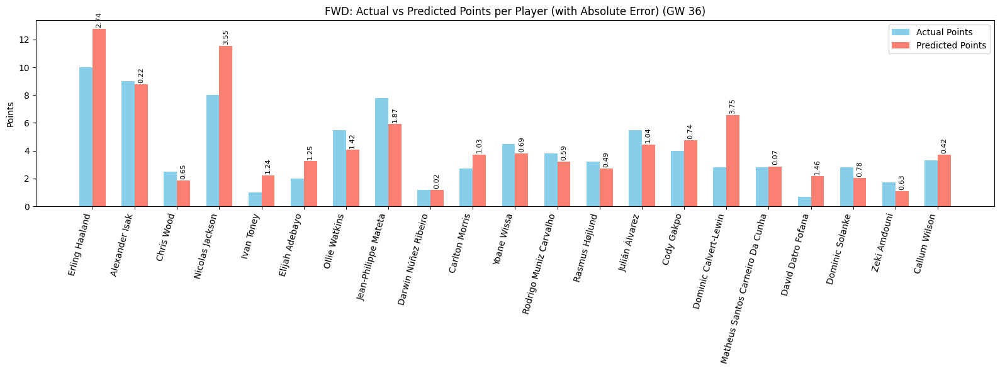

In [296]:
plot_preds(preds_df_36, 'FWD', 36)

#### Optimize


In [297]:
curr_data = final_df[final_df['round'] == 36].copy()
curr_data['xP_pred'] = Y_pred_36

players = curr_data[['fpl_id', 'fpl_name', 'team', 'value', 'position', 'xP_pred']].copy()
players['player_id'] = list(range(len(players)))

players.rename(columns={'fpl_name': 'name', 'value': 'price'}, inplace=True)
players = players.reset_index(drop=True)

selected_36 = run_pipeline(players)

# Get total points
players_selected_36 = curr_data[curr_data['fpl_id'].isin(selected_36['fpl_id'])].copy()
# players_selected_36 = players_selected_36.copy()
# 1. Create the rank column based on 'xp_preds'
# method='dense' ensures ties get the same rank, and the next rank is sequential
players_selected_36['xp_rank'] = players_selected_36['xP_pred'].rank(method='dense', ascending=False).astype(int)

# 2. Define the conditions and their corresponding multipliers
conditions = [
    players_selected_36['xp_rank'] == 1,  # Highest xp_preds
    players_selected_36['xp_rank'] == 2   # Second highest xp_preds
]
multipliers = [2.0, 1.5] # [multiplier for rank 1, multiplier for rank 2]

# 3. Use np.select() to apply the multiplier
# The 'default=1.0' means any rank other than 1 or 2 gets a 1.0 multiplier
players_selected_36['score'] = players_selected_36['score'] * np.select(conditions, multipliers, default=1.0)
total_points_36 = sum(players_selected_36['score'].values)
print(total_points_36, players_selected_36['score'].values, '--------->', players_selected_36['xP_pred'].values)

players_selected_36[['fpl_name', 'team', 'position', 'xP_pred', 'score']]

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-306.6484
IRL epoch 100/200 loss=-3413.3806
IRL epoch 150/200 loss=-14738.6953
IRL epoch 200/200 loss=-40636.9570
HGAT Policy Embeddings Shape: torch.Size([142, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
                  name              team position  price    xP_pred  \
3           Phil Foden   Manchester City      MID    8.4  11.392684   
12         Kai Havertz           Arsenal      MID    7.5   8.917024   
13         Cole Palmer           Chelsea      MID    6.2  12.249427   
43        Noni Madueke           Chelsea      MID    5.3   9.690381   
31     Jordan Pickford           Everton       GK    4.8   6.295155   
7       Erling Haaland   Manchester City      FWD   14.1  12.743966   
8       Alexander Isak  Newcastle United      FWD    8.3   8.782615   
15     Nicolas Jackson           Chelsea      FWD    6.9  11.552707   
2     Andrew Robertson         Liverpool      DEF    6.5   5.259342   
1       J

,fpl_name,team,position,xP_pred,score
4522,Joško Gvardiol,Manchester City,DEF,8.868333,6.0
4523,Andrew Robertson,Liverpool,DEF,5.259342,13.0
4524,Phil Foden,Manchester City,MID,11.392684,5.0
4528,Erling Haaland,Manchester City,FWD,12.743966,42.0
4529,Alexander Isak,Newcastle United,FWD,8.782615,7.0
4533,Kai Havertz,Arsenal,MID,8.917024,5.0
4534,Cole Palmer,Chelsea,MID,12.249427,12.0
4536,Nicolas Jackson,Chelsea,FWD,11.552707,16.0
4552,Jordan Pickford,Everton,GK,6.295155,3.0
4557,Jarrad Branthwaite,Everton,DEF,7.271748,5.0


##### Rank


In [298]:
fg_managers_36 = fg_managers[fg_managers['gameweek'] == 36]
fg_managers_36[['points']]

position_36 = (fg_managers_36['points'] > total_points_36).sum() + 1
# 4. Display result
total_managers_36 = len(fg_managers_36)
percentile_36 = 100 * (1-(position_36 / total_managers_36))

print(total_points_36, total_managers_36)

print(f"Your predicted player’s total of {total_points_36} points would rank:")
print(f"→ Position: {position_36} out of {total_managers_36} managers")
print(f"→ Percentile: Top {percentile_36:.2f}%")


# Optional: show nearby ranks for context
nearby_36 = fg_managers_36.iloc[max(position_36-15,0):position_36+2][['points','prize']].reset_index(drop=True)
print("\nClosest scores around you:")
print(nearby_36)

127.0 229
Your predicted player’s total of 127.0 points would rank:
→ Position: 1 out of 229 managers
→ Percentile: Top 99.56%

Closest scores around you:
   points       prize
0   124.0  R 3,890.25
1   115.5  R 1,396.50
2   115.5  R 1,396.50


### GW 37


#### Predict


Data prepared. X shape: (4926, 177), M shape: (4926, 3), Y shape: (4926, 2)

Starting Training...
Epoch 1/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 12.1316 - mae: 2.7791 - mse: 11.8963 - val_loss: 4.4825 - val_mae: 1.4966 - val_mse: 4.2464
Epoch 2/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7512 - mae: 1.3934 - mse: 3.5151 - val_loss: 3.4102 - val_mae: 1.2589 - val_mse: 3.1742
Epoch 3/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.0122 - mae: 1.2348 - mse: 2.7762 - val_loss: 2.9632 - val_mae: 1.1543 - val_mse: 2.7273
Epoch 4/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.4497 - mae: 1.0898 - mse: 2.2138 - val_loss: 2.7935 - val_mae: 1.1111 - val_mse: 2.5579
Epoch 5/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.2426 - mae: 1.0404 - mse: 2.0070 - val_loss: 2.6951 - val_mae: 1.0889 - val_mse: 2.4597
Epoch 6/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.9861 - mae: 0.9693 - mse: 1.7509 - val_loss: 2.6895 - val_mae: 1.0842 - val_mse: 2.4545


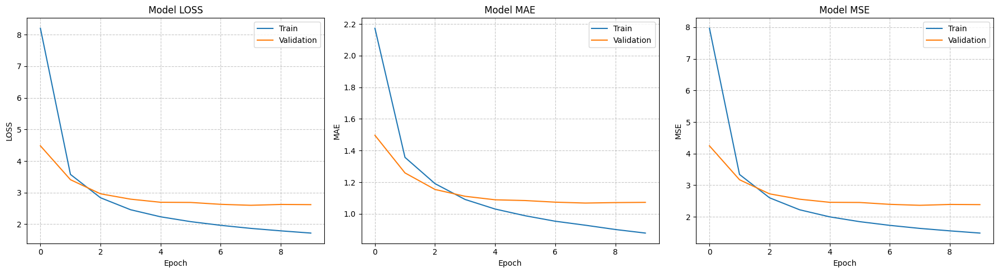


--- Final Test Set Evaluation (GW 37) ---

Evaluating test set performance...
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Evaluating test set performance...{'loss': 5.812262535095215, 'mae': 1.5995261669158936, 'mse': 5.577836990356445}
R²: 0.6074519638281330
MAE: 1.5995261669158936
MSE: 5.5778369903564453
Loss: 5.8122625350952148

Generating Predictions...
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 

--- Results for Gameweek 37 ---
 Gameweek            Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       37    Erling Haaland       17.9         14.78       0.95     -1.22
       37        Phil Foden       14.3         13.19       1.36     -1.70
       37    Joško Gvardiol       23.1         12.32       1.36     -1.70
       37       Cole Palmer       10.0         10.95      -0.92     -0.14
       37   Kevin De Bruyne       15.1         10.73       1.36     -1.70
       37   Nicolas Jackson       11.0         10.70       0.22     -0.10
       37    Anthony Gordon       10.0          8.97    

In [299]:
train_data, test_data , GW_full, X_cols = transform_data(final_df, cols, 37)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_37 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_37.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_37 = model_37.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_37)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 37) ---")
test_result_37 = model_37.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_37, X_test_scaled, M_test_scaled, Y_test)
print(f"Evaluating test set performance...{test_result_37}")
print(f"R²: {evaluation_metrics['test_R2']:.16f}")
print(f"MAE: {evaluation_metrics['test_mae']:.16f}")
print(f"MSE: {evaluation_metrics['test_mse']:.16f}")
print(f"Loss: {evaluation_metrics['test_loss']:.16f}")


# Prediction
print("\nGenerating Predictions...")
Y_pred_37 = model_37.predict([X_test_scaled, M_test_scaled]).flatten()

position_37 = final_df['position'][test_mask]
teams_37 = final_df['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_37, 'team': teams_37, 'position': position_37}
preds_df_37 = pd.DataFrame(players_preds)



# Results
results_df_37 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_37,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 37 ---")
print(results_df_37.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))

##### Plots


###### GK


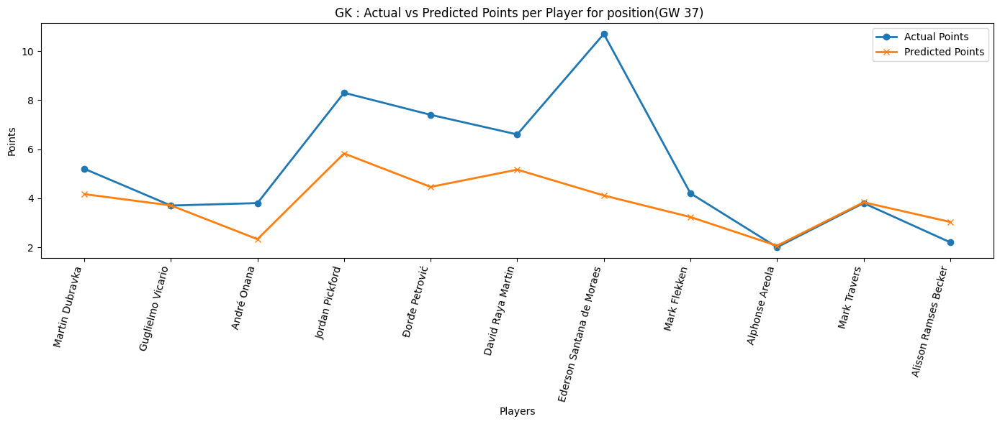

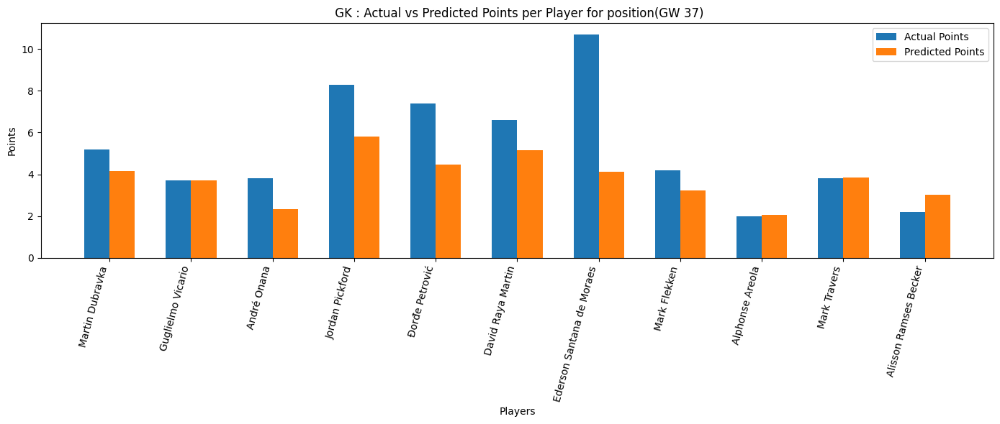

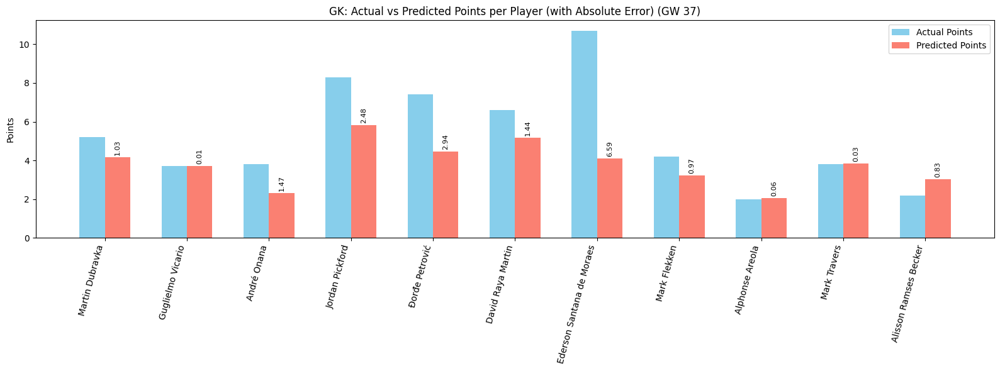

In [300]:
plot_preds(preds_df_37, 'GK', 37)


###### DEF


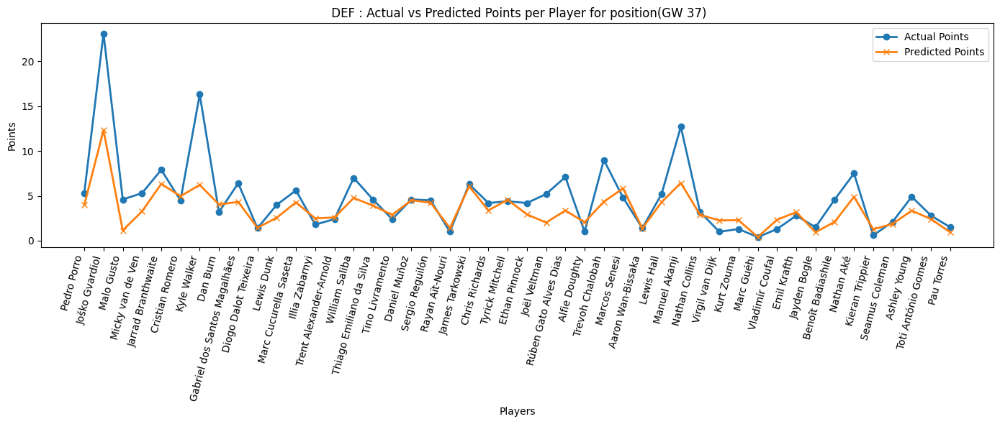

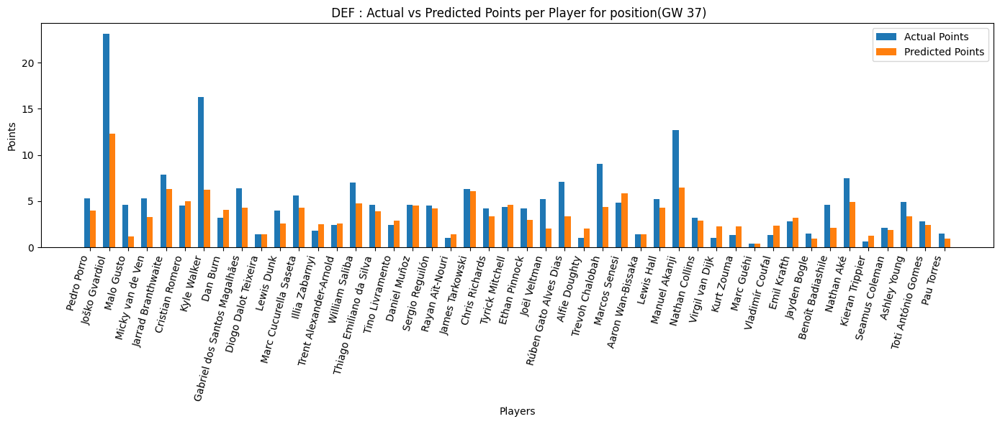

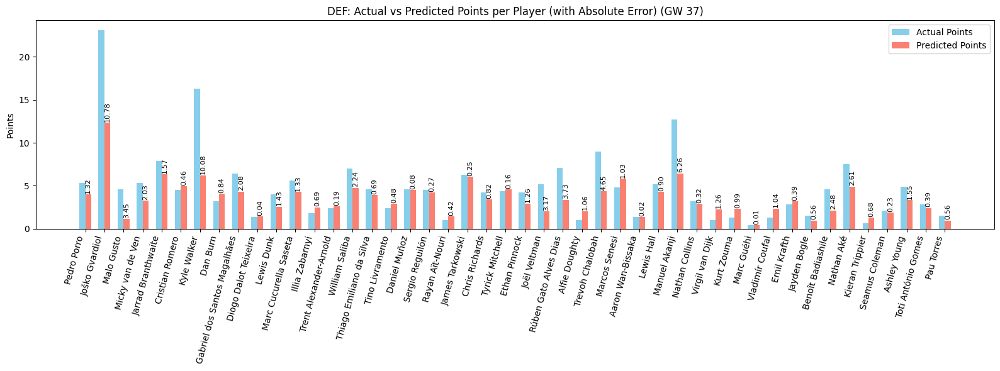

In [301]:
plot_preds(preds_df_37, 'DEF', 37)

###### MID


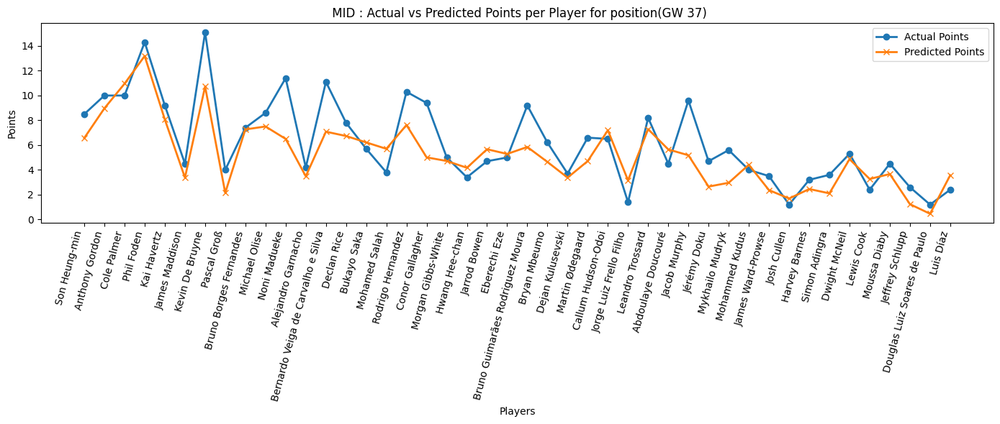

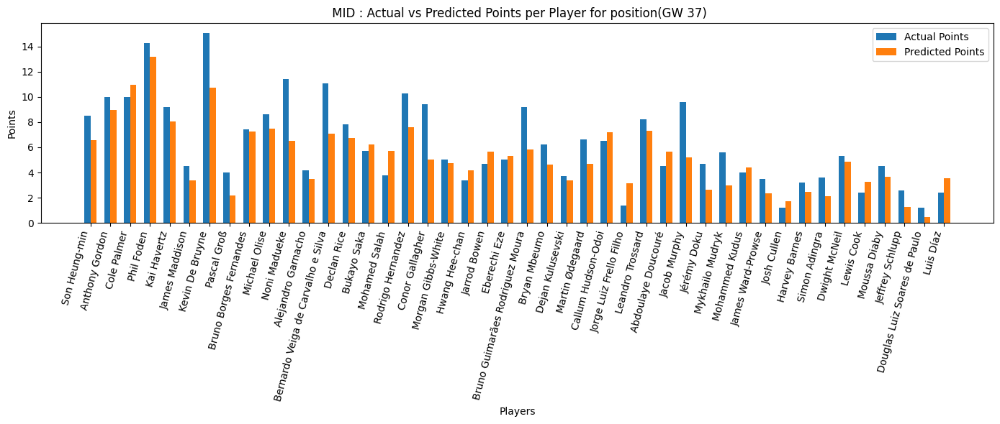

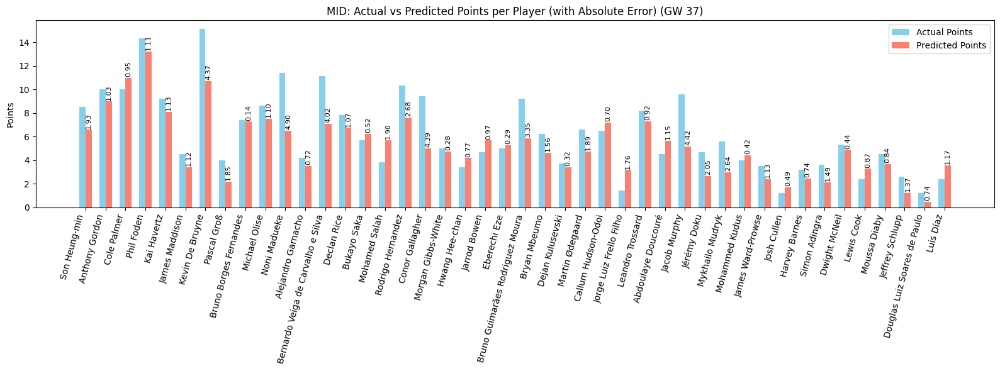

In [302]:
plot_preds(preds_df_37, 'MID', 37)

###### FWD


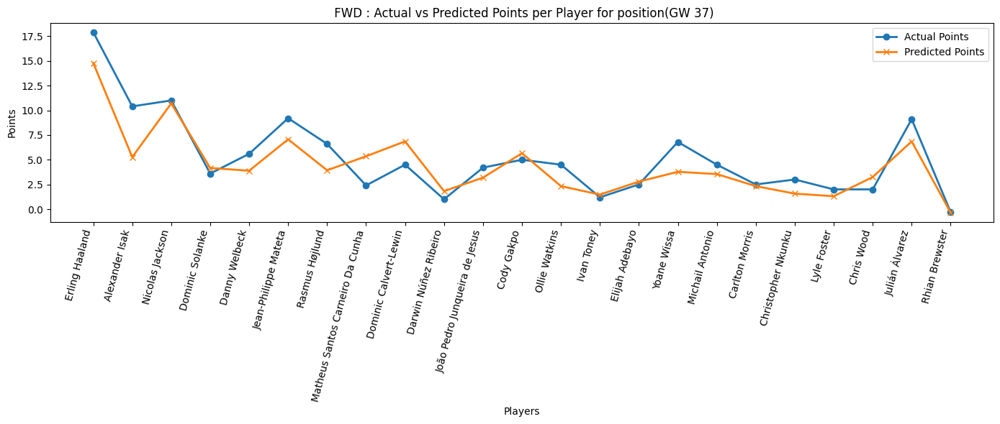

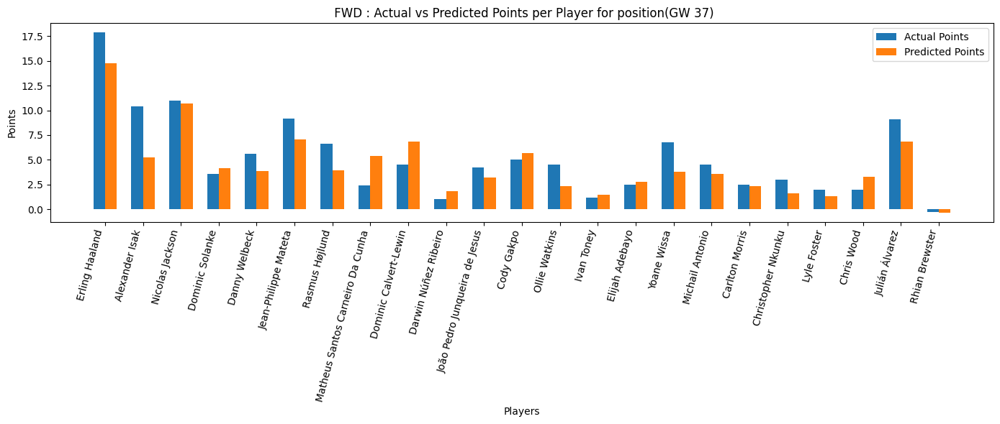

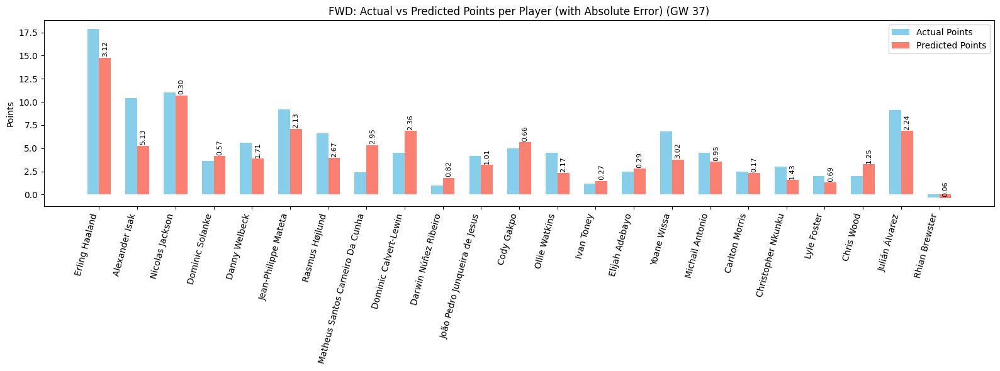

In [303]:
plot_preds(preds_df_37, 'FWD', 37)

#### Optimize


In [304]:
curr_data = final_df[final_df['round'] == 37].copy()
curr_data['xP_pred'] = Y_pred_37

players = curr_data[['fpl_id', 'fpl_name', 'team', 'value', 'position', 'xP_pred']].copy()
players['player_id'] = list(range(len(players)))

players.rename(columns={'fpl_name': 'name', 'value': 'price'}, inplace=True)
players = players.reset_index(drop=True)

selected_37 = run_pipeline(players)

# Get total points
players_selected_37 = curr_data[curr_data['fpl_id'].isin(selected_37['fpl_id'])].copy()
# players_selected_37 = players_selected_37.copy()
# 1. Create the rank column based on 'xp_preds'
# method='dense' ensures ties get the same rank, and the next rank is sequential
players_selected_37['xp_rank'] = players_selected_37['xP_pred'].rank(method='dense', ascending=False).astype(int)

# 2. Define the conditions and their corresponding multipliers
conditions = [
    players_selected_37['xp_rank'] == 1,  # Highest xp_preds
    players_selected_37['xp_rank'] == 2   # Second highest xp_preds
]
multipliers = [2.0, 1.5] # [multiplier for rank 1, multiplier for rank 2]

# 3. Use np.select() to apply the multiplier
# The 'default=1.0' means any rank other than 1 or 2 gets a 1.0 multiplier
players_selected_37['score'] = players_selected_37['score'] * np.select(conditions, multipliers, default=1.0)
total_points_37 = sum(players_selected_37['score'].values)
print(total_points_37, players_selected_37['score'].values, '--------->', players_selected_37['xP_pred'].values)

players_selected_37[['fpl_name', 'team', 'position', 'xP_pred', 'score']]

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-308.1859
IRL epoch 100/200 loss=-3293.4504
IRL epoch 150/200 loss=-13972.3135
IRL epoch 200/200 loss=-38207.7891
HGAT Policy Embeddings Shape: torch.Size([124, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
                  name              team position  price    xP_pred  \
7           Phil Foden   Manchester City      MID    8.5  13.187899   
14         Kai Havertz           Arsenal      MID    7.5   8.071460   
5       Anthony Gordon  Newcastle United      MID    6.4   8.967381   
6          Cole Palmer           Chelsea      MID    6.3  10.954268   
30       Michael Olise    Crystal Palace      MID    5.6   7.502513   
22     Jordan Pickford           Everton       GK    4.8   5.823426   
8       Erling Haaland   Manchester City      FWD   14.2  14.784342   
10     Nicolas Jackson           Chelsea      FWD    7.0  10.697787   
2       Joško Gvardiol   Manchester City      DEF    5.1  12.323650   
52     Ja

,fpl_name,team,position,xP_pred,score
4665,Joško Gvardiol,Manchester City,DEF,12.323650,27.0
4668,Anthony Gordon,Newcastle United,MID,8.967381,8.0
4669,Cole Palmer,Chelsea,MID,10.954268,14.0
4670,Phil Foden,Manchester City,MID,13.187899,16.5
4671,Erling Haaland,Manchester City,FWD,14.784342,30.0
4673,Nicolas Jackson,Chelsea,FWD,10.697787,7.0
4676,Jarrad Branthwaite,Everton,DEF,6.332082,6.0
4677,Kai Havertz,Arsenal,MID,8.071460,6.0
4685,Jordan Pickford,Everton,GK,5.823426,8.0
4693,Michael Olise,Crystal Palace,MID,7.502513,12.0


##### Rank


In [305]:
fg_managers_37 = fg_managers[fg_managers['gameweek'] == 37]
fg_managers_37[['points']]

position_37 = (fg_managers_37['points'] > total_points_37).sum() + 1
# 4. Display result
total_managers_37 = len(fg_managers_37)
percentile_37 = 100 * (1-(position_37 / total_managers_37))

print(total_points_37, total_managers_37)

print(f"Your predicted player’s total of {total_points_37} points would rank:")
print(f"→ Position: {position_37} out of {total_managers_37} managers")
print(f"→ Percentile: Top {percentile_37:.2f}%")


# Optional: show nearby ranks for context
nearby_37 = fg_managers_37.iloc[max(position_37-15,0):position_37+2][['points','prize']].reset_index(drop=True)
print("\nClosest scores around you:")
print(nearby_37)

143.5 243
Your predicted player’s total of 143.5 points would rank:
→ Position: 1 out of 243 managers
→ Percentile: Top 99.59%

Closest scores around you:
   points       prize
0   140.0  R 3,890.25
1   138.0  R 1,695.75
2   136.5  R 1,097.25


### GW 38


#### Predict


Data prepared. X shape: (4926, 177), M shape: (4926, 3), Y shape: (4926, 2)

Starting Training...
Epoch 1/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 15.4977 - mae: 3.1711 - mse: 15.2636 - val_loss: 6.5478 - val_mae: 1.8603 - val_mse: 6.3129
Epoch 2/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1531 - mae: 1.4986 - mse: 3.9180 - val_loss: 4.4534 - val_mae: 1.4521 - val_mse: 4.2184
Epoch 3/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.1807 - mae: 1.2845 - mse: 2.9458 - val_loss: 3.7884 - val_mae: 1.3157 - val_mse: 3.5537
Epoch 4/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.5972 - mae: 1.1391 - mse: 2.3626 - val_loss: 3.4780 - val_mae: 1.2395 - val_mse: 3.2436
Epoch 5/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3532 - mae: 1.0648 - mse: 2.1189 - val_loss: 3.3738 - val_mae: 1.2070 - val_mse: 3.1397
Epoch 6/10
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.2649 - mae: 1.0244 - mse: 2.0309 - val_loss: 3.2272 - val_mae: 1.1726 - val_mse: 2.9935


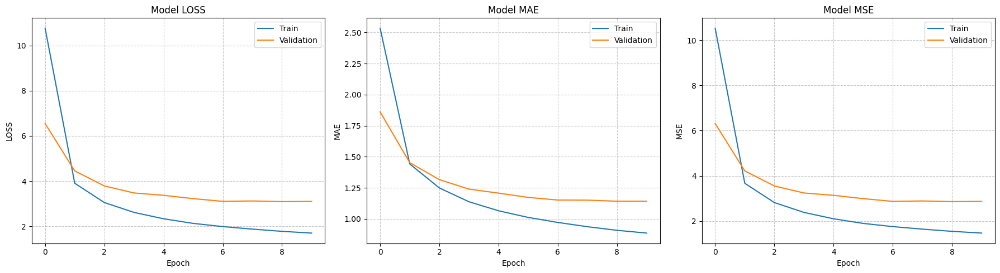


--- Final Test Set Evaluation (GW 38) ---

Evaluating test set performance...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Evaluating test set performance...{'loss': 2.081695318222046, 'mae': 0.9729674458503723, 'mse': 1.8489711284637451}
R²: 0.5879204107244398
MAE: 0.9729674458503723
MSE: 1.8489711284637451
Loss: 2.0816953182220459

Generating Predictions...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 

--- Results for Gameweek 38 ---
 Gameweek                             Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       38                     Joško Gvardiol       10.3         14.42       1.52     -2.13
       38                         Phil Foden        8.8         13.86       1.52     -2.13
       38                     Erling Haaland        8.2         11.25       1.52     -2.13
       38                    Kevin De Bruyne        5.2         10.70       1.52     -2.13
       38               Jean-Philippe Mateta        8.7          9.16       0.29     -0.31
       38 Bernardo Veiga de

In [306]:
train_data, test_data , GW_full, X_cols = transform_data(final_df, cols, 38)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_38 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_38.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_38 = model_38.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_38)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 38) ---")
test_result_38 = model_38.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_38, X_test_scaled, M_test_scaled, Y_test)
print(f"Evaluating test set performance...{test_result_38}")
print(f"R²: {evaluation_metrics['test_R2']:.16f}")
print(f"MAE: {evaluation_metrics['test_mae']:.16f}")
print(f"MSE: {evaluation_metrics['test_mse']:.16f}")
print(f"Loss: {evaluation_metrics['test_loss']:.16f}")


# Prediction
print("\nGenerating Predictions...")
Y_pred_38 = model_38.predict([X_test_scaled, M_test_scaled]).flatten()

position_38 = final_df['position'][test_mask]
teams_38 = final_df['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_38, 'team': teams_38, 'position': position_38}
preds_df_38 = pd.DataFrame(players_preds)


# Results
results_df_38 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_38,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 38 ---")
print(results_df_38.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))

##### Plots


###### GK


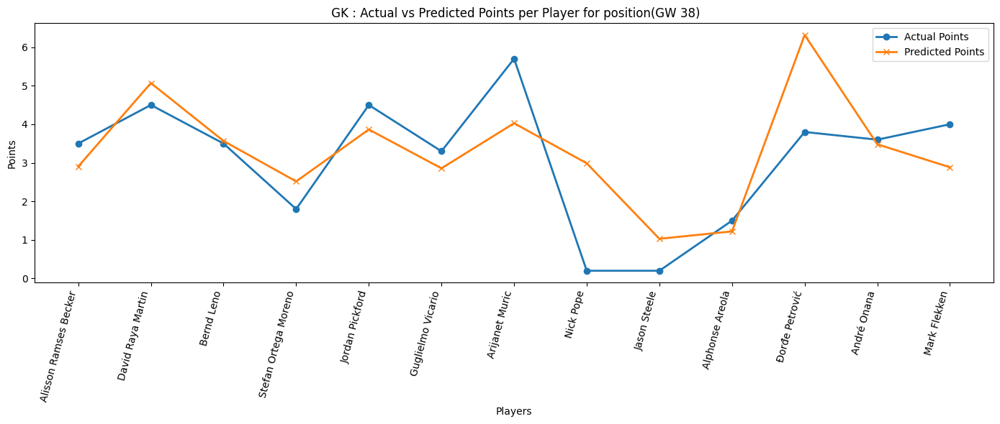

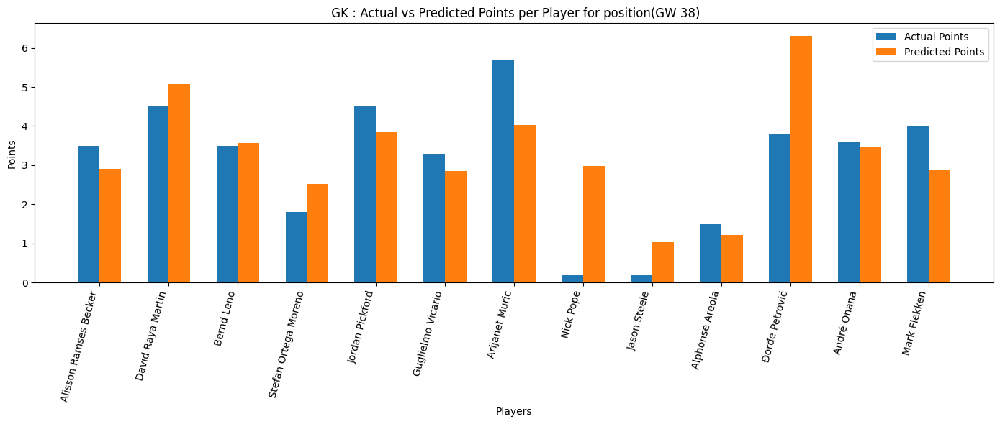

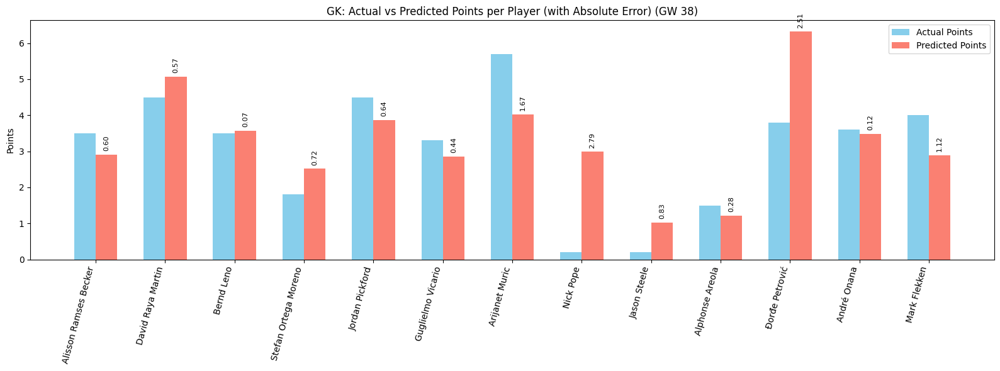

In [307]:
plot_preds(preds_df_38, 'GK', 38)


###### DEF


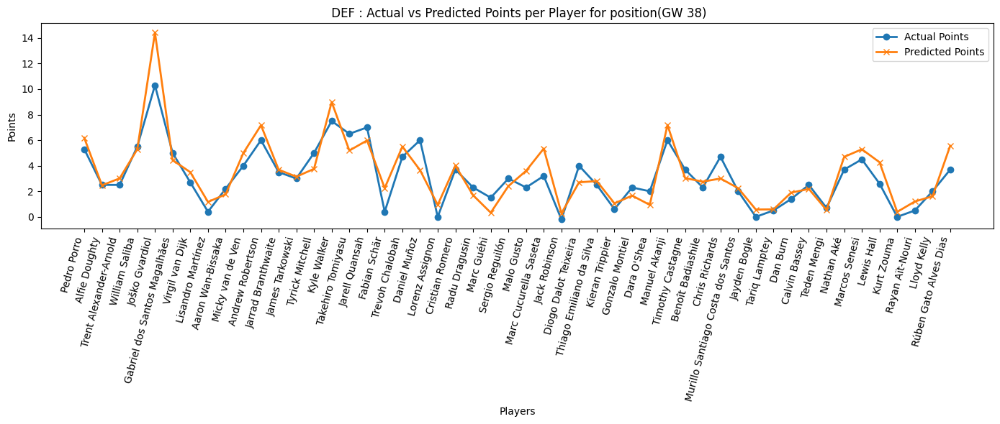

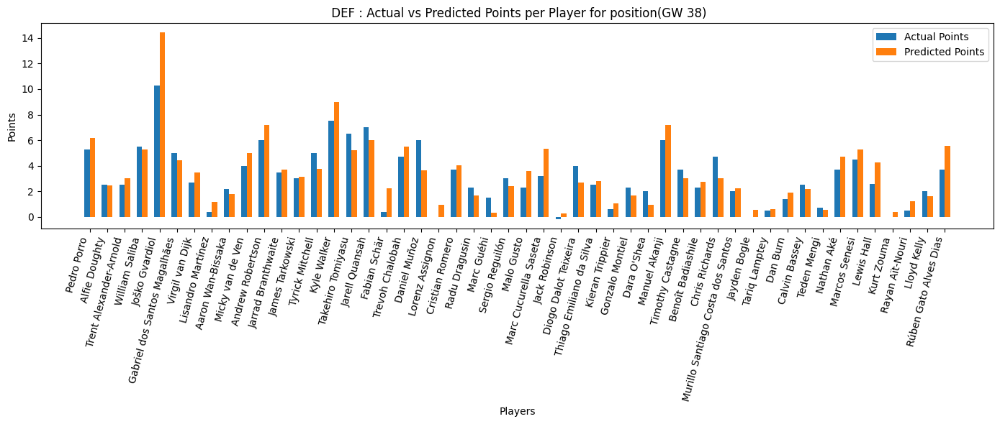

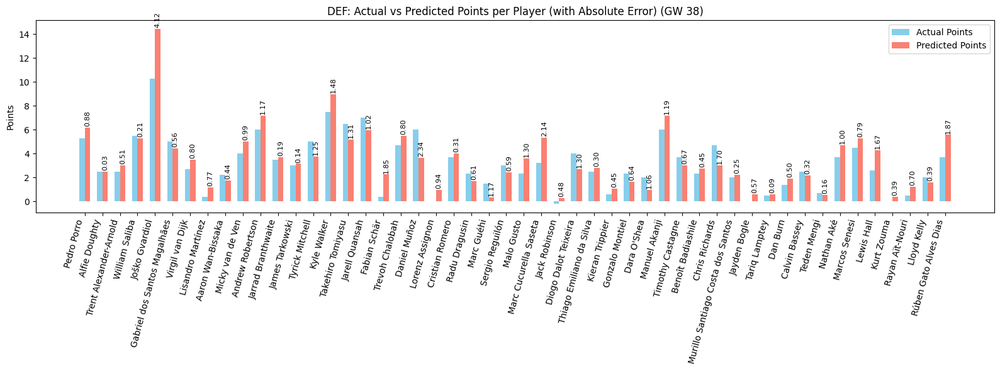

In [308]:
plot_preds(preds_df_38, 'DEF', 38)

###### MID


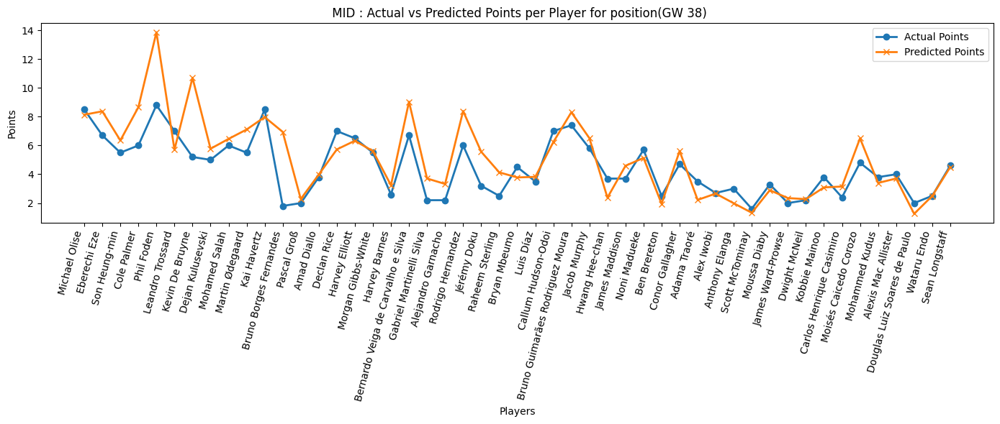

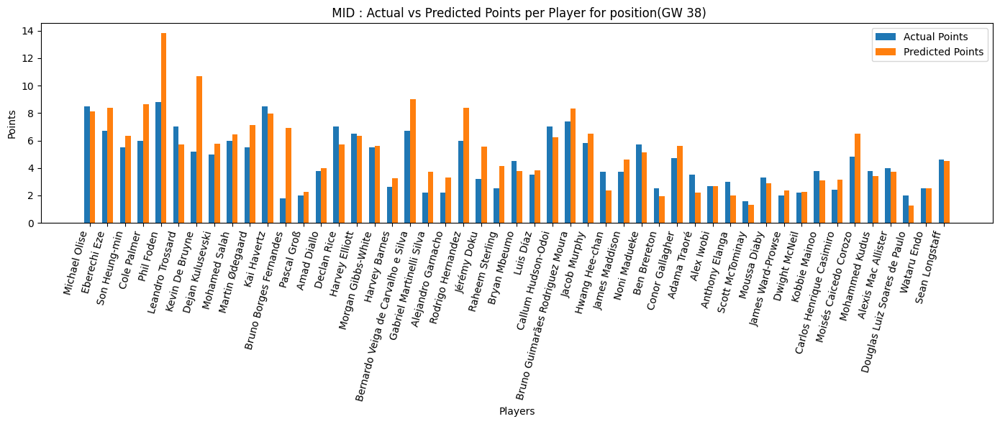

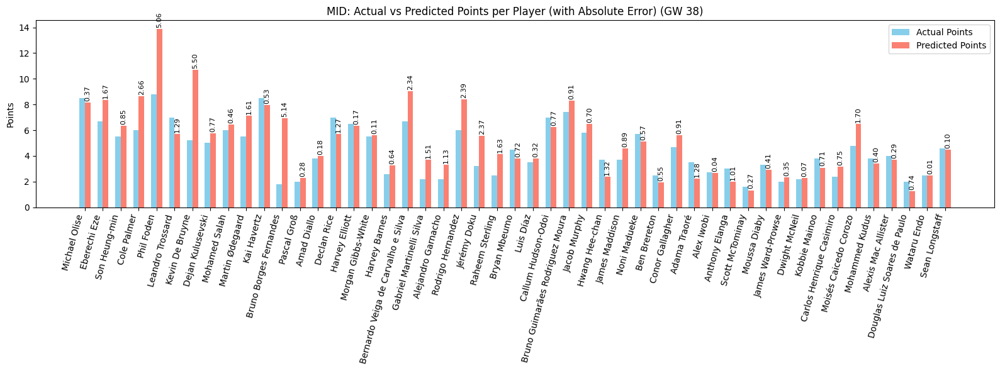

In [309]:
plot_preds(preds_df_38, 'MID', 38)

###### FWD


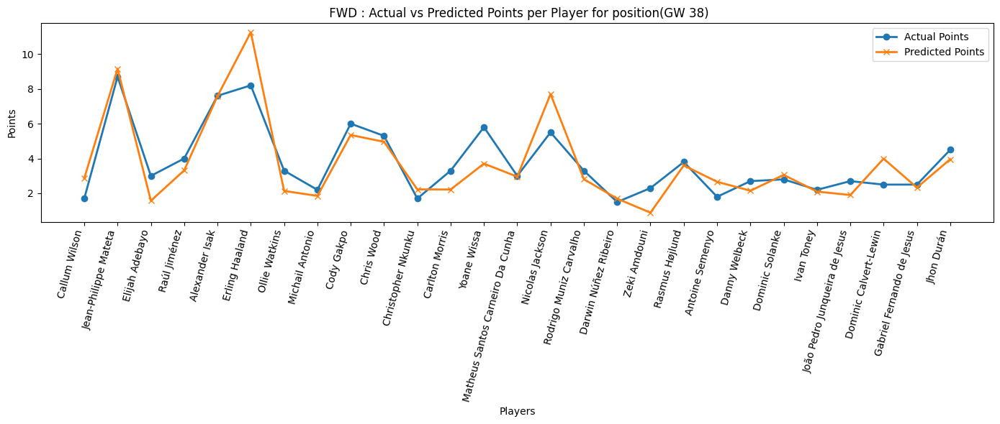

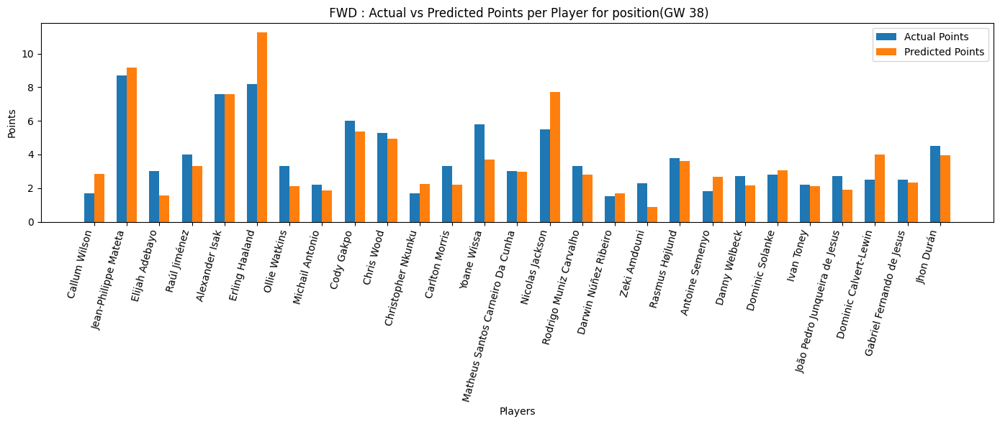

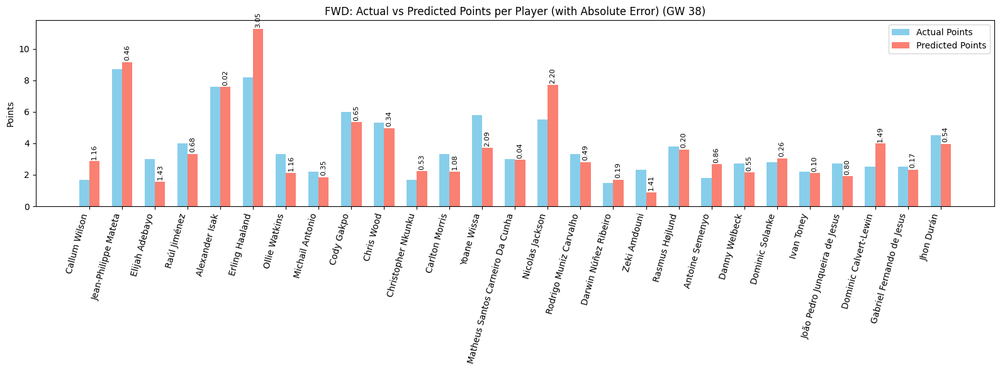

In [310]:
plot_preds(preds_df_38, 'FWD', 38)

#### Optimize


In [311]:
curr_data = final_df[final_df['round'] == 38].copy()
curr_data['xP_pred'] = Y_pred_38

players = curr_data[['fpl_id', 'fpl_name', 'team', 'value', 'position', 'xP_pred']].copy()
players['player_id'] = list(range(len(players)))

players.rename(columns={'fpl_name': 'name', 'value': 'price'}, inplace=True)
players = players.reset_index(drop=True)

selected_38 = run_pipeline(players)

# Get total points
players_selected_38 = curr_data[curr_data['fpl_id'].isin(selected_38['fpl_id'])].copy()
# players_selected_38 = players_selected_38.copy()
# 1. Create the rank column based on 'xp_preds'
# method='dense' ensures ties get the same rank, and the next rank is sequential
players_selected_38['xp_rank'] = players_selected_38['xP_pred'].rank(method='dense', ascending=False).astype(int)

# 2. Define the conditions and their corresponding multipliers
conditions = [
    players_selected_38['xp_rank'] == 1,  # Highest xp_preds
    players_selected_38['xp_rank'] == 2   # Second highest xp_preds
]
multipliers = [2.0, 1.5] # [multiplier for rank 1, multiplier for rank 2]

# 3. Use np.select() to apply the multiplier
# The 'default=1.0' means any rank other than 1 or 2 gets a 1.0 multiplier
players_selected_38['score'] = players_selected_38['score'] * np.select(conditions, multipliers, default=1.0)
total_points_38 = sum(players_selected_38['score'].values)
print(total_points_38, players_selected_38['score'].values, '--------->', players_selected_38['xP_pred'].values)

players_selected_38[['fpl_name', 'team', 'position', 'xP_pred', 'score']]

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-322.0937
IRL epoch 100/200 loss=-3487.9773


IRL epoch 150/200 loss=-14804.0576
IRL epoch 200/200 loss=-40505.2539
HGAT Policy Embeddings Shape: torch.Size([139, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
                               name               team position  price  \
14                       Phil Foden    Manchester City      MID    8.5   
13                      Cole Palmer            Chelsea      MID    6.3   
5                      Eberechi Eze     Crystal Palace      MID    6.0   
87  Bruno Guimarães Rodriguez Moura   Newcastle United      MID    5.8   
4                     Michael Olise     Crystal Palace      MID    5.7   
74                   Đorđe Petrović            Chelsea       GK    4.7   
22                   Erling Haaland    Manchester City      FWD   14.3   
8              Jean-Philippe Mateta     Crystal Palace      FWD    5.1   
30                 Andrew Robertson          Liverpool      DEF    6.5   
1                       Pedro Porro  Tottenham Hotspur      DEF    5.9   
19              

,fpl_name,team,position,xP_pred,score
4788,Pedro Porro,Tottenham Hotspur,DEF,6.177628,14.0
4791,Michael Olise,Crystal Palace,MID,8.132924,6.0
4792,Eberechi Eze,Crystal Palace,MID,8.372617,18.0
4795,Jean-Philippe Mateta,Crystal Palace,FWD,9.156607,20.0
4800,Cole Palmer,Chelsea,MID,8.656988,6.0
4801,Phil Foden,Manchester City,MID,13.856342,22.5
4806,Joško Gvardiol,Manchester City,DEF,14.424131,4.0
4809,Erling Haaland,Manchester City,FWD,11.250215,2.0
4817,Andrew Robertson,Liverpool,DEF,7.171242,8.0
4861,Đorđe Petrović,Chelsea,GK,6.314736,3.0


##### Rank


In [312]:
fg_managers_38 = fg_managers[fg_managers['gameweek'] == 38]
fg_managers_38[['points']]

position_38 = (fg_managers_38['points'] > total_points_38).sum() + 1
# 4. Display result
total_managers_38 = len(fg_managers_38)
percentile_38 = 100 * (1-(position_38 / total_managers_38))

print(total_points_38, total_managers_38)

print(f"Your predicted player’s total of {total_points_38} points would rank:")
print(f"→ Position: {position_38} out of {total_managers_38} managers")
print(f"→ Percentile: Top {percentile_38:.2f}%")


# Optional: show nearby ranks for context
nearby_38 = fg_managers_38.iloc[max(position_38-15,0):position_38+2][['points','prize']].reset_index(drop=True)
print("\nClosest scores around you:")
print(nearby_38)

119.5 256
Your predicted player’s total of 119.5 points would rank:
→ Position: 2 out of 256 managers
→ Percentile: Top 99.22%

Closest scores around you:
   points       prize
0   129.0  R 3,890.25
1   110.5  R 1,695.75
2   107.5    R 809.88
3   107.5    R 809.88


### Results


In [313]:
gameweeks = range(31, 39)

results = {
    'gameweek': list(gameweeks),
    'score': [globals()[f'total_points_{gw}'] for gw in gameweeks],
    'position': [globals()[f'position_{gw}'] for gw in gameweeks],
    'total_managers': [globals()[f'total_managers_{gw}'] for gw in gameweeks],
    'percentile': [globals()[f'percentile_{gw}'] for gw in gameweeks],
    'players': [globals().get(f'players_selected_{gw}', pd.DataFrame(columns=['fpl_name']))['fpl_name'].tolist() for gw in gameweeks]
}
pd.DataFrame(results)


,gameweek,score,position,total_managers,percentile,players
0,31,118.0,1,217,99.539171,"[Phil Foden, Cole Palmer, Alexander Isak, Will..."
1,32,90.0,3,234,98.717949,"[Gabriel dos Santos Magalhães, Kevin De Bruyne..."
2,33,123.0,1,246,99.593496,"[Joško Gvardiol, Mohamed Salah, Bruno Borges F..."
3,34,168.0,1,203,99.507389,"[Kai Havertz, Martin Ødegaard, Jean-Philippe M..."
4,35,97.0,4,207,98.067633,"[Jordan Pickford, Joško Gvardiol, Cole Palmer,..."
5,36,127.0,1,229,99.563319,"[Joško Gvardiol, Andrew Robertson, Phil Foden,..."
6,37,143.5,1,243,99.588477,"[Joško Gvardiol, Anthony Gordon, Cole Palmer, ..."
7,38,119.5,2,256,99.218750,"[Pedro Porro, Michael Olise, Eberechi Eze, Jea..."
